In [1]:
#@title Cargar modulos
import pandas as pd
import numpy as np
import seaborn as sn
import matplotlib.pyplot as plt
import matplotlib.colors as colors #para escala logaritmica el colorbar

from matplotlib.lines import Line2D
from matplotlib.lines import Line2D
from time import time
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier #clasificar
from sklearn.neural_network import MLPRegressor #predecir
from sklearn.externals import joblib #Para guardar la red entrenada

/usr/local/lib/python3.7/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


#Sincronizar con el Drive

In [2]:
#Para conectarse al Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Transformada de Fourier
Para definir la distancia para tomar datos de gravimetría, emplee la Transformada Rápida de Fourier (FFT) disponible del módulo de Numpy, y obtener las frecuencias de cada anomalía.

Para ello a partir de obtener la anomalía de los modelos gravimétricos iniciales realizados para la propuesta de investigación:

* Cavidad a 50m de profundidad.
* Falla Los Santos como falla de inversa.
* Falla Los Santos como falla normal.
* Falla Los Santos como falla de rumbo.

Conocidas las frecuencias, considerando ahora el Teorema de Nyquist, el cual hace referencia a la frecuencia de muestreo requerida para reconstruir una onda de interés. Se generaliza que se debe muestrear a una frecuencia al menos dos veces mayor a la frecuencia de interés. 

Teniendo en cuenta el Teorema de Nyquist, a cada anomalía estudiada mediante la FFT, se analizará cual será la frecuencia mayor, y se considerará esta como la de interés, y el doble de la misma será la frecuencia de muestreo ($fm$) para el respectivo modelo gravimétrico.

Seleccionada la frecuencia de muestreo y considerado el Teorema de Nyquist, para conocer la distancia en metros ($D$), divido la frecuencia entre 1 y así obtener la distancia de muestreo de interés.

$D = \frac{1}{fm}$

Todos los modelos se realizaron en un perfil de 1km de longitud, y cada 1m se tiene registro de la anomalía.



In [3]:
#@title Cargar cada anomalia
rutaCavidad = "/content/drive/MyDrive/LosSantos/anomaliaCavidad.csv"
rutaFallaInversa = "/content/drive/MyDrive/LosSantos/anomaliaFallaInversa.csv"
rutaFallaNormal = "/content/drive/MyDrive/LosSantos/anomaliaFallaNormal.csv"
rutaFallaRumbo = "/content/drive/MyDrive/LosSantos/anomaliaFallaRumbo.csv"

grav_Cavidad = pd.read_csv(rutaCavidad, decimal='.')
grav_FallaInversa = pd.read_csv(rutaFallaInversa, decimal='.')
grav_FallaNormal = pd.read_csv(rutaFallaNormal, decimal='.')
grav_FallaRumbo = pd.read_csv(rutaFallaRumbo, decimal='.')


In [ ]:
#@title Se extraen los valores
#se extraen solo los valores de la anomalia
anomalia_Cavidad = grav_Cavidad['anomalia'].copy()
anomalia_FallaInversa = grav_FallaInversa['anomalia'].copy()
anomalia_FallaNormal = grav_FallaNormal['anomalia'].copy()
anomalia_FallaRumbo = grav_FallaRumbo['anomalia'].copy()

#se restara a cada anomalia su valor maximo para dejar solo los "residuales"
anomalia_Cavidad2 = anomalia_Cavidad - anomalia_Cavidad.max()
anomalia_FallaInversa2 = anomalia_FallaInversa - anomalia_FallaInversa.max()
anomalia_FallaNormal2 = anomalia_FallaNormal - anomalia_FallaNormal.max()
anomalia_FallaRumbo2 = anomalia_FallaRumbo - anomalia_FallaRumbo.max()


In [ ]:
n = 1 #distancia en metros de cada cuanto se tienen los datos del modelo
#n se usará en la Frecuencia de muestreo requerida para recuperar las frecuencias en la FFT

x = np.arange(0, len(anomalia_Cavidad), n) #ubicacion de cada anomalia en el eje X

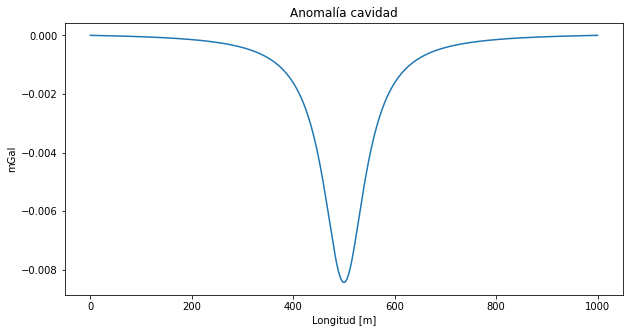

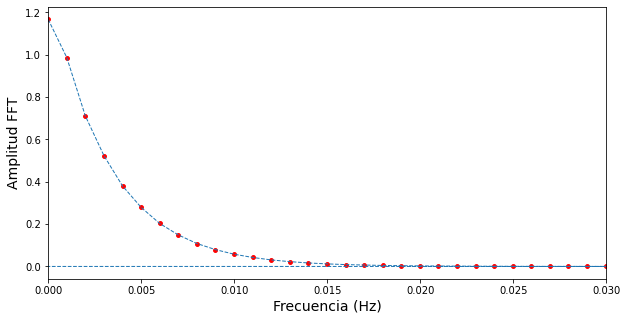

Frecuencia maxima:  0.015 Hz
Teorema de Nyquist:  0.03 Hz
Se deberían tomar datos cada:  33.333333333333336 m


In [ ]:
#@title Cavidad
plt.figure(figsize=(10,5)) 
plt.plot(x, anomalia_Cavidad2)
plt.xlabel('Longitud [m]')
plt.ylabel('mGal')
plt.title('Anomalía cavidad')
plt.show()

#se realiza la FFT
fft_cavidad = np.fft.fft(anomalia_Cavidad2)
mag_cavidad = abs(fft_cavidad) #magnitudes de la FFT
Fs = n #la frecuencia con que se muestreo originalmente la anomalia
frq = np.fft.fftfreq(n=len(x), d=Fs)

#grafica de la FFT
print('\n')
plt.figure(figsize=(10,5))
plt.plot(frq, mag_cavidad, '--',lw=1)
plt.scatter(frq, mag_cavidad, c='r', s=15)
plt.xlabel('Frecuencia (Hz)', fontsize='14')
plt.ylabel('Amplitud FFT', fontsize='14')
plt.xlim(0,0.03) #ajustar al rango adecuado para verlas frecuencias
plt.show()

#calcular la distancia de muestreo 
frecMax = 0.015 #la frecuencia maxima de nuestra anomalia
frec_Nyquist = frecMax * 2
dist_muestreo = 1/frec_Nyquist

print('Frecuencia maxima: ', frecMax, 'Hz')
print('Teorema de Nyquist: ', frec_Nyquist, 'Hz')
print('Se deberían tomar datos cada: ', dist_muestreo, 'm')

Para la cavidad se puede considerar la frecuencia máxima como 0.015Hz, por lo que la frecuencia de muestreo correspondería a 0.03Hz.

Muestreo = 1/0.03 = 33.33m



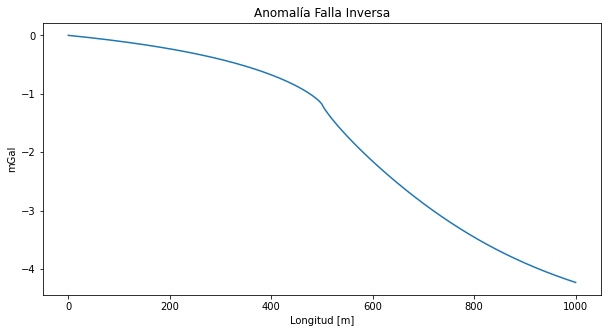

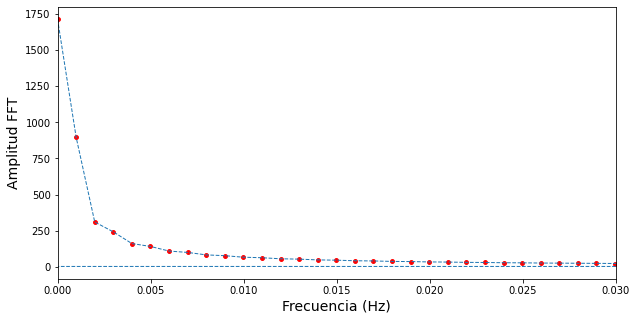

Frecuencia maxima:  0.01 Hz
Teorema de Nyquist:  0.02 Hz
Se deberían tomar datos cada:  50.0 m


In [ ]:
#@title Falla inversa
plt.figure(figsize=(10,5)) 
plt.plot(x, anomalia_FallaInversa2)
plt.xlabel('Longitud [m]')
plt.ylabel('mGal')
plt.title('Anomalía Falla Inversa')
plt.show()

#se realiza la FFT
fft_fallaInversa = np.fft.fft(anomalia_FallaInversa2)
mag_fallaInversa = abs(fft_fallaInversa) #magnitudes de la FFT
Fs = n #la frecuencia con que se muestreo originalmente la anomalia
frq = np.fft.fftfreq(n=len(x), d=Fs)

#grafica de la FFT
print('\n')
plt.figure(figsize=(10,5))
plt.plot(frq, mag_fallaInversa, '--',lw=1)
plt.scatter(frq, mag_fallaInversa, c='r', s=15)
plt.xlabel('Frecuencia (Hz)', fontsize='14')
plt.ylabel('Amplitud FFT', fontsize='14')
plt.xlim(0,0.03) #ajustar al rango adecuado para verlas frecuencias
plt.show()

#calcular la distancia de muestreo 
frecMax = 0.01 #la frecuencia maxima de nuestra anomalia
frec_Nyquist = frecMax * 2
dist_muestreo = 1/frec_Nyquist

print('Frecuencia maxima: ', frecMax, 'Hz')
print('Teorema de Nyquist: ', frec_Nyquist, 'Hz')
print('Se deberían tomar datos cada: ', dist_muestreo, 'm')

Para la falla inversa se pueden considerar que a partir de 0.01Hz es poca el aporte de las otras ondas, por lo que se toma este como la frecuencia máxima. Por lo que la frecuencia de muestreo correspondería a 0.02Hz.

Muestreo = 1/0.02 = 50m


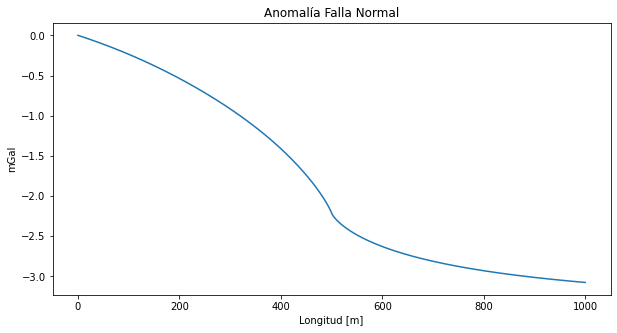

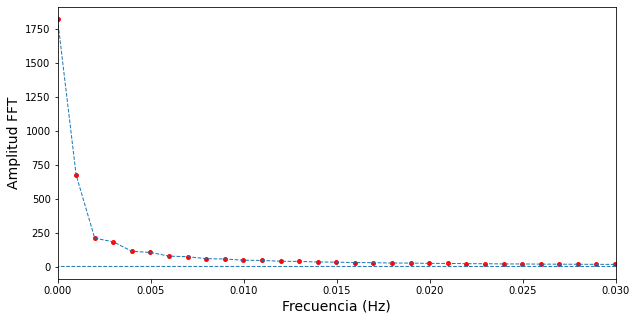

Frecuencia maxima:  0.01 Hz
Teorema de Nyquist:  0.02 Hz
Se deberían tomar datos cada:  50.0 m


In [ ]:
#@title Falla normal
plt.figure(figsize=(10,5)) 
plt.plot(x, anomalia_FallaNormal2)
plt.xlabel('Longitud [m]')
plt.ylabel('mGal')
plt.title('Anomalía Falla Normal')
plt.show()

#se realiza la FFT
fft_fallaNormal = np.fft.fft(anomalia_FallaNormal2)
mag_fallaNormal = abs(fft_fallaNormal) #magnitudes de la FFT
Fs = n #la frecuencia con que se muestreo originalmente la anomalia
frq = np.fft.fftfreq(n=len(x), d=Fs)

#grafica de la FFT
print('\n')
plt.figure(figsize=(10,5))
plt.plot(frq, mag_fallaNormal, '--',lw=1)
plt.scatter(frq, mag_fallaNormal, c='r', s=15)
plt.xlabel('Frecuencia (Hz)', fontsize='14')
plt.ylabel('Amplitud FFT', fontsize='14')
plt.xlim(0,0.03) #ajustar al rango adecuado para verlas frecuencias
plt.show()

#calcular la distancia de muestreo 
frecMax = 0.01 #la frecuencia maxima de nuestra anomalia
frec_Nyquist = frecMax * 2
dist_muestreo = 1/frec_Nyquist

print('Frecuencia maxima: ', frecMax, 'Hz')
print('Teorema de Nyquist: ', frec_Nyquist, 'Hz')
print('Se deberían tomar datos cada: ', dist_muestreo, 'm')

Para la falla normal también  se considerar que a partir de 0.01Hz es poca el aporte de las otras ondas, por lo que se toma este como la frecuencia máxima. Por lo que la frecuencia de muestreo correspondería a 0.02Hz.

Muestreo = 1/0.02 = 50m


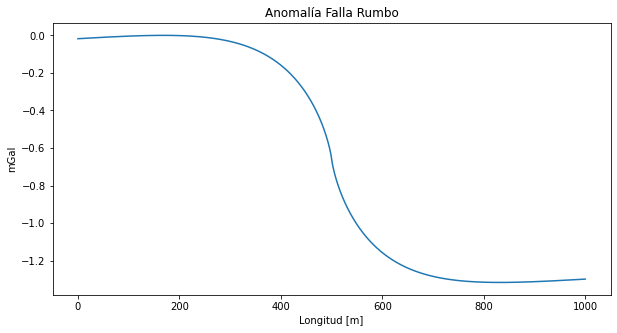

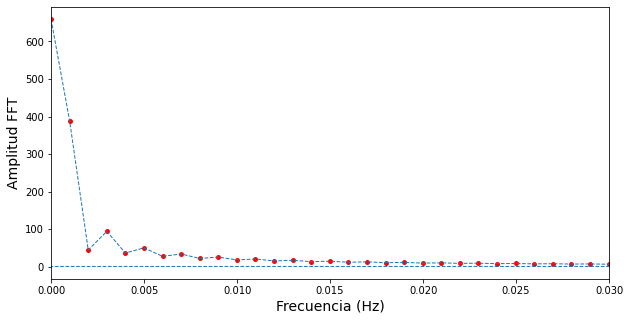

Frecuencia maxima:  0.01 Hz
Teorema de Nyquist:  0.02 Hz
Se deberían tomar datos cada:  50.0 m


In [ ]:
#@title Falla rumbo
plt.figure(figsize=(10,5)) 
plt.plot(x, anomalia_FallaRumbo2)
plt.xlabel('Longitud [m]')
plt.ylabel('mGal')
plt.title('Anomalía Falla Rumbo')
plt.show()

#se realiza la FFT
fft_fallaRumbo = np.fft.fft(anomalia_FallaRumbo2)
mag_fallaRumbo = abs(fft_fallaRumbo) #magnitudes de la FFT
Fs = n #la frecuencia con que se muestreo originalmente la anomalia
frq = np.fft.fftfreq(n=len(x), d=Fs)

#grafica de la FFT
print('\n')
plt.figure(figsize=(10,5))
plt.plot(frq, mag_fallaRumbo, '--',lw=1)
plt.scatter(frq, mag_fallaRumbo, c='r', s=15)
plt.xlabel('Frecuencia (Hz)', fontsize='14')
plt.ylabel('Amplitud FFT', fontsize='14')
plt.xlim(0,0.03) #ajustar al rango adecuado para verlas frecuencias
plt.show()

#calcular la distancia de muestreo 
frecMax = 0.01 #la frecuencia maxima de nuestra anomalia
frec_Nyquist = frecMax * 2
dist_muestreo = 1/frec_Nyquist

print('Frecuencia maxima: ', frecMax, 'Hz')
print('Teorema de Nyquist: ', frec_Nyquist, 'Hz')
print('Se deberían tomar datos cada: ', dist_muestreo, 'm')

Para la falla de rumbo también se considerar que a partir de 0.01Hz es poca el aporte de las otras ondas, por lo que se toma este como la frecuencia máxima. Por lo que la frecuencia de muestreo correspondería a 0.02Hz.

Muestreo = 1/0.02 = 50m


# Propiedades físicas de la roca

In [4]:
#Se cargan los datos obtenidos en el laboratorio
rutaPetrofisica = "/content/drive/MyDrive/LosSantos/petrofisicaLosSantosFinal.csv"
df_petrofisica = pd.read_csv(rutaPetrofisica, sep=',', decimal='.')
df_petrofisica.head()

,Muestra,Estacion,MuestraNew,X,Y,Z,Formacion Geologica,Unidad,Litologia,Agua gr,Porosidad,Densidad gr/cm3,resistividad seco,resistividad humedo,cargabilidad seco,cargabilidad humedo,P. Velocity m/s,PEAK LOAD,Is50 real Mpa,Distancia Falla m
0,Ls6-04a,LSN-06,LSN-06a,1115132.61,1257617.41,1443.0,Fm. Jordan,J1-2j,arenisca,1.73,8.64,2.64,514420.48,1354.95,17.02,10.78,2138,8.72,2.85,447.67
1,Ls6-04b,LSN-06,LSN-06b,1115132.61,1257617.41,1443.0,Fm. Jordan,J1-2j,arenisca,1.73,7.24,2.63,424014.55,1708.79,13.07,13.13,1607,10.02,3.21,447.67
2,Ls6-16-2,LSN-06,LSN-06c,1115132.61,1257617.41,1443.0,Fm. Jordan,J1-2j,arenisca,1.44,2.49,2.63,13364.01,395.97,6.91,9.08,2476,11.62,3.53,447.67
3,Ls6-29,LSN-25,LSN-25,1108385.44,1252522.79,1383.0,Fm. Jordan,J1-2j,arenisca,2.03,4.27,2.64,146491.07,1122.32,11.56,12.35,3138,8.52,2.92,953.90
4,Ls6-30a,LSN-26,LSN-26a,1107487.32,1253319.25,1457.0,Fm. Jordan,J1-2j,arenisca,2.72,6.85,2.61,932321.51,2418.12,29.82,5.56,4209,11.72,3.60,461.24


In [5]:
#@title Renombro columnas
petrofisica = df_petrofisica.copy()
petrofisica.columns
nuevasColumnas = ['MuestraOld',
                  'Estacion',
                  'MuestraNew',
                  'coorX', #en m
                  'coorY', #en m
                  'coorZ', #en m
                  'Formacion',
                  'Unidad',
                  'Litologia',
                  'Agua', #en gr
                  'Porosidad', #en %
                  'Densidad', #en gr/cc
                  'RhoDry', #en ohm*m
                  'RhoWet', #en ohm*m
                  'CargDry',
                  'CargWet', 
                  'Vp', #en m/s
                  'PeakLoad', #en kN
                  'Is50', #en Mpa
                  'DistFault'] #en m
petrofisica.columns = nuevasColumnas
petrofisica.head()

,MuestraOld,Estacion,MuestraNew,coorX,coorY,coorZ,Formacion,Unidad,Litologia,Agua,Porosidad,Densidad,RhoDry,RhoWet,CargDry,CargWet,Vp,PeakLoad,Is50,DistFault
0,Ls6-04a,LSN-06,LSN-06a,1115132.61,1257617.41,1443.0,Fm. Jordan,J1-2j,arenisca,1.73,8.64,2.64,514420.48,1354.95,17.02,10.78,2138,8.72,2.85,447.67
1,Ls6-04b,LSN-06,LSN-06b,1115132.61,1257617.41,1443.0,Fm. Jordan,J1-2j,arenisca,1.73,7.24,2.63,424014.55,1708.79,13.07,13.13,1607,10.02,3.21,447.67
2,Ls6-16-2,LSN-06,LSN-06c,1115132.61,1257617.41,1443.0,Fm. Jordan,J1-2j,arenisca,1.44,2.49,2.63,13364.01,395.97,6.91,9.08,2476,11.62,3.53,447.67
3,Ls6-29,LSN-25,LSN-25,1108385.44,1252522.79,1383.0,Fm. Jordan,J1-2j,arenisca,2.03,4.27,2.64,146491.07,1122.32,11.56,12.35,3138,8.52,2.92,953.90
4,Ls6-30a,LSN-26,LSN-26a,1107487.32,1253319.25,1457.0,Fm. Jordan,J1-2j,arenisca,2.72,6.85,2.61,932321.51,2418.12,29.82,5.56,4209,11.72,3.60,461.24


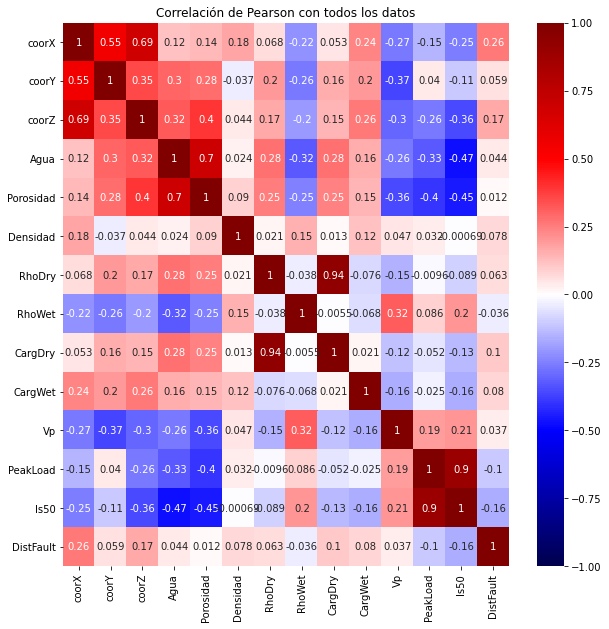

In [ ]:
#@title Correlación de Pearson
corrMatrix = petrofisica.corr()

plt.figure(figsize=(10,10))
sn.heatmap(corrMatrix, cmap='seismic', annot=True,
           vmin=-1, vmax=1)
plt.title('Correlación de Pearson con todos los datos')
plt.savefig(('/content/drive/MyDrive/LosSantos/Pearson/PearsonAllData.png'),
            format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
plt.show()

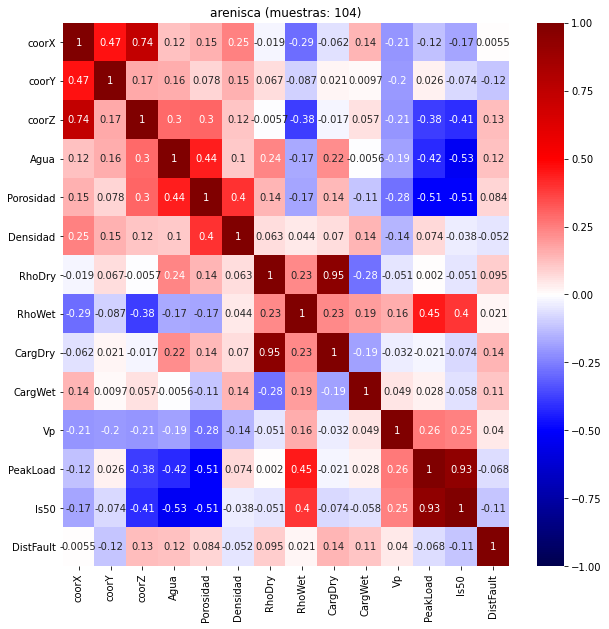

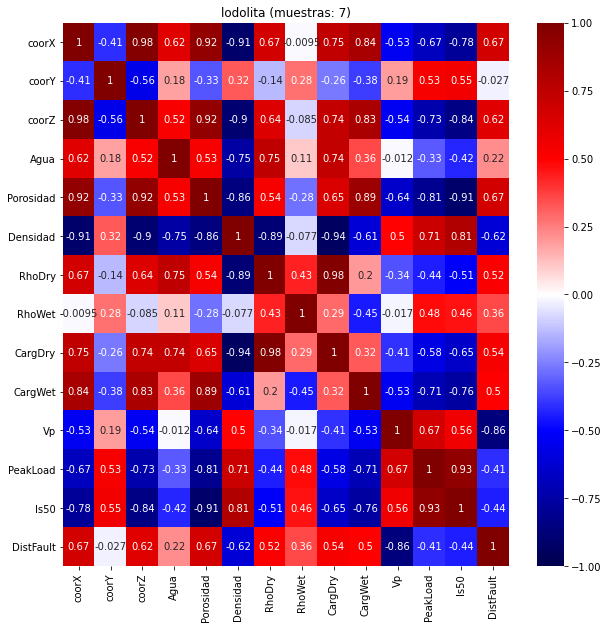

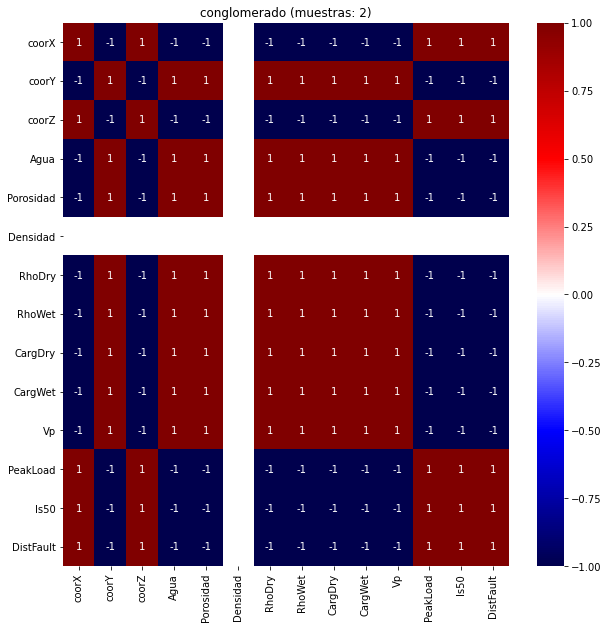

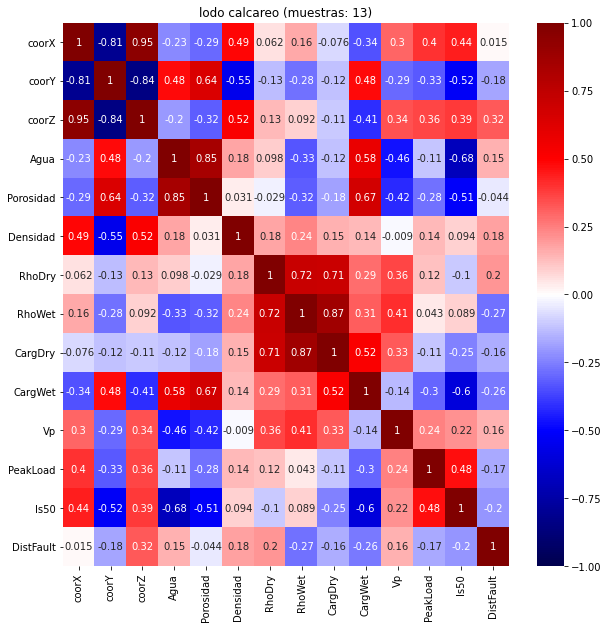

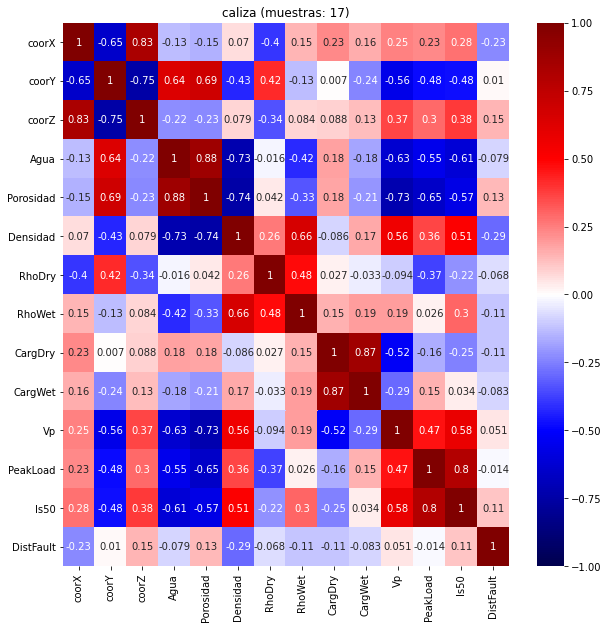

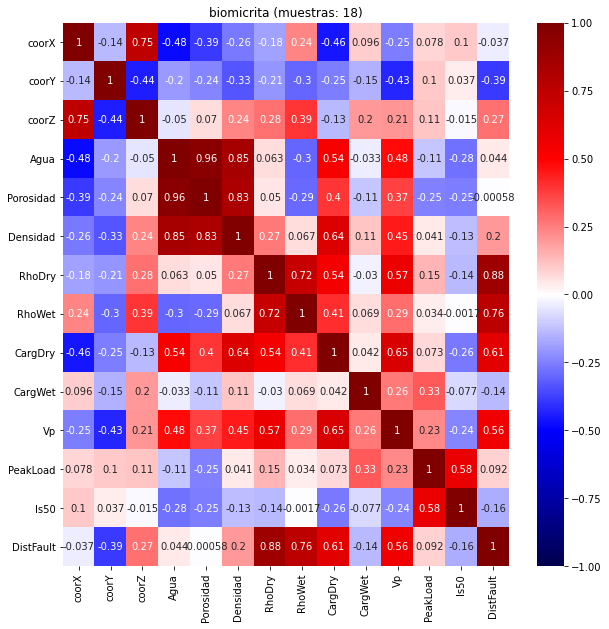

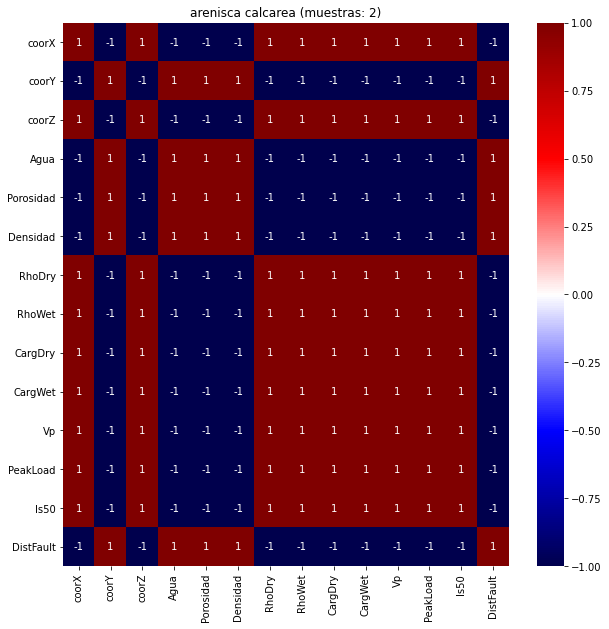

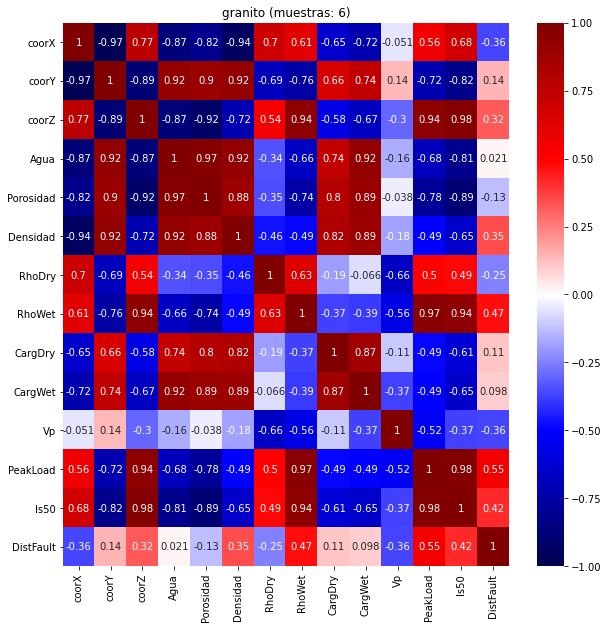

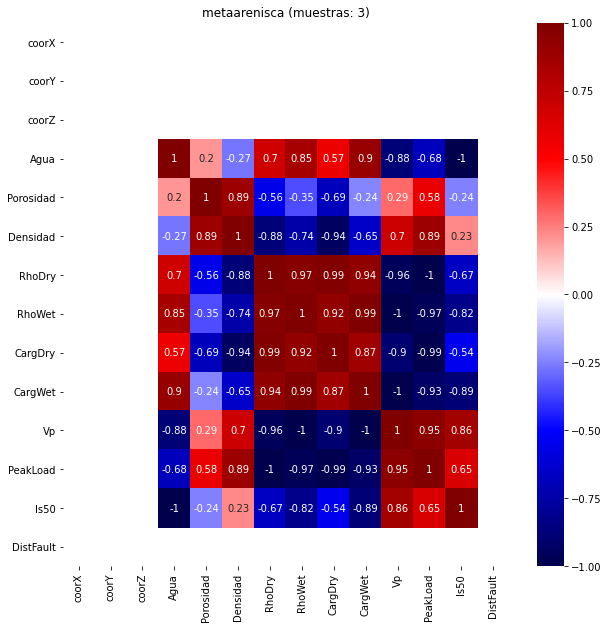

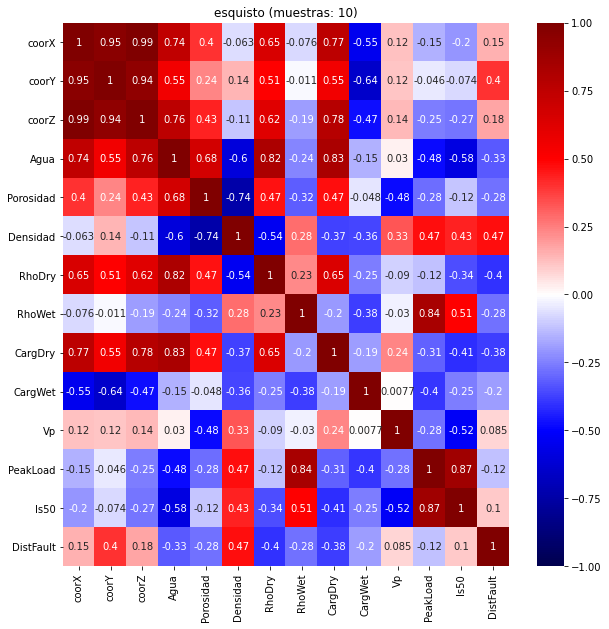

In [ ]:
#@title Correlación de Pearson por litologia 
litos_u = petrofisica['Litologia'].unique()

for i in litos_u:
  filtro_corr = petrofisica['Litologia'] == i
  corrMatrix2 = petrofisica[filtro_corr].corr()
  plt.figure(figsize=(10,10))
  sn.heatmap(corrMatrix2, cmap='seismic', annot=True,
           vmin=-1, vmax=1)
  plt.title(('{} (muestras: {})').format(i, len(petrofisica[filtro_corr])))
  plt.savefig(('/content/drive/MyDrive/LosSantos/Pearson/Pearson_{}.png').format(i),
              format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
  plt.show()
  print('\n')

El coeficiente de correlación de Pearson es una medida que permite conocer la dependencia lineal entre dos variables. Con resultados entre +1 y -1, entre más cercano el resultado este a 1, sea + o -, indica una linealidad entre las dos variables, si el valor es + se interpreta como que si una variable crece la otra también lo hará. Si el valor es – se interpreta como que, si una variable crece, la otra decrece. Los valores cercanos a 0 se interpretan como variables sin una relación lineal entre ellos.

Para **todos los datos**, no se aprecia una correlación clara entre variables, solo entre la Porosidad y el Agua, la variable Agua es la cantidad de agua en gr resultado pesar la muestra en seco y posteriormente dejarla sumergida 2 días y de nuevo pesada. La relación Porosidad-Agua es de 0.7, indicando una linealidad entre las dos variables, entendible al saber que a mayor porosidad mayor cantidad de agua que pueda retener.

Para **todos los resultados**, algunas de las relaciones visibles son:
* Porosidad-Agua: la variable Agua es la cantidad de agua en gr resultado de la diferencia entre pesar la muestra en seco y posteriormente dejarla sumergida 2 días para ser de nuevo pesada. La relación Porosidad-Agua es de 0.7, indicando una linealidad entre las dos variables, entendible al saber que a mayor porosidad mayor cantidad de agua que pueda retener.
* CargDry-RhoDry: la cargabilidad en seco y resistividad en seco presentan una relación de 0.94, indicando una relación lineal.
* Vp-Porosidad: un valor de -0.37, asociable a conforme aumenta la porosidad la velocidad de la onda P va a disminuir. 
* PeakLoad-Porosidad: un valor de -0.4, nuevamente la porosidad afecta la muestra haciéndola más frágil, ya que la carga máxima que soporta la muestra disminuye a mayor porosidad en la misma.
* Is50-PeakLoad: un valor de 0.94, esta relación es bastante notoria, debido a que la carga máxima soportada por la muestra se emplea para calcular el Is50, que es la resistencia bajo una carga puntual tomando como referencia un cilindro de 50mm.
* Is50-Porosidad: un valor de -0.45, semejante a PeakLoad-Porosidad, y entendible al ver la linealidad de Is50-PeakLoad.

Algunos valores están más cercanos a 0 que a +/- 1 por lo que no los expreso de momento, pero aun así se podría llegar a tener en cuenta.

Como observación algunas relaciones no se pueden considerar como la de *PeakLoad-Agua*, con un valor de -0.33, ya que para calcular la carga máxima y la velocidad de onda P la muestra se dejó secar nuevamente, por lo que considerar una relación directa entre estas variables no es adecuado. Igualmente, relaciones como *Vp-RhoWet* de 0.34 ya que no se realizó medición de Vp con la muestra húmeda.

Los resultados por **litologías** ya son más variados, y en ocasiones marcados, se debe tener en cuenta que algunos presentan gran diferencia en la cantidad de muestras.


In [6]:
#@title Colores y simbolos
#genero color por unidad
colores_unidad = {'Oss':'tab:purple', #silgara
                  'J1gp':'tab:pink', #granito
                  'J1-2j':'tab:cyan', #jordan
                  'K1ls_mi':'tab:green', #santos inf
                  'K1ls_mm':'lime', #santos med
                  'K1ls_ms':'yellow', #santo sup
                  'K1r':'tab:brown', #rosablanca
                  'K1p':'tab:olive', #paja
                  'K1t':'tab:orange'} #tablazo 

#genero un simbolo por litologia

simbolo_lito = {'arenisca': 'o',
                'lodolita': 'v',
                'conglomerado': 'X',
                'lodo calcareo': '^',
                'caliza': 'D',
                'biomicrita': 'd',
                'arenisca calcarea': 's',
                'granito': 'P',
                'metaarenisca': '>',
                'esquisto': '<'}

petrofisica['Color'] = petrofisica['Unidad'].replace(colores_unidad)
petrofisica['Simbolo'] = petrofisica['Litologia'].replace(simbolo_lito)

petrofisica.head()

,MuestraOld,Estacion,MuestraNew,coorX,coorY,coorZ,Formacion,Unidad,Litologia,Agua,Porosidad,Densidad,RhoDry,RhoWet,CargDry,CargWet,Vp,PeakLoad,Is50,DistFault,Color,Simbolo
0,Ls6-04a,LSN-06,LSN-06a,1115132.61,1257617.41,1443.0,Fm. Jordan,J1-2j,arenisca,1.73,8.64,2.64,514420.48,1354.95,17.02,10.78,2138,8.72,2.85,447.67,tab:cyan,o
1,Ls6-04b,LSN-06,LSN-06b,1115132.61,1257617.41,1443.0,Fm. Jordan,J1-2j,arenisca,1.73,7.24,2.63,424014.55,1708.79,13.07,13.13,1607,10.02,3.21,447.67,tab:cyan,o
2,Ls6-16-2,LSN-06,LSN-06c,1115132.61,1257617.41,1443.0,Fm. Jordan,J1-2j,arenisca,1.44,2.49,2.63,13364.01,395.97,6.91,9.08,2476,11.62,3.53,447.67,tab:cyan,o
3,Ls6-29,LSN-25,LSN-25,1108385.44,1252522.79,1383.0,Fm. Jordan,J1-2j,arenisca,2.03,4.27,2.64,146491.07,1122.32,11.56,12.35,3138,8.52,2.92,953.90,tab:cyan,o
4,Ls6-30a,LSN-26,LSN-26a,1107487.32,1253319.25,1457.0,Fm. Jordan,J1-2j,arenisca,2.72,6.85,2.61,932321.51,2418.12,29.82,5.56,4209,11.72,3.60,461.24,tab:cyan,o


In [7]:
#@title Config. leyendas
simbol_unicos = petrofisica['Simbolo'].unique()
custom_lines = [Line2D([0], [0], color='tab:orange', lw=6),
                Line2D([0], [0], color='tab:olive', lw=6),
                Line2D([0], [0], color='tab:brown', lw=6),
                Line2D([0], [0], color='yellow', lw=6),
                Line2D([0], [0], color='lime', lw=6),
                Line2D([0], [0], color='tab:green', lw=6),
                Line2D([0], [0], color='tab:cyan', lw=6),
                Line2D([0], [0], color='tab:pink', lw=6),
                Line2D([0], [0], color='tab:purple', lw=6)]
labels_unidad = ['K1t', 'K1p', 'K1r', 'K1ls_ms', 'K1ls_mm', 'K1ls_mi', 'J1-2j', 'J1gp','OSs']

custom_simbol = [Line2D([0], [0], marker='o', color='w', markerfacecolor='k', markersize=8),
                Line2D([0], [0], marker='v', color='w', markerfacecolor='k', markersize=8),
                Line2D([0], [0], marker='X', color='w', markerfacecolor='k', markersize=8),
                Line2D([0], [0], marker='^', color='w', markerfacecolor='k', markersize=8),
                Line2D([0], [0], marker='D', color='w', markerfacecolor='k', markersize=8),
                Line2D([0], [0], marker='d', color='w', markerfacecolor='k', markersize=8),
                Line2D([0], [0], marker='s', color='w', markerfacecolor='k', markersize=8),
                Line2D([0], [0], marker='P', color='w', markerfacecolor='k', markersize=8),
                Line2D([0], [0], marker='>', color='w', markerfacecolor='k', markersize=8),
                Line2D([0], [0], marker='<', color='w', markerfacecolor='k', markersize=8)]
labels_simbol = ['arenisca', 
                 'lodolita', 
                 'conglomerado', 
                 'lodo calcareo', 
                 'caliza', 
                 'biomicrita', 
                 'arenisca calcarea',
                 'granito',
                 'metaarenisca',
                 'esquisto']


A continuación, hago unas gráficas para ver la relación entre las variables. La leyenda esta por colores para cada Formación, y por símbolo la litología.

'Oss' = Silgara

'J1gp' = Granito Pescadero

'J1-2j' = Fm. Jordan

'K1ls_mi' = Fm Los Santos, miembro inferior

'K1ls_mm' = Fm Los Santos, miembro medio

'K1ls_ms' = Fm Los Santos, miembro superior

'K1r' =Fm. Rosablanca

'K1p' = Fm. Paja

'K1t' = Fm. Tablazo

Algunas graficas están repetidas, ya que solo le cambio los ejes. 


# Graficos propiedad Vs propiedades

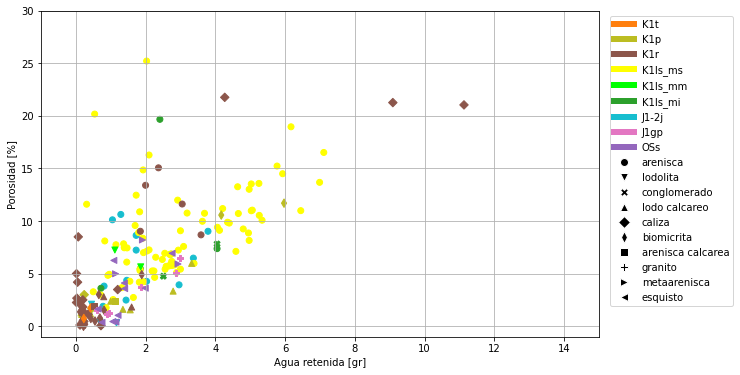

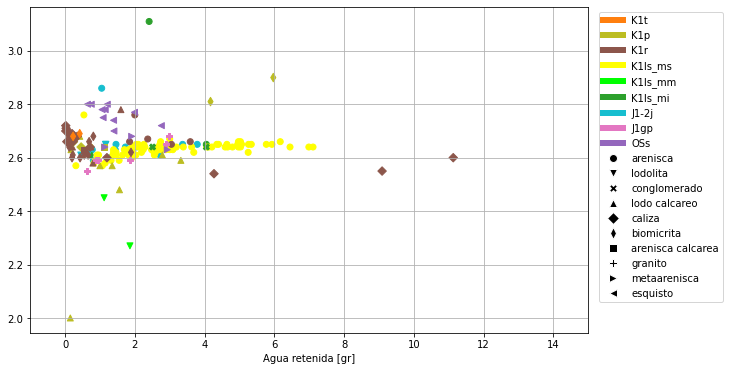

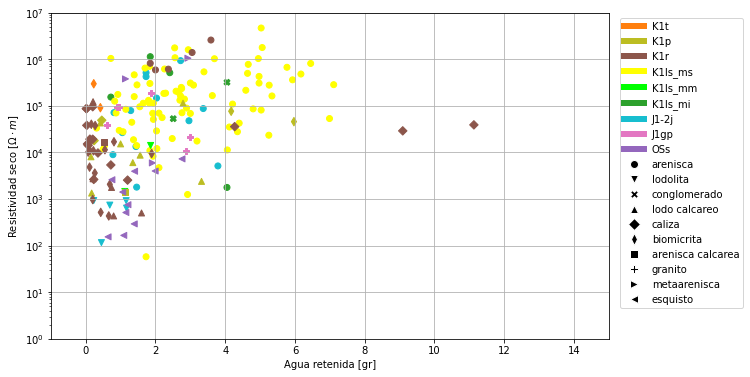

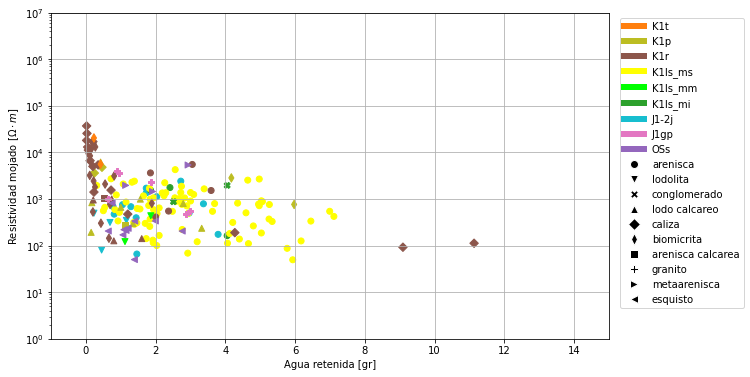

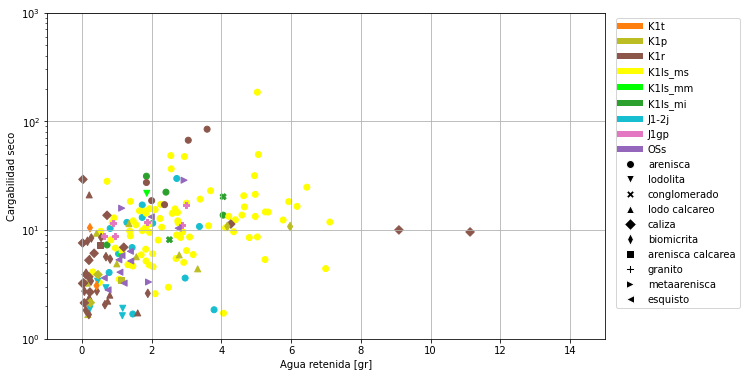

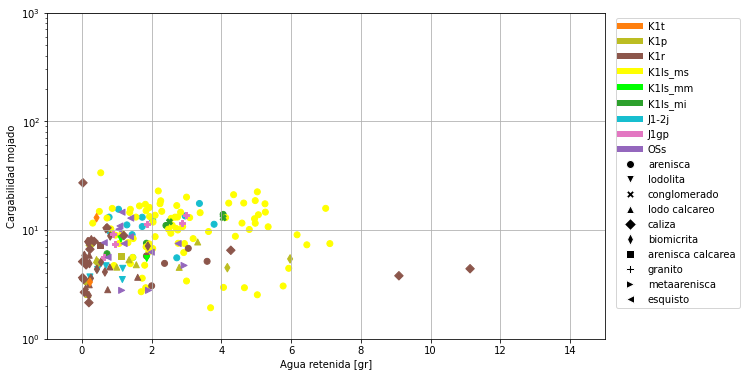

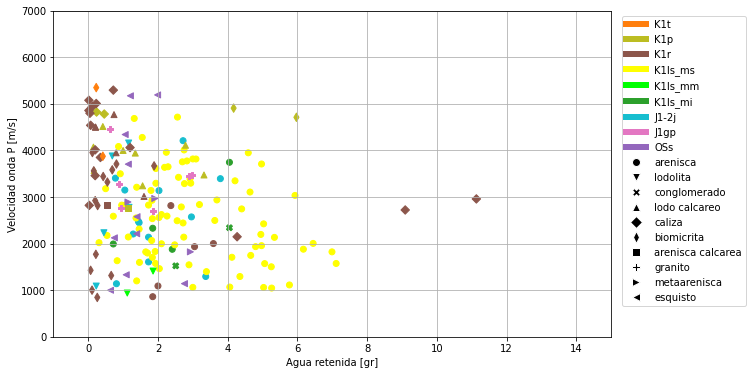

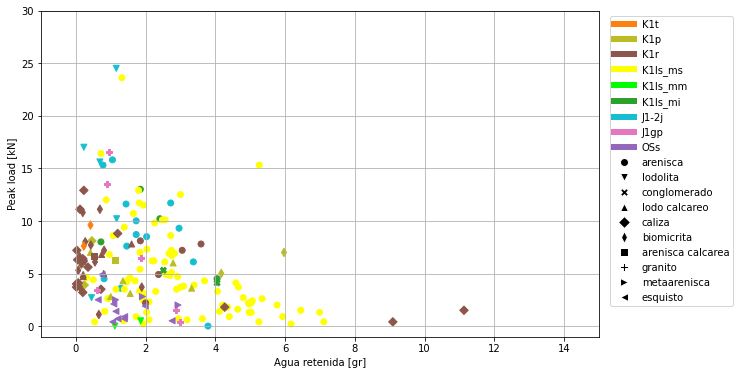

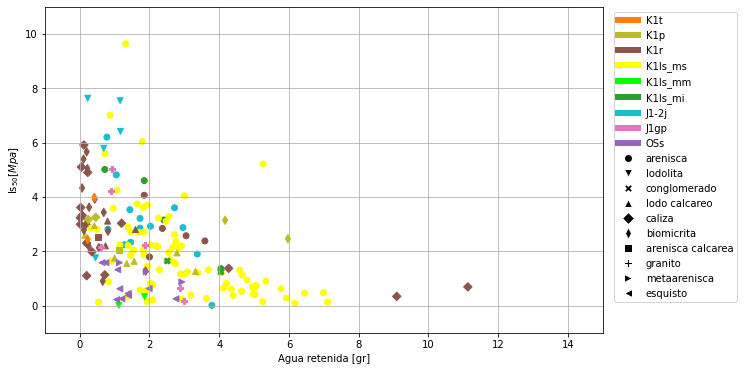

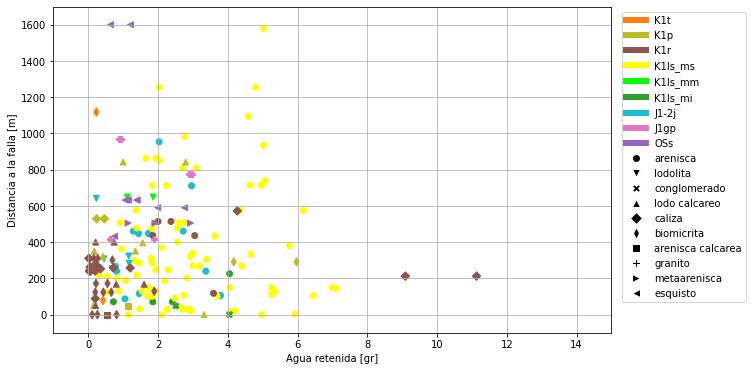

In [ ]:
#@title Agua "retenida" como variable independiente
propiedad_ejeX = 'Agua'
propiedades_ejeY = ['Agua', 'Porosidad', 'Densidad', 'RhoDry', 
                    'RhoWet', 'CargDry', 'CargWet', 'Vp',
                    'PeakLoad', 'Is50', 'DistFault']
for j in propiedades_ejeY:
  if j != propiedad_ejeX:
    plt.figure(figsize=(10,6))
    for i in simbol_unicos:
      simbol = i
      filtro = petrofisica['Simbolo'] ==  simbol

      plt.scatter(petrofisica[propiedad_ejeX][filtro], petrofisica[j][filtro],
                  c=petrofisica['Color'][filtro], marker=simbol)
    plt.xlabel('Agua retenida [gr]')
    plt.xlim(-1, 15)
    plt.grid()
    #plt.ylim(-1, 30)
    #plt.ylabel('Porosidad [%]')
    if j == 'Porosidad':
      plt.ylabel('Porosidad [%]')
      plt.ylim(-1, 30)
    elif j == 'Agua':
      plt.ylabel('Agua [gr]')
      plt.ylim(-1, 15)
    elif i == 'Densidad':
      plt.ylabel('Densidad [gr/cc]')
      plt.ylim(1.75, 3.25)
    elif j == 'RhoDry':
      plt.ylabel('Resistividad seco [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'RhoWet':
      plt.ylabel('Resistividad mojado [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'CargDry':
      plt.ylabel('Cargabilidad seco')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='CargWet':
      plt.ylabel('Cargabilidad mojado')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='Vp':
      plt.ylabel('Velocidad onda P [m/s]')
      plt.ylim(0, 7000)
    elif j == 'PeakLoad':
      plt.ylabel('Peak load [kN]')
      plt.ylim(-1, 30)
    elif j == 'Is50':
      plt.ylabel('Is$_{50} [Mpa]$')
      plt.ylim(-1, 11)
    elif j == 'DistFault':
      plt.ylabel('Distancia a la falla [m]')
      plt.ylim(-100, 1700)
    plt.legend(custom_lines + custom_simbol, labels_unidad + labels_simbol, bbox_to_anchor=(1.25, 1))#, loc=2)
    plt.savefig(('/content/drive/MyDrive/LosSantos/PlotsVs/{}Vs{}.png').format(propiedad_ejeX, j),
                format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
    plt.show()
    print('\n')



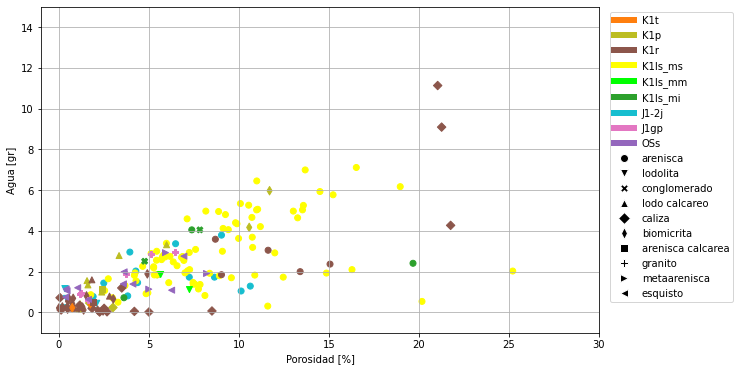

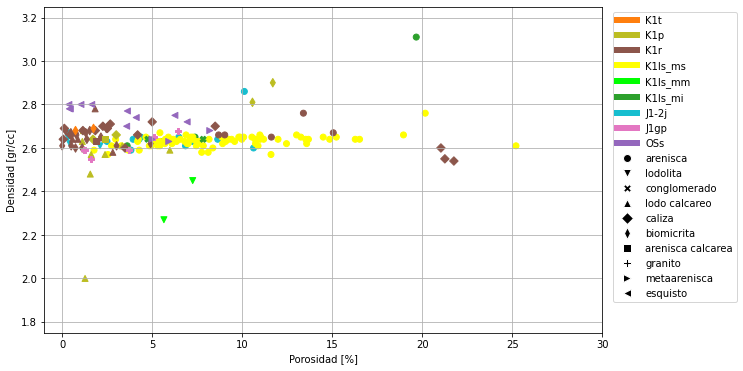

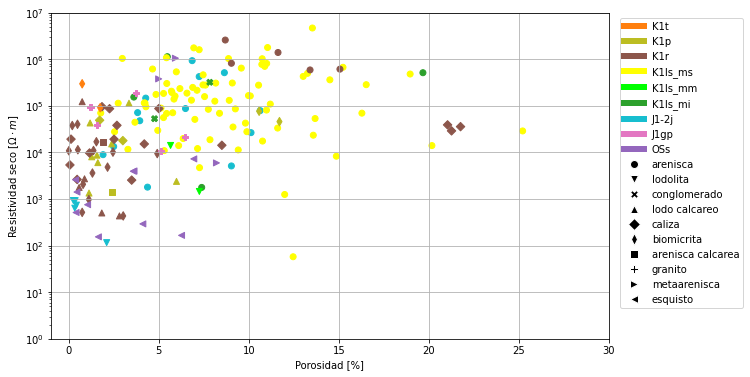

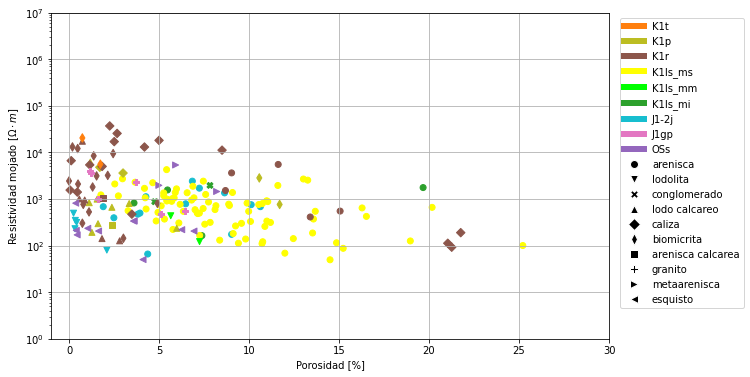

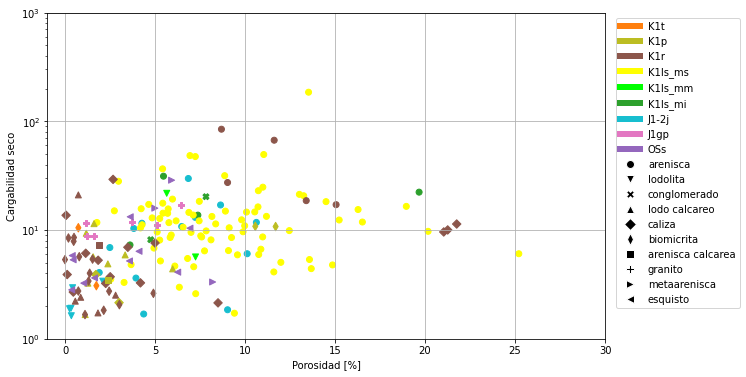

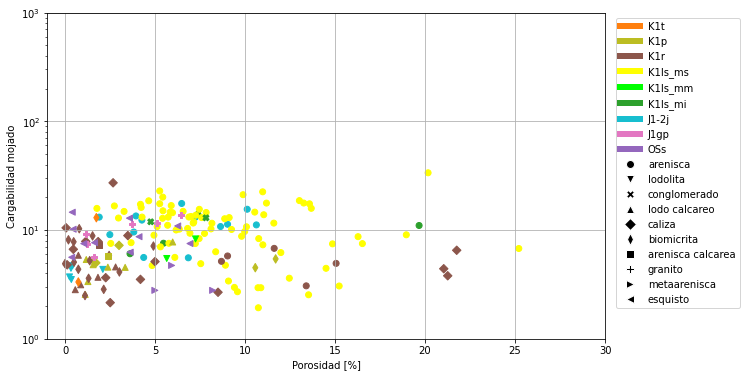

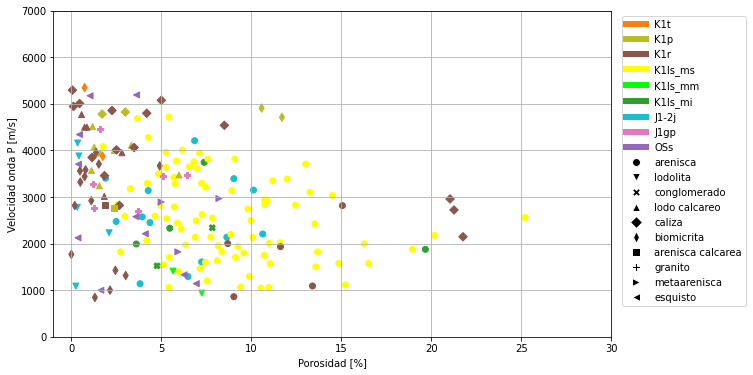

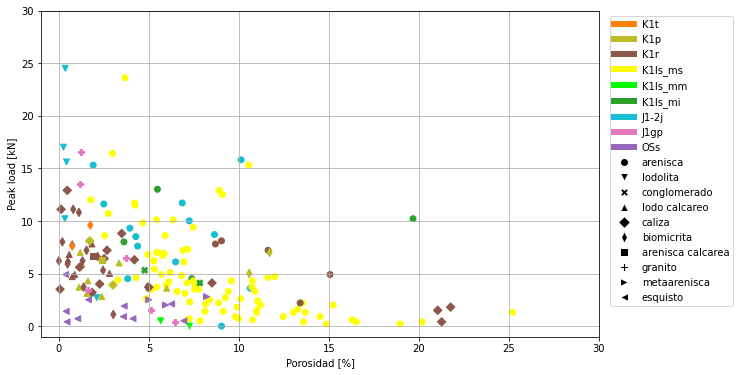

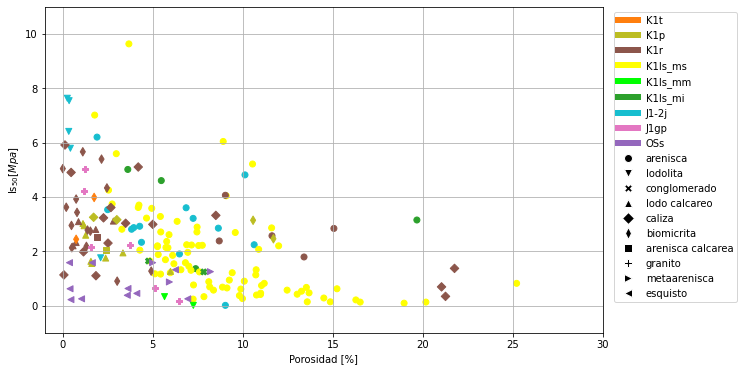

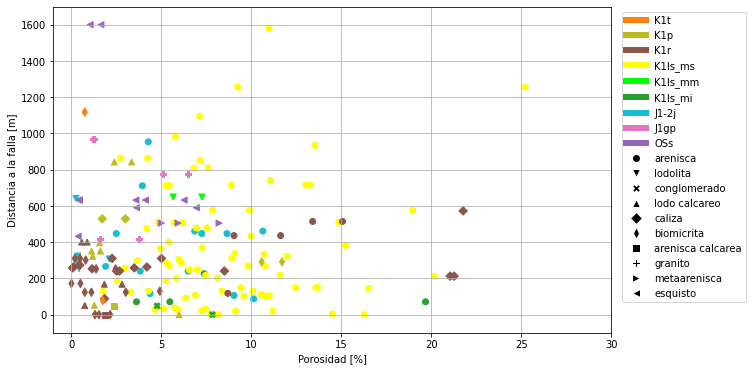

In [ ]:
#@title Porosidad como variable independiente
propiedad_ejeX = 'Porosidad'
propiedades_ejeY = ['Agua', 'Porosidad', 'Densidad', 'RhoDry', 
                    'RhoWet', 'CargDry', 'CargWet', 'Vp',
                    'PeakLoad', 'Is50', 'DistFault']
for j in propiedades_ejeY:
  if j != propiedad_ejeX:
    plt.figure(figsize=(10,6))
    for i in simbol_unicos:
      simbol = i
      filtro = petrofisica['Simbolo'] ==  simbol

      plt.scatter(petrofisica[propiedad_ejeX][filtro], petrofisica[j][filtro],
                  c=petrofisica['Color'][filtro], marker=simbol)
    plt.xlabel('Porosidad [%]')
    plt.xlim(-1, 30)
    plt.grid()
    if j == 'Porosidad':
      plt.ylabel('Porosidad [%]')
      plt.ylim(-1, 30)
    elif j == 'Agua':
      plt.ylabel('Agua [gr]')
      plt.ylim(-1, 15)
    elif j == 'Densidad':
      plt.ylabel('Densidad [gr/cc]')
      plt.ylim(1.75, 3.25)
    elif j == 'RhoDry':
      plt.ylabel('Resistividad seco [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'RhoWet':
      plt.ylabel('Resistividad mojado [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'CargDry':
      plt.ylabel('Cargabilidad seco')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='CargWet':
      plt.ylabel('Cargabilidad mojado')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='Vp':
      plt.ylabel('Velocidad onda P [m/s]')
      plt.ylim(0, 7000)
    elif j == 'PeakLoad':
      plt.ylabel('Peak load [kN]')
      plt.ylim(-1, 30)
    elif j == 'Is50':
      plt.ylabel('Is$_{50} [Mpa]$')
      plt.ylim(-1, 11)
    elif j == 'DistFault':
      plt.ylabel('Distancia a la falla [m]')
      plt.ylim(-100, 1700)

    plt.legend(custom_lines + custom_simbol, labels_unidad + labels_simbol, bbox_to_anchor=(1.25, 1))#, loc=2)
    plt.savefig(('/content/drive/MyDrive/LosSantos/PlotsVs/{}Vs{}.png').format(propiedad_ejeX, j),
                format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
    plt.show()
    print('\n')


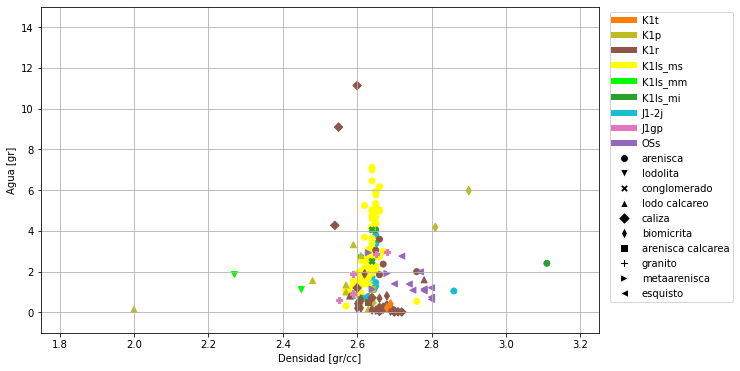

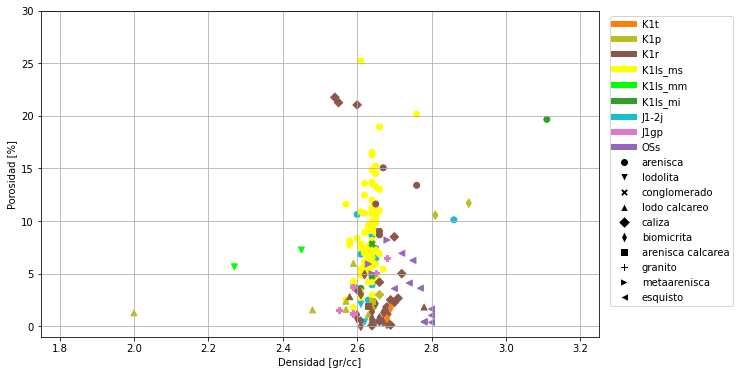

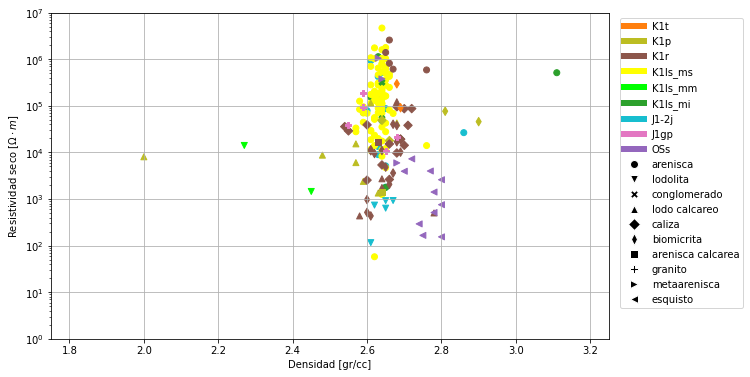

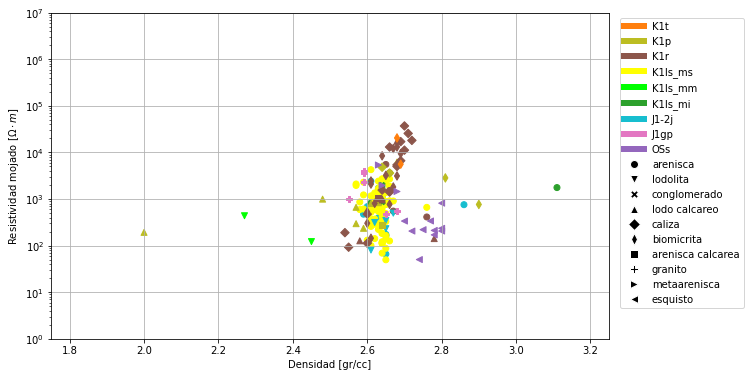

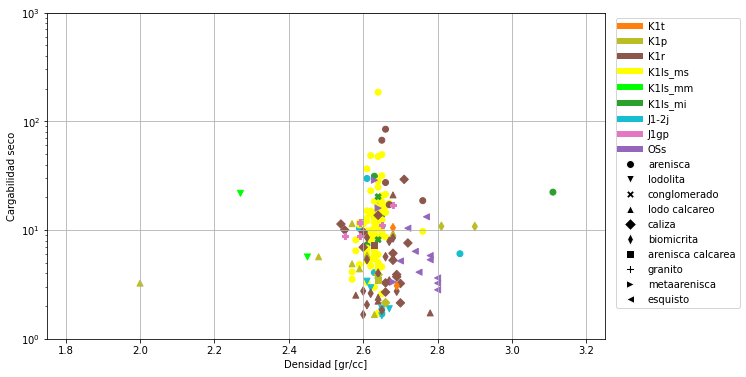

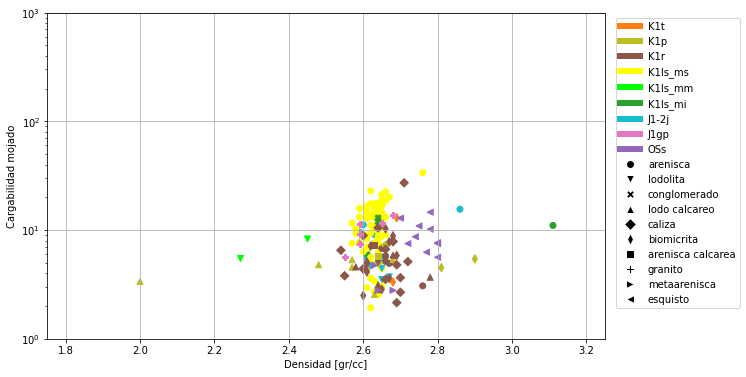

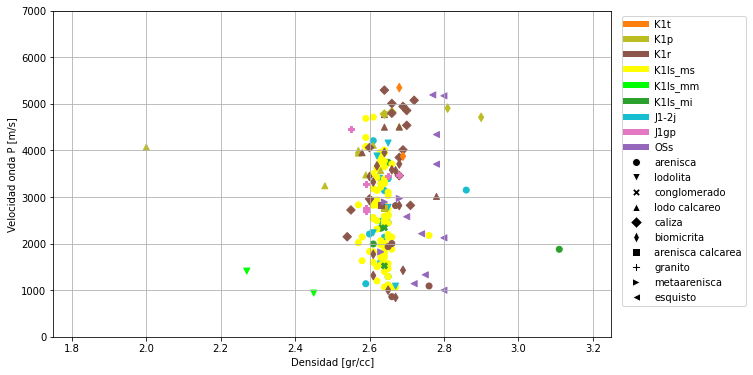

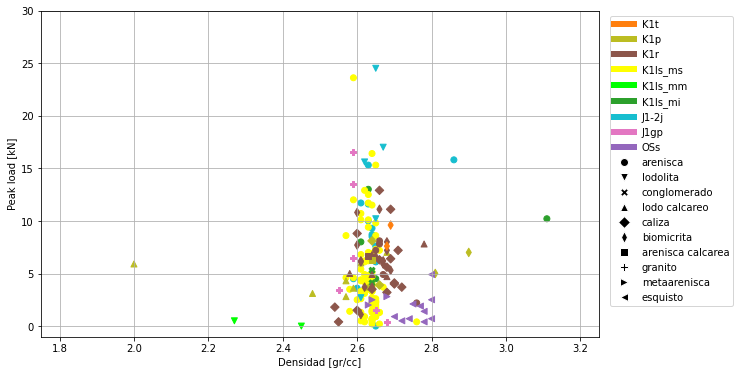

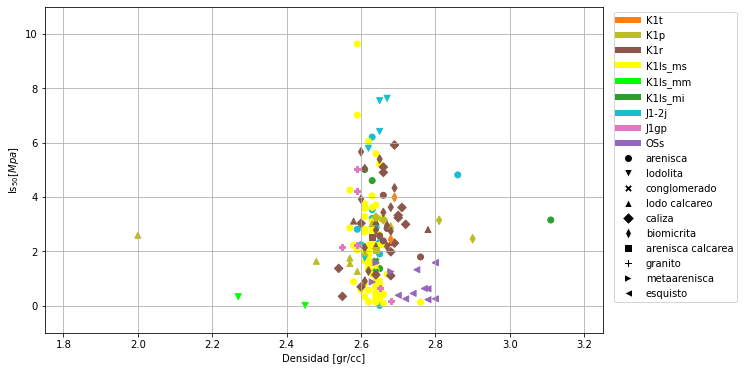

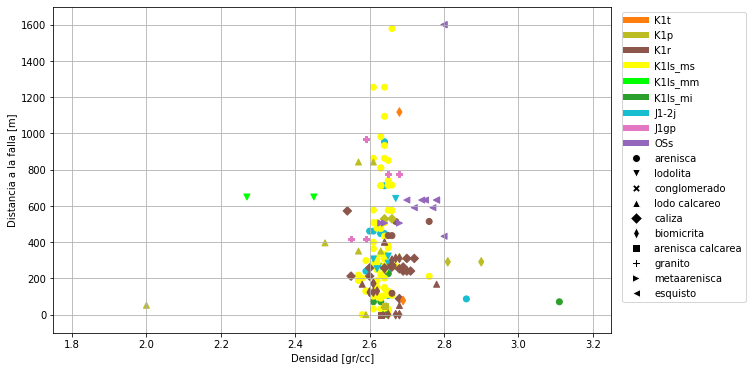

In [ ]:
#@title Densidad como variable independiente
propiedad_ejeX = 'Densidad'
propiedades_ejeY = ['Agua', 'Porosidad', 'Densidad', 'RhoDry', 
                    'RhoWet', 'CargDry', 'CargWet', 'Vp',
                    'PeakLoad', 'Is50', 'DistFault']
for j in propiedades_ejeY:
  if j != propiedad_ejeX:
    plt.figure(figsize=(10,6))
    for i in simbol_unicos:
      simbol = i
      filtro = petrofisica['Simbolo'] ==  simbol

      plt.scatter(petrofisica[propiedad_ejeX][filtro], petrofisica[j][filtro],
                  c=petrofisica['Color'][filtro], marker=simbol)
    plt.xlabel('Densidad [gr/cc]')
    plt.xlim(1.75, 3.25)
    plt.grid()
    if j == 'Porosidad':
      plt.ylabel('Porosidad [%]')
      plt.ylim(-1, 30)
    elif j == 'Agua':
      plt.ylabel('Agua [gr]')
      plt.ylim(-1, 15)
    elif j == 'Densidad':
      plt.ylabel('Densidad [gr/cc]')
      plt.ylim(1.75, 3.25)
    elif j == 'RhoDry':
      plt.ylabel('Resistividad seco [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'RhoWet':
      plt.ylabel('Resistividad mojado [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'CargDry':
      plt.ylabel('Cargabilidad seco')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='CargWet':
      plt.ylabel('Cargabilidad mojado')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='Vp':
      plt.ylabel('Velocidad onda P [m/s]')
      plt.ylim(0, 7000)
    elif j == 'PeakLoad':
      plt.ylabel('Peak load [kN]')
      plt.ylim(-1, 30)
    elif j == 'Is50':
      plt.ylabel('Is$_{50} [Mpa]$')
      plt.ylim(-1, 11)
    elif j == 'DistFault':
      plt.ylabel('Distancia a la falla [m]')
      plt.ylim(-100, 1700)
    plt.legend(custom_lines + custom_simbol, labels_unidad + labels_simbol, bbox_to_anchor=(1.25, 1))#, loc=2)
    plt.savefig(('/content/drive/MyDrive/LosSantos/PlotsVs/{}Vs{}.png').format(propiedad_ejeX, j),
                format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
    plt.show()
    print('\n')


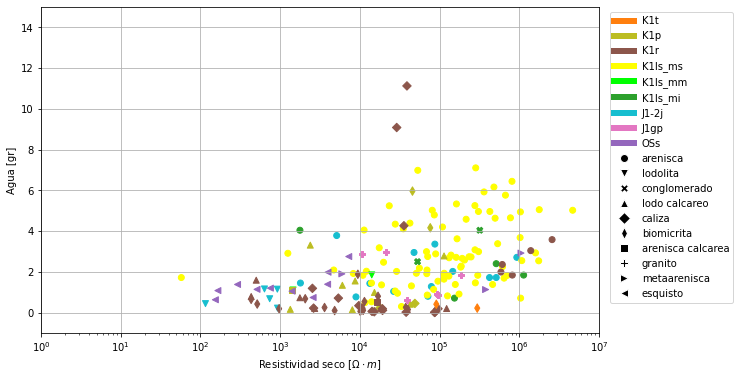

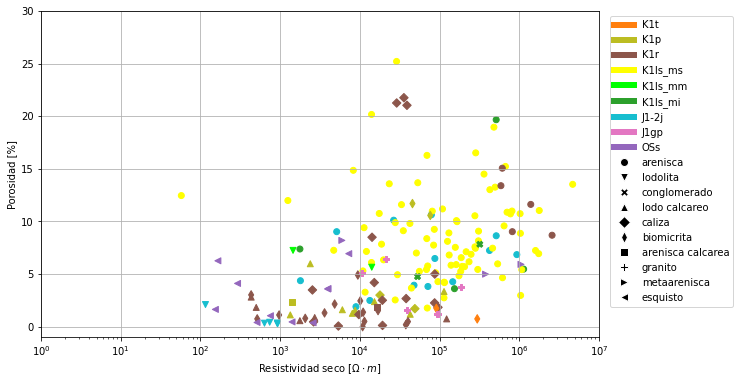

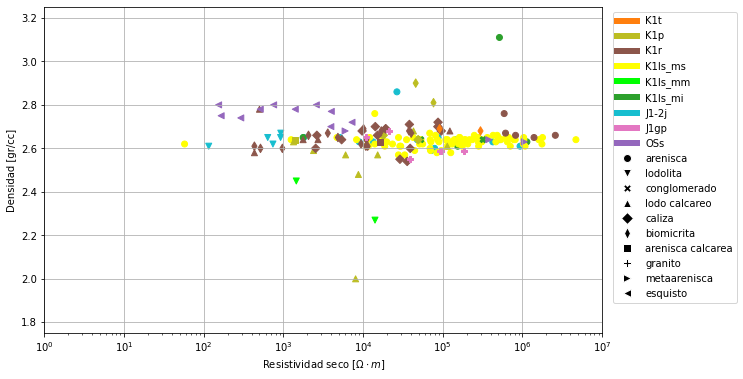

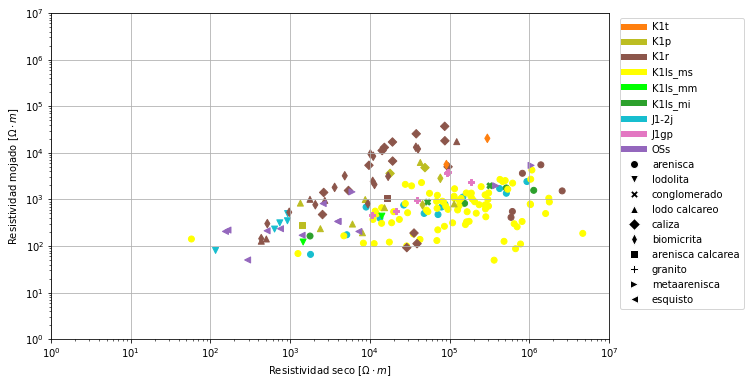

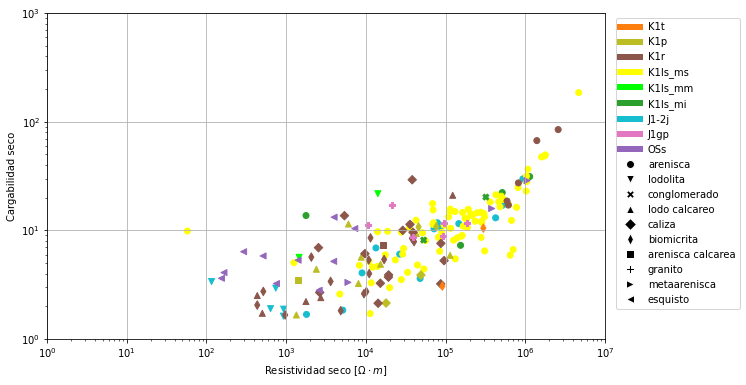

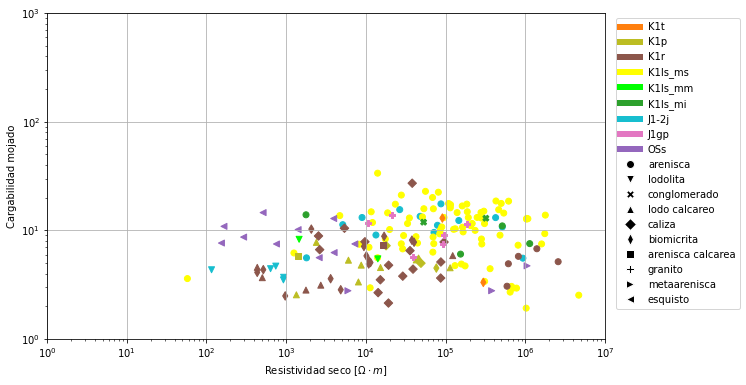

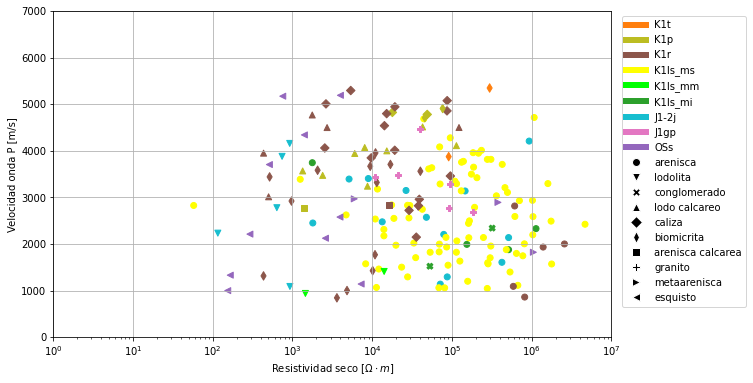

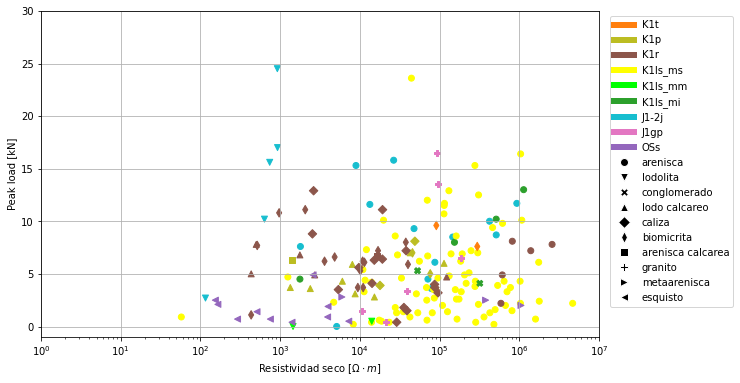

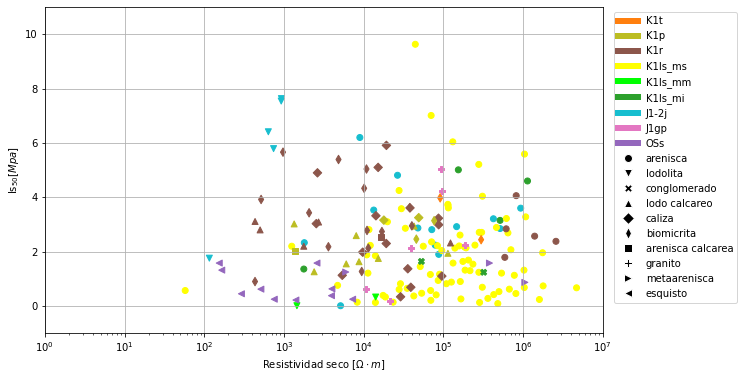

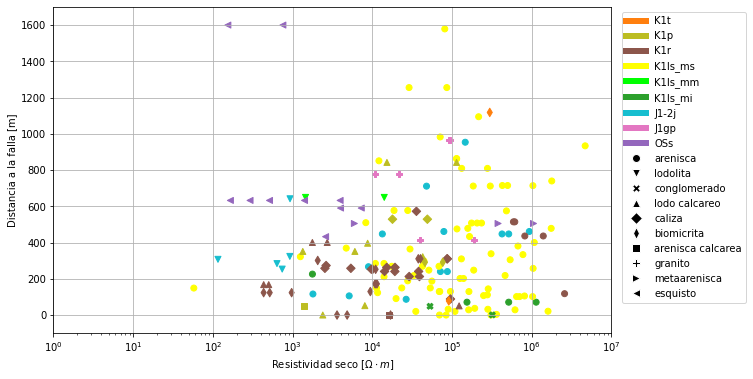

In [ ]:
#@title RhoDry como variable independiente
propiedad_ejeX = 'RhoDry'
propiedades_ejeY = ['Agua', 'Porosidad', 'Densidad', 'RhoDry', 
                    'RhoWet', 'CargDry', 'CargWet', 'Vp',
                    'PeakLoad', 'Is50', 'DistFault']
for j in propiedades_ejeY:
  if j != propiedad_ejeX:
    plt.figure(figsize=(10,6))
    for i in simbol_unicos:
      simbol = i
      filtro = petrofisica['Simbolo'] ==  simbol

      plt.scatter(petrofisica[propiedad_ejeX][filtro], petrofisica[j][filtro],
                  c=petrofisica['Color'][filtro], marker=simbol)
    plt.xlabel('Resistividad seco [$\Omega \cdot m$]')
    plt.xscale('log')
    plt.xlim(10**0, 10**7)
    plt.grid()
    if j == 'Porosidad':
      plt.ylabel('Porosidad [%]')
      plt.ylim(-1, 30)
    elif j == 'Agua':
      plt.ylabel('Agua [gr]')
      plt.ylim(-1, 15)
    elif j == 'Densidad':
      plt.ylabel('Densidad [gr/cc]')
      plt.ylim(1.75, 3.25)
    elif j == 'RhoDry':
      plt.ylabel('Resistividad seco [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'RhoWet':
      plt.ylabel('Resistividad mojado [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'CargDry':
      plt.ylabel('Cargabilidad seco')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='CargWet':
      plt.ylabel('Cargabilidad mojado')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='Vp':
      plt.ylabel('Velocidad onda P [m/s]')
      plt.ylim(0, 7000)
    elif j == 'PeakLoad':
      plt.ylabel('Peak load [kN]')
      plt.ylim(-1, 30)
    elif j == 'Is50':
      plt.ylabel('Is$_{50} [Mpa]$')
      plt.ylim(-1, 11)
    elif j == 'DistFault':
      plt.ylabel('Distancia a la falla [m]')
      plt.ylim(-100, 1700)
    plt.legend(custom_lines + custom_simbol, labels_unidad + labels_simbol, bbox_to_anchor=(1.25, 1))#, loc=2)
    plt.savefig(('/content/drive/MyDrive/LosSantos/PlotsVs/{}Vs{}.png').format(propiedad_ejeX, j),
                format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
    plt.show()
    print('\n')


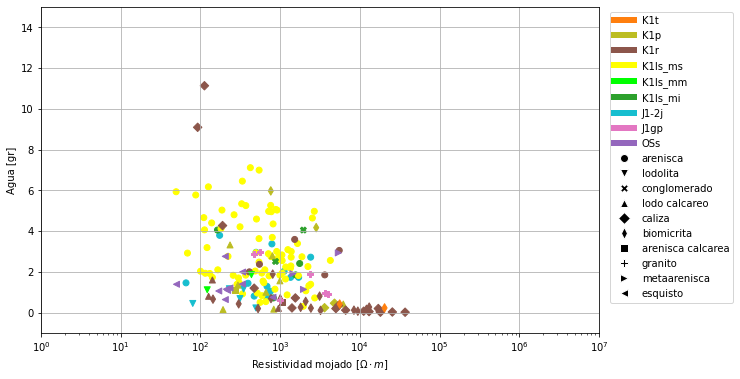

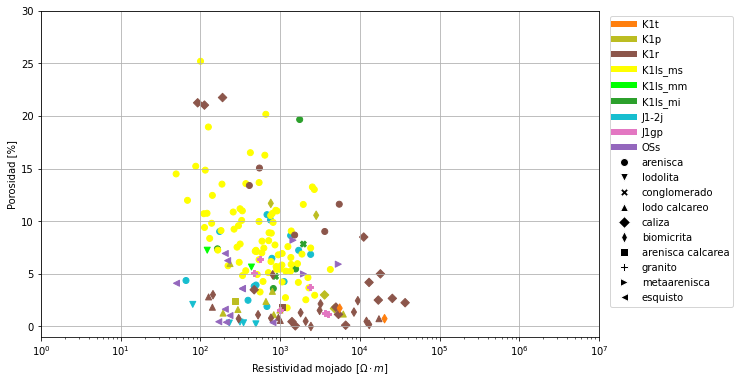

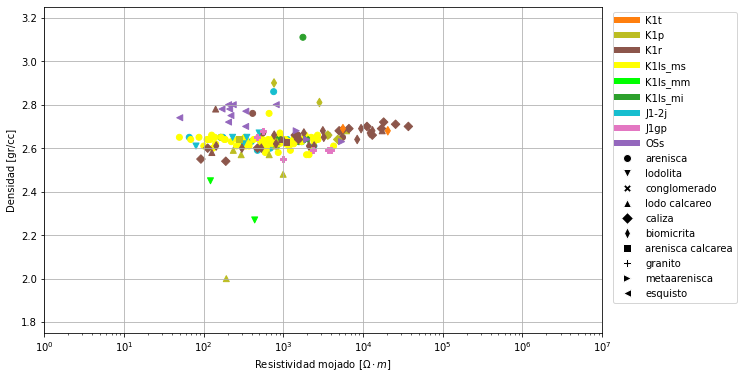

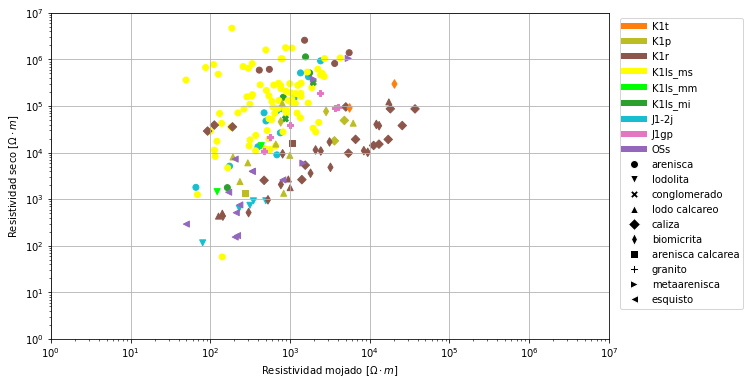

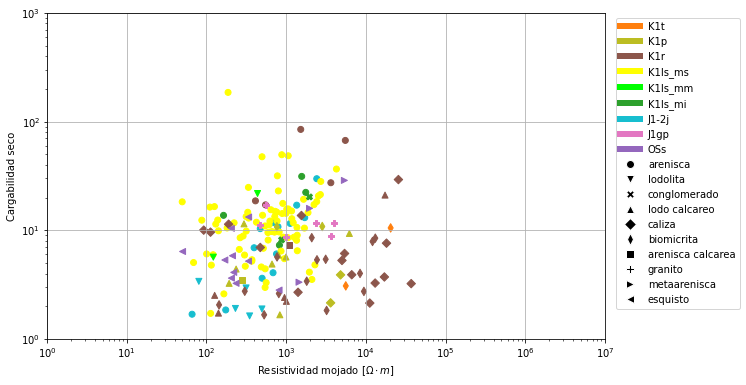

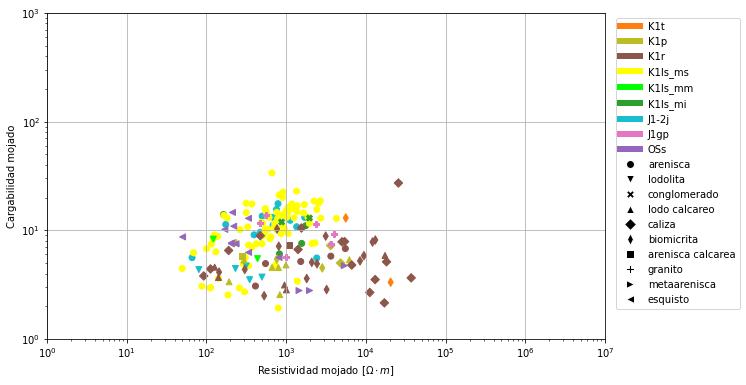

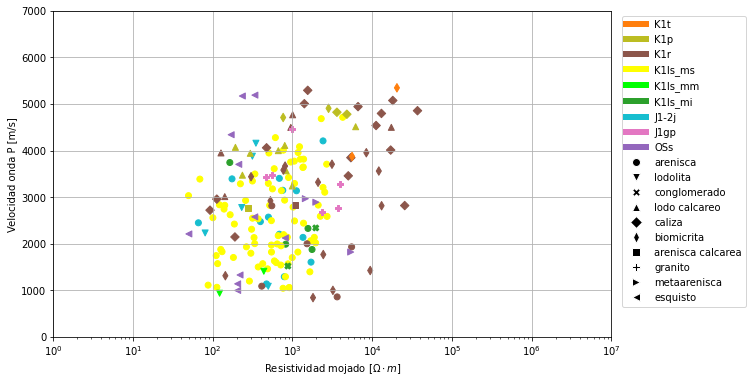

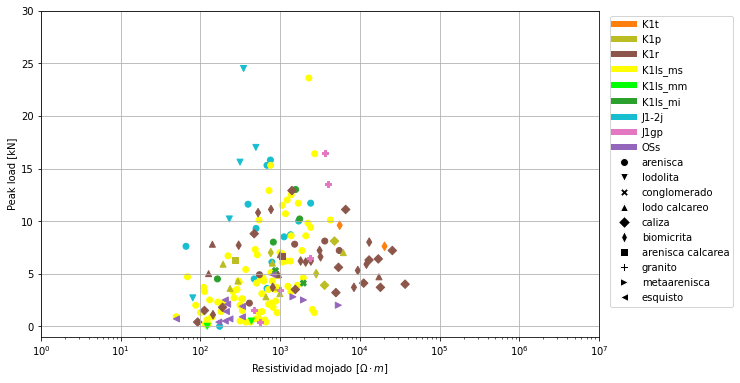

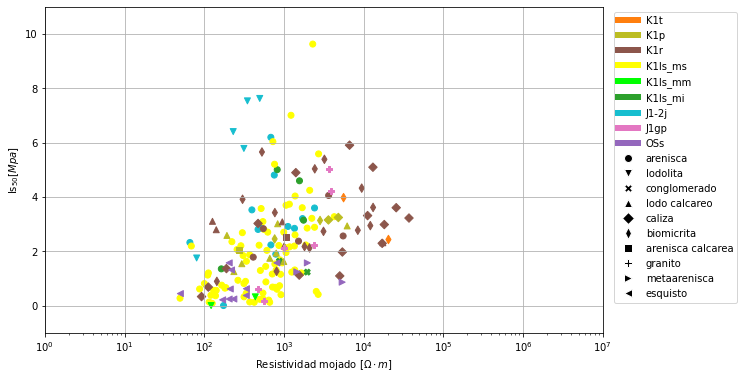

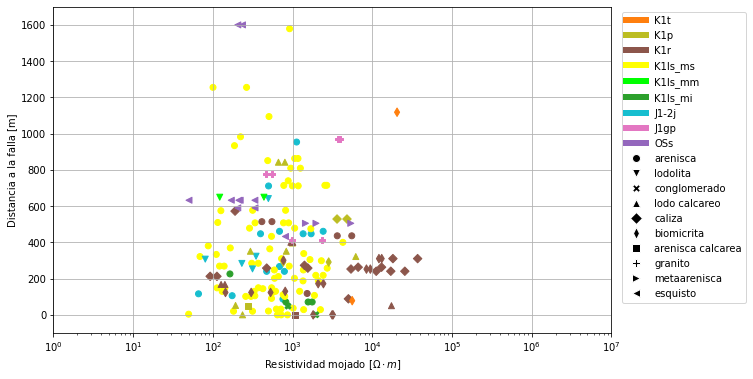

In [ ]:
#@title RhoWet como variable independiente
propiedad_ejeX = 'RhoWet'
propiedades_ejeY = ['Agua', 'Porosidad', 'Densidad', 'RhoDry', 
                    'RhoWet', 'CargDry', 'CargWet', 'Vp',
                    'PeakLoad', 'Is50', 'DistFault']
for j in propiedades_ejeY:
  if j != propiedad_ejeX:
    plt.figure(figsize=(10,6))
    for i in simbol_unicos:
      simbol = i
      filtro = petrofisica['Simbolo'] ==  simbol

      plt.scatter(petrofisica[propiedad_ejeX][filtro], petrofisica[j][filtro],
                  c=petrofisica['Color'][filtro], marker=simbol)
    plt.xlabel('Resistividad mojado [$\Omega \cdot m$]')
    plt.xscale('log')
    plt.xlim(10**0, 10**7)
    plt.grid()
    if j == 'Porosidad':
      plt.ylabel('Porosidad [%]')
      plt.ylim(-1, 30)
    elif j == 'Agua':
      plt.ylabel('Agua [gr]')
      plt.ylim(-1, 15)
    elif j == 'Densidad':
      plt.ylabel('Densidad [gr/cc]')
      plt.ylim(1.75, 3.25)
    elif j == 'RhoDry':
      plt.ylabel('Resistividad seco [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'RhoWet':
      plt.ylabel('Resistividad mojado [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'CargDry':
      plt.ylabel('Cargabilidad seco')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='CargWet':
      plt.ylabel('Cargabilidad mojado')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='Vp':
      plt.ylabel('Velocidad onda P [m/s]')
      plt.ylim(0, 7000)
    elif j == 'PeakLoad':
      plt.ylabel('Peak load [kN]')
      plt.ylim(-1, 30)
    elif j == 'Is50':
      plt.ylabel('Is$_{50} [Mpa]$')
      plt.ylim(-1, 11)
    elif j == 'DistFault':
      plt.ylabel('Distancia a la falla [m]')
      plt.ylim(-100, 1700)
    plt.legend(custom_lines + custom_simbol, labels_unidad + labels_simbol, bbox_to_anchor=(1.25, 1))#, loc=2)
    plt.savefig(('/content/drive/MyDrive/LosSantos/PlotsVs/{}Vs{}.png').format(propiedad_ejeX, j),
                format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
    plt.show()
    print('\n')


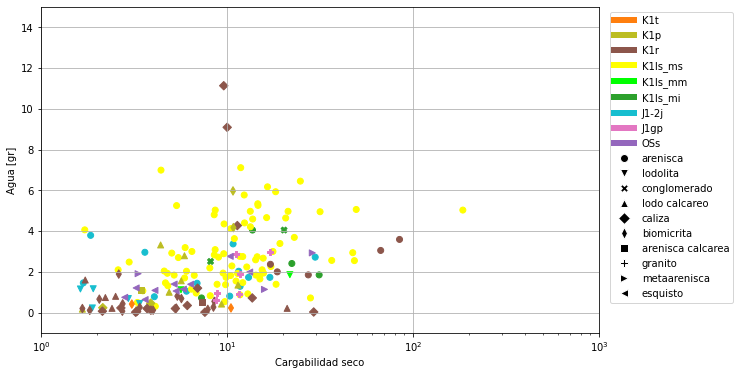

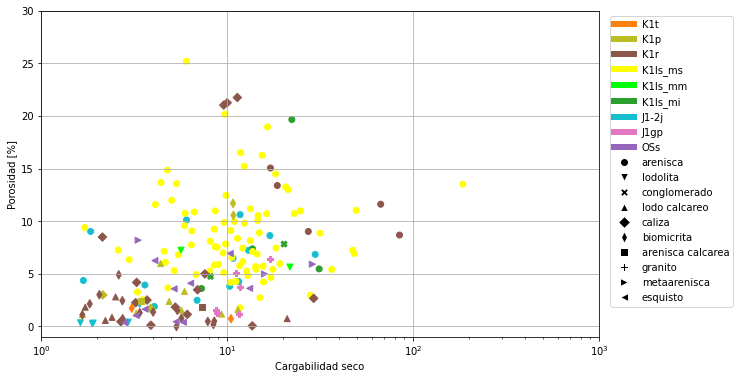

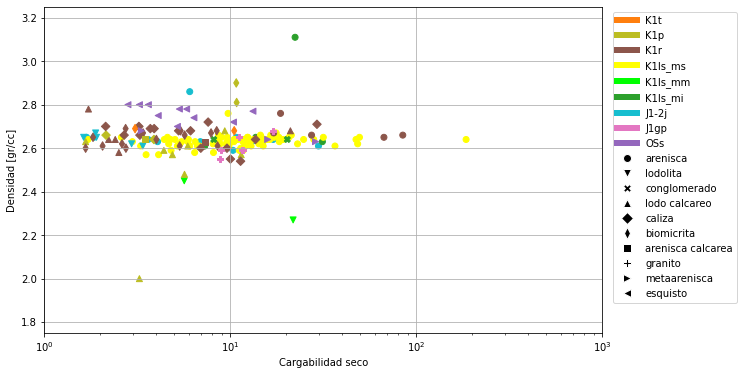

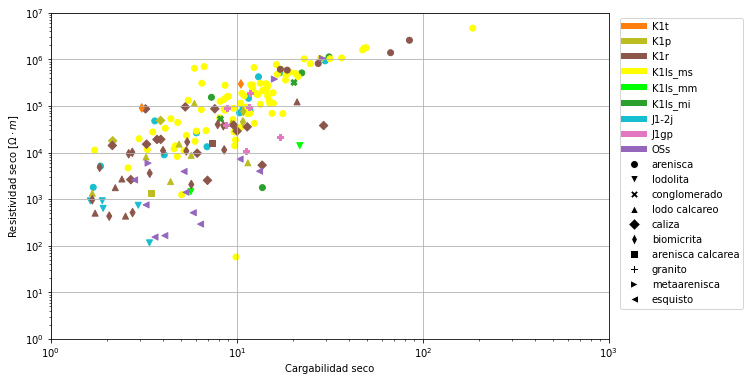

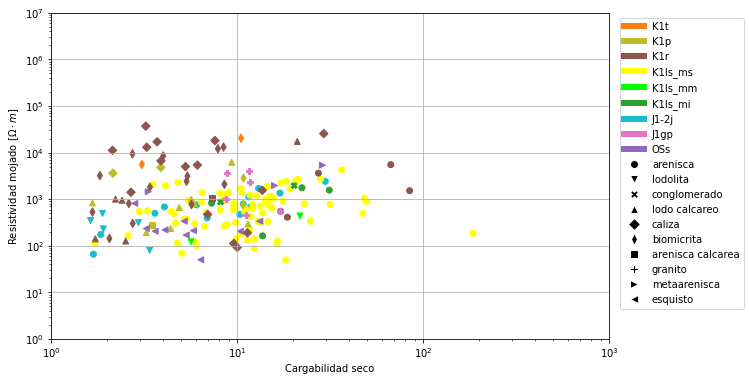

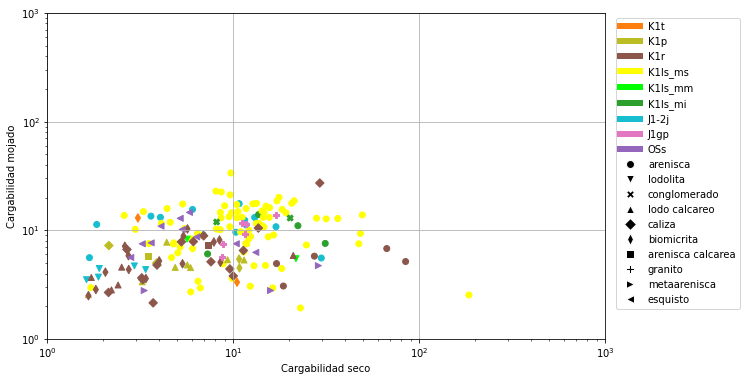

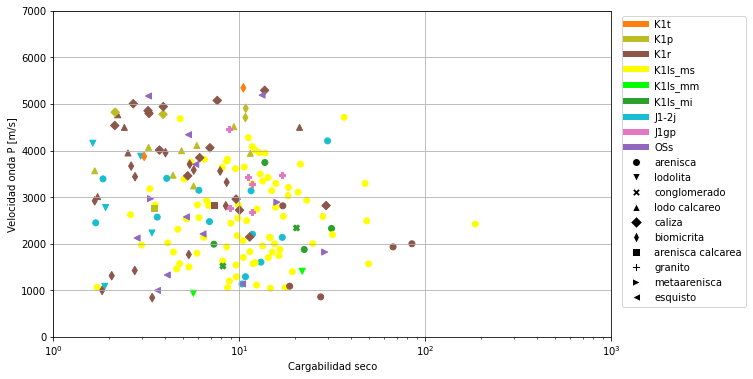

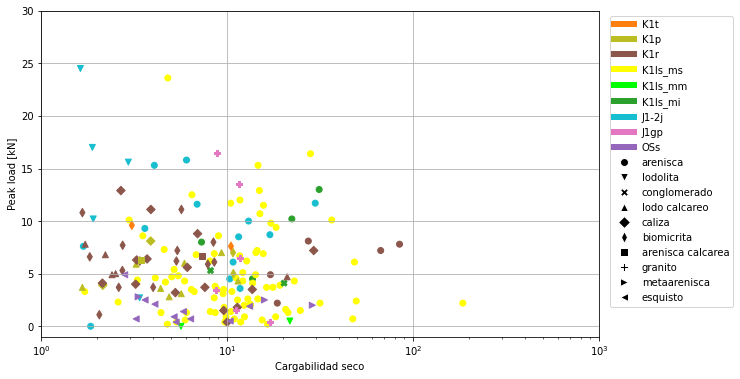

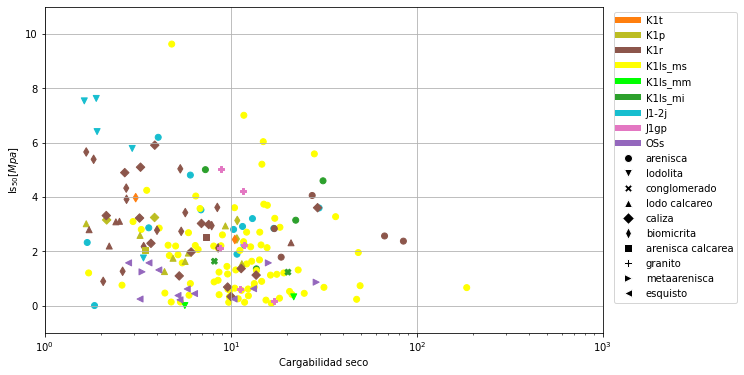

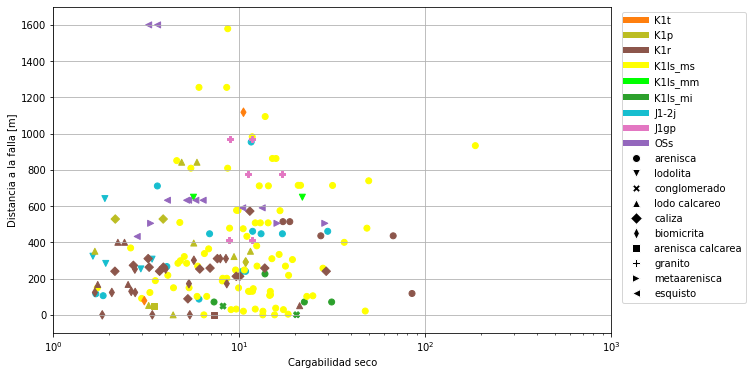

In [ ]:
#@title CargDry como variable independiente
propiedad_ejeX = 'CargDry'
propiedades_ejeY = ['Agua', 'Porosidad', 'Densidad', 'RhoDry', 
                    'RhoWet', 'CargDry', 'CargWet', 'Vp',
                    'PeakLoad', 'Is50', 'DistFault']
for j in propiedades_ejeY:
  if j != propiedad_ejeX:
    plt.figure(figsize=(10,6))
    for i in simbol_unicos:
      simbol = i
      filtro = petrofisica['Simbolo'] ==  simbol

      plt.scatter(petrofisica[propiedad_ejeX][filtro], petrofisica[j][filtro],
                  c=petrofisica['Color'][filtro], marker=simbol)
    plt.xlabel('Cargabilidad seco')
    plt.xscale('log')
    plt.xlim(10**0, 10**3)
    plt.grid()
    if j == 'Porosidad':
      plt.ylabel('Porosidad [%]')
      plt.ylim(-1, 30)
    elif j == 'Agua':
      plt.ylabel('Agua [gr]')
      plt.ylim(-1, 15)
    elif j == 'Densidad':
      plt.ylabel('Densidad [gr/cc]')
      plt.ylim(1.75, 3.25)
    elif j == 'RhoDry':
      plt.ylabel('Resistividad seco [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'RhoWet':
      plt.ylabel('Resistividad mojado [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'CargDry':
      plt.ylabel('Cargabilidad seco')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='CargWet':
      plt.ylabel('Cargabilidad mojado')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='Vp':
      plt.ylabel('Velocidad onda P [m/s]')
      plt.ylim(0, 7000)
    elif j == 'PeakLoad':
      plt.ylabel('Peak load [kN]')
      plt.ylim(-1, 30)
    elif j == 'Is50':
      plt.ylabel('Is$_{50} [Mpa]$')
      plt.ylim(-1, 11)
    elif j == 'DistFault':
      plt.ylabel('Distancia a la falla [m]')
      plt.ylim(-100, 1700)
    plt.legend(custom_lines + custom_simbol, labels_unidad + labels_simbol, bbox_to_anchor=(1.25, 1))#, loc=2)
    plt.savefig(('/content/drive/MyDrive/LosSantos/PlotsVs/{}Vs{}.png').format(propiedad_ejeX, j),
                format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
    plt.show()
    print('\n')


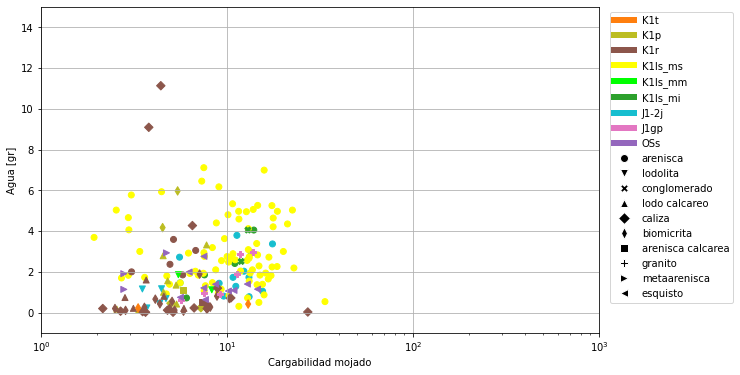

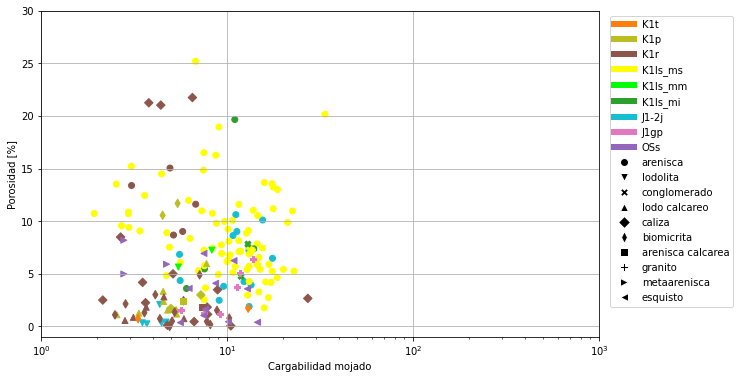

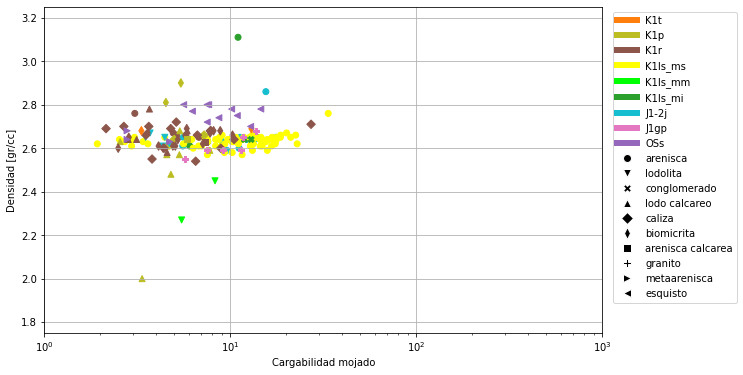

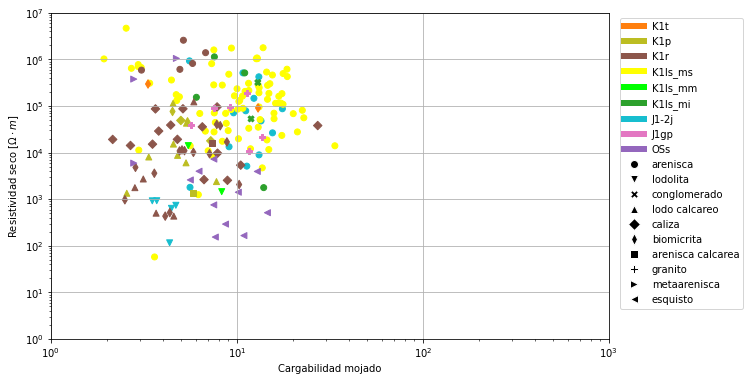

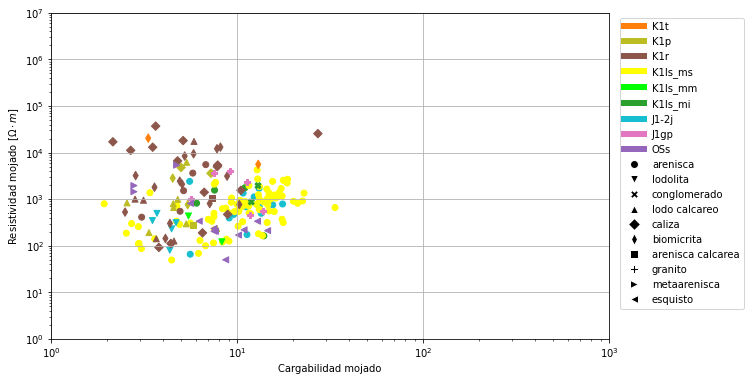

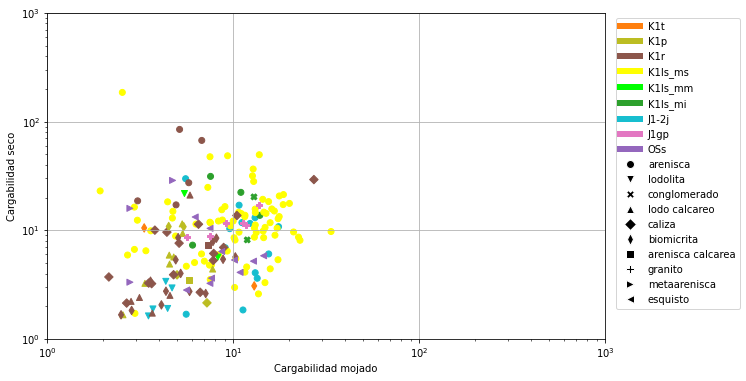

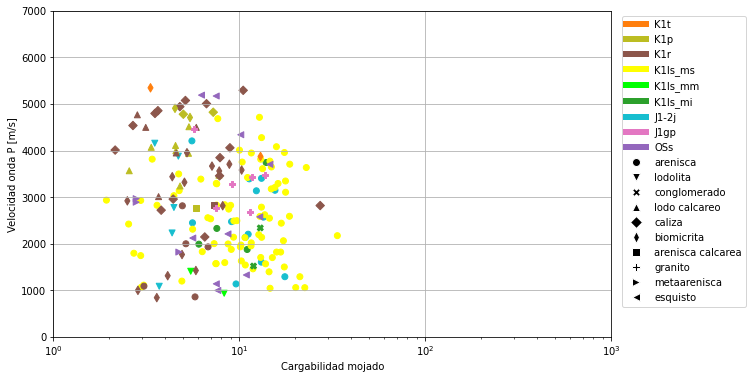

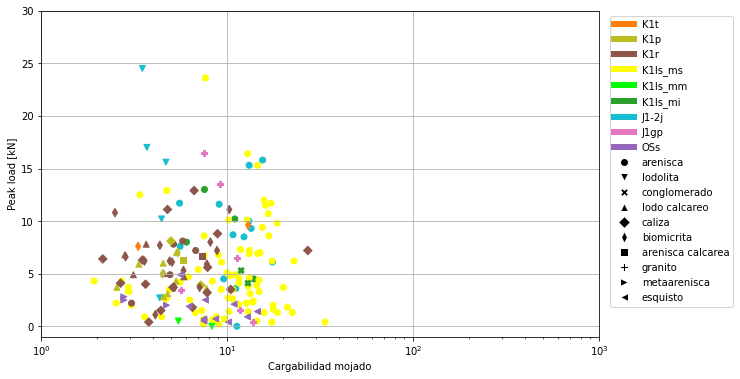

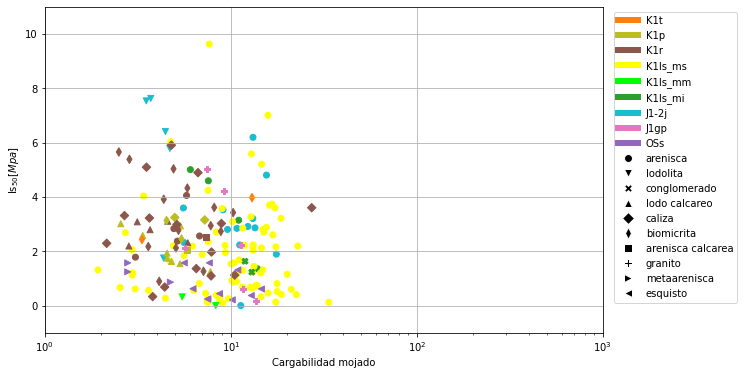

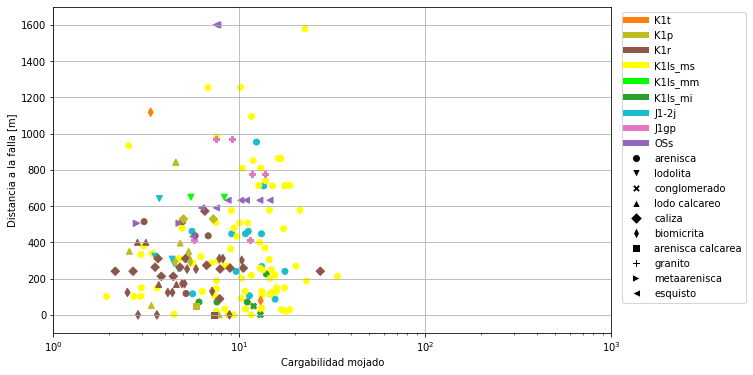

In [ ]:
#@title CargWet como variable independiente
propiedad_ejeX = 'CargWet'
propiedades_ejeY = ['Agua', 'Porosidad', 'Densidad', 'RhoDry', 
                    'RhoWet', 'CargDry', 'CargWet', 'Vp',
                    'PeakLoad', 'Is50', 'DistFault']
for j in propiedades_ejeY:
  if j != propiedad_ejeX:
    plt.figure(figsize=(10,6))
    for i in simbol_unicos:
      simbol = i
      filtro = petrofisica['Simbolo'] ==  simbol

      plt.scatter(petrofisica[propiedad_ejeX][filtro], petrofisica[j][filtro],
                  c=petrofisica['Color'][filtro], marker=simbol)
    plt.xlabel('Cargabilidad mojado')
    plt.xscale('log')
    plt.xlim(10**0, 10**3)
    plt.grid()
    if j == 'Porosidad':
      plt.ylabel('Porosidad [%]')
      plt.ylim(-1, 30)
    elif j == 'Agua':
      plt.ylabel('Agua [gr]')
      plt.ylim(-1, 15)
    elif j == 'Densidad':
      plt.ylabel('Densidad [gr/cc]')
      plt.ylim(1.75, 3.25)
    elif j == 'RhoDry':
      plt.ylabel('Resistividad seco [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'RhoWet':
      plt.ylabel('Resistividad mojado [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'CargDry':
      plt.ylabel('Cargabilidad seco')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='CargWet':
      plt.ylabel('Cargabilidad mojado')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='Vp':
      plt.ylabel('Velocidad onda P [m/s]')
      plt.ylim(0, 7000)
    elif j == 'PeakLoad':
      plt.ylabel('Peak load [kN]')
      plt.ylim(-1, 30)
    elif j == 'Is50':
      plt.ylabel('Is$_{50} [Mpa]$')
      plt.ylim(-1, 11)
    elif j == 'DistFault':
      plt.ylabel('Distancia a la falla [m]')
      plt.ylim(-100, 1700)
    plt.legend(custom_lines + custom_simbol, labels_unidad + labels_simbol, bbox_to_anchor=(1.25, 1))#, loc=2)
    plt.savefig(('/content/drive/MyDrive/LosSantos/PlotsVs/{}Vs{}.png').format(propiedad_ejeX, j),
                format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
    plt.show()
    print('\n')


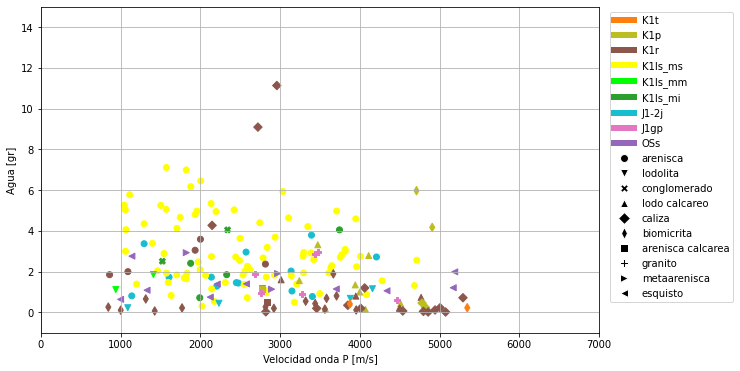

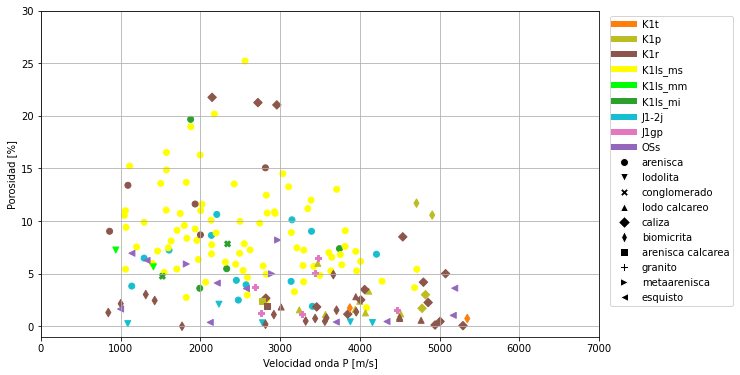

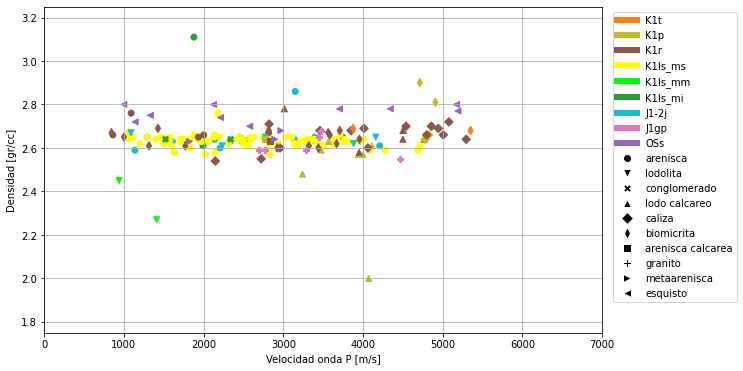

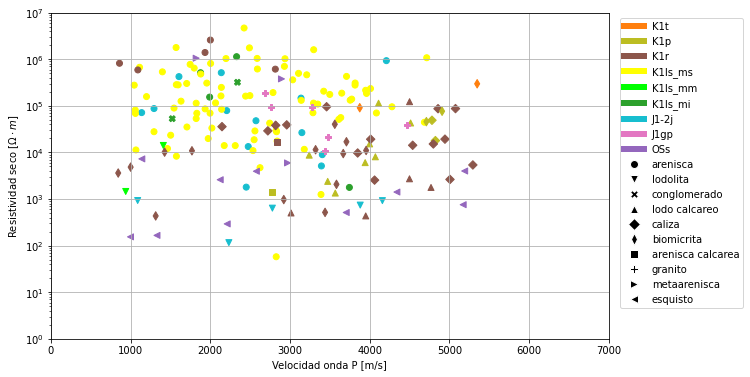

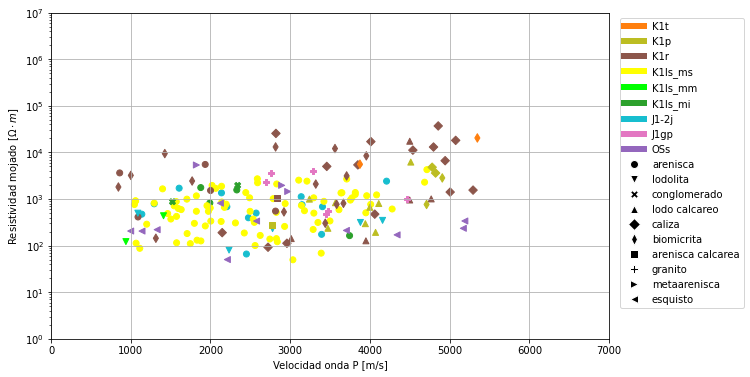

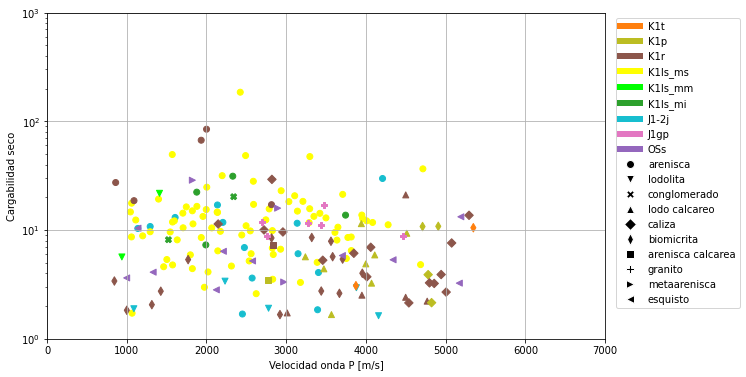

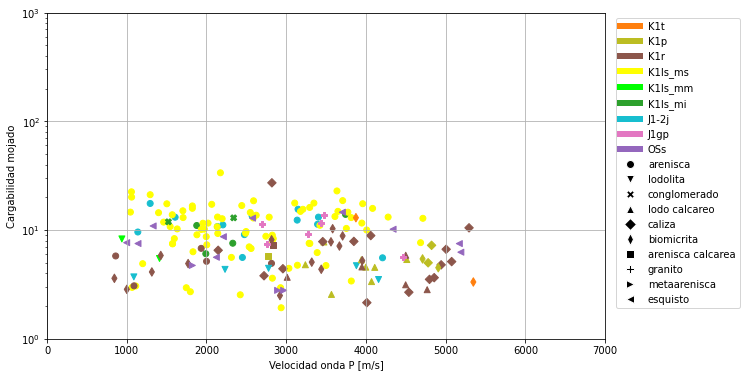

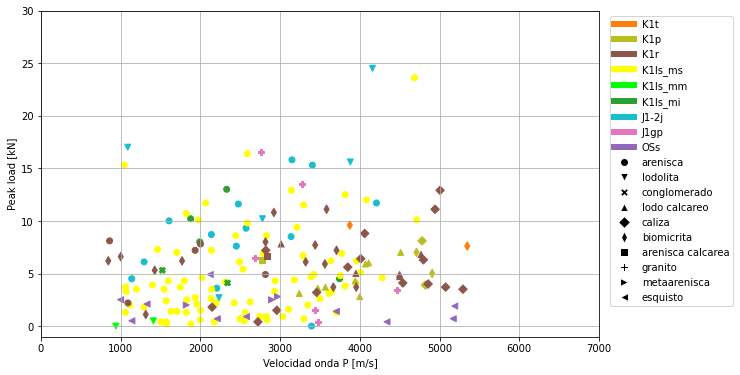

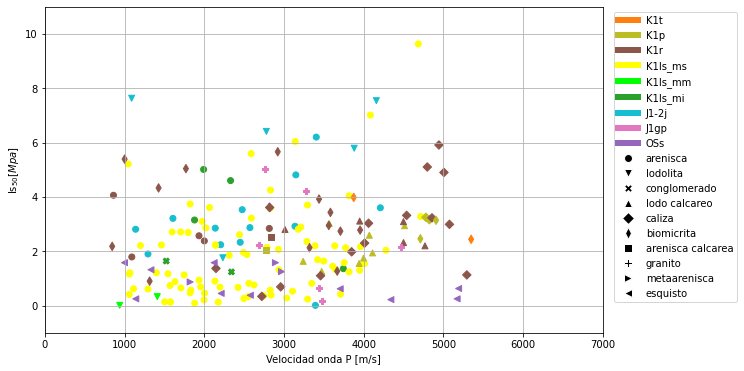

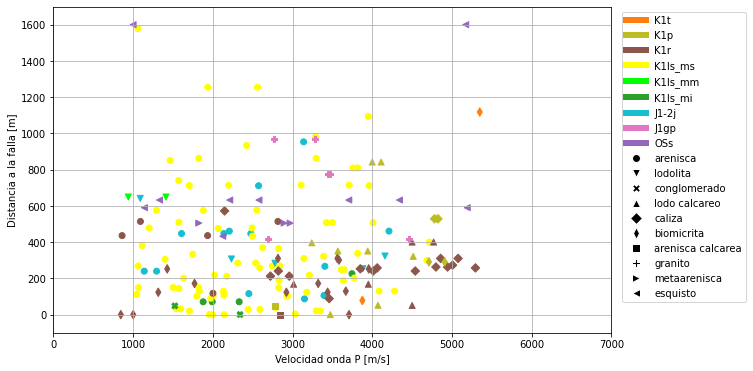

In [ ]:
#@title Vp como variable independiente
propiedad_ejeX = 'Vp'
propiedades_ejeY = ['Agua', 'Porosidad', 'Densidad', 'RhoDry', 
                    'RhoWet', 'CargDry', 'CargWet', 'Vp',
                    'PeakLoad', 'Is50', 'DistFault']
for j in propiedades_ejeY:
  if j != propiedad_ejeX:
    plt.figure(figsize=(10,6))
    for i in simbol_unicos:
      simbol = i
      filtro = petrofisica['Simbolo'] ==  simbol

      plt.scatter(petrofisica[propiedad_ejeX][filtro], petrofisica[j][filtro],
                  c=petrofisica['Color'][filtro], marker=simbol)
    plt.xlabel('Velocidad onda P [m/s]')
    plt.xlim(0, 7000)
    plt.grid()
    if j == 'Porosidad':
      plt.ylabel('Porosidad [%]')
      plt.ylim(-1, 30)
    elif j == 'Agua':
      plt.ylabel('Agua [gr]')
      plt.ylim(-1, 15)
    elif j == 'Densidad':
      plt.ylabel('Densidad [gr/cc]')
      plt.ylim(1.75, 3.25)
    elif j == 'RhoDry':
      plt.ylabel('Resistividad seco [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'RhoWet':
      plt.ylabel('Resistividad mojado [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'CargDry':
      plt.ylabel('Cargabilidad seco')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='CargWet':
      plt.ylabel('Cargabilidad mojado')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='Vp':
      plt.ylabel('Velocidad onda P [m/s]')
      plt.ylim(0, 7000)
    elif j == 'PeakLoad':
      plt.ylabel('Peak load [kN]')
      plt.ylim(-1, 30)
    elif j == 'Is50':
      plt.ylabel('Is$_{50} [Mpa]$')
      plt.ylim(-1, 11)
    elif j == 'DistFault':
      plt.ylabel('Distancia a la falla [m]')
      plt.ylim(-100, 1700)
    plt.legend(custom_lines + custom_simbol, labels_unidad + labels_simbol, bbox_to_anchor=(1.25, 1))#, loc=2)
    plt.savefig(('/content/drive/MyDrive/LosSantos/PlotsVs/{}Vs{}.png').format(propiedad_ejeX, j),
                format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
    plt.show()
    print('\n')


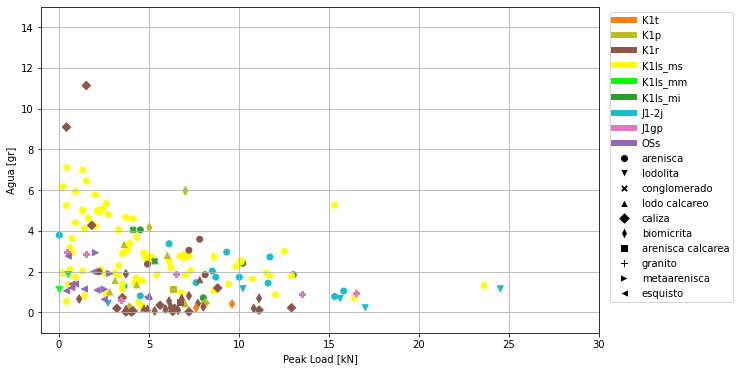

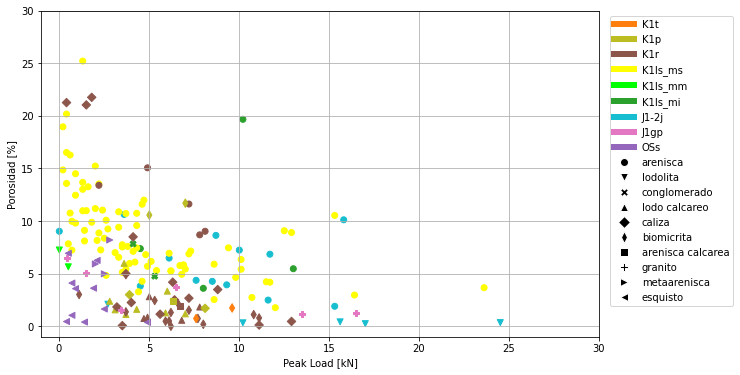

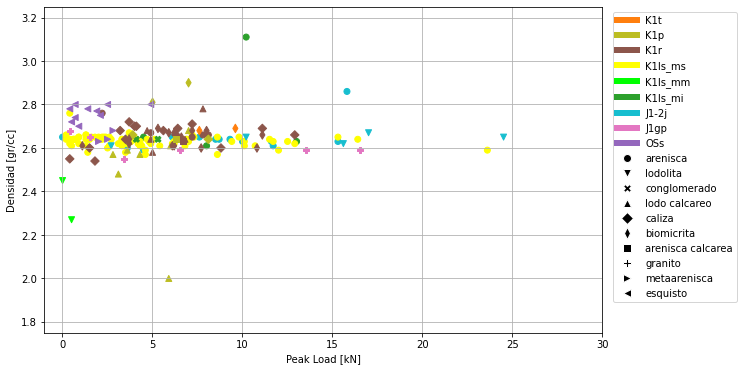

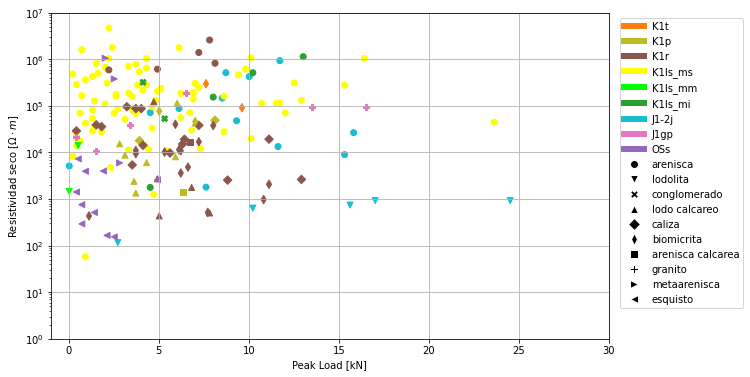

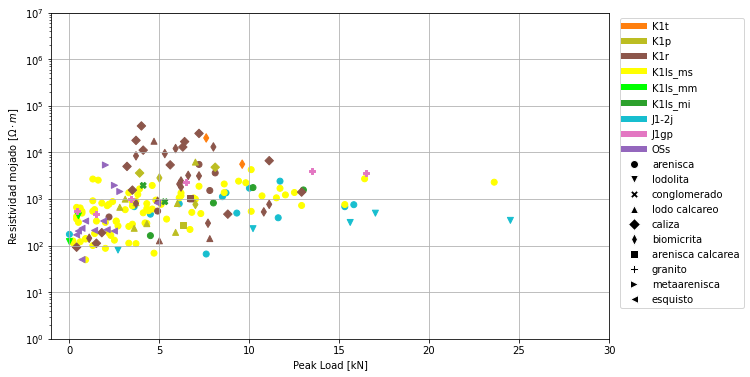

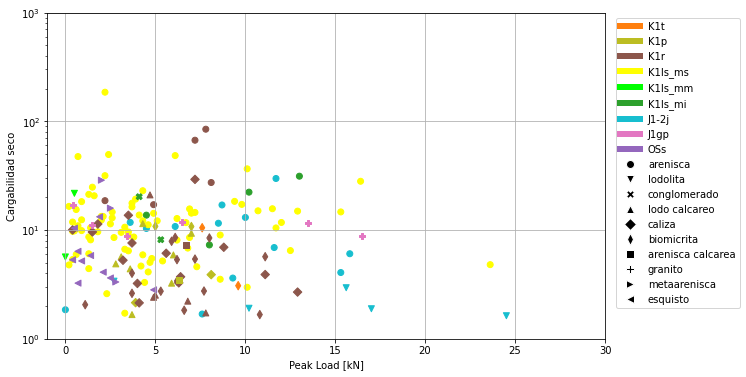

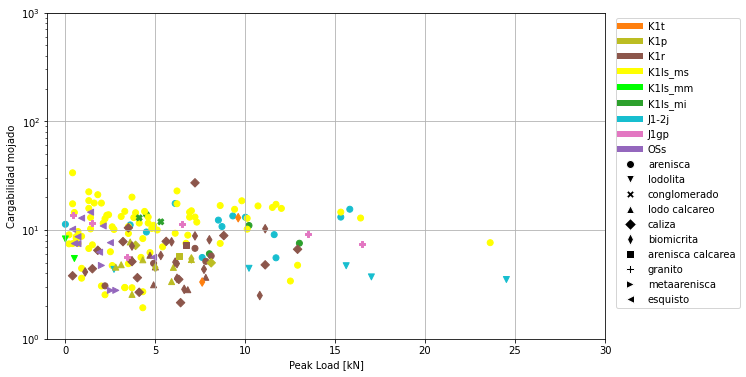

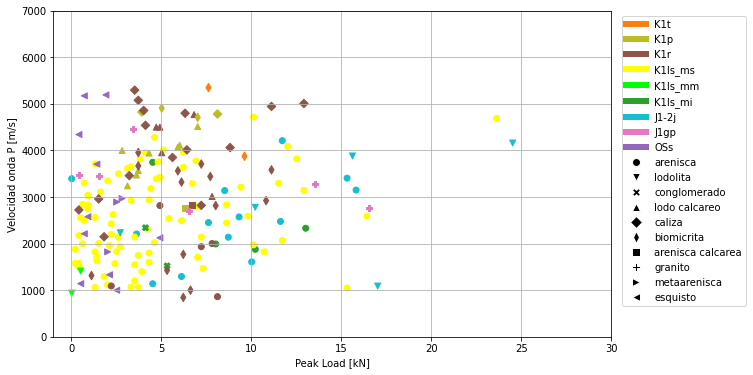

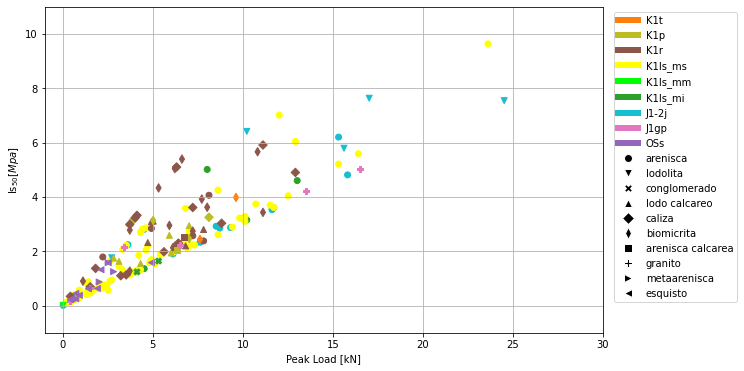

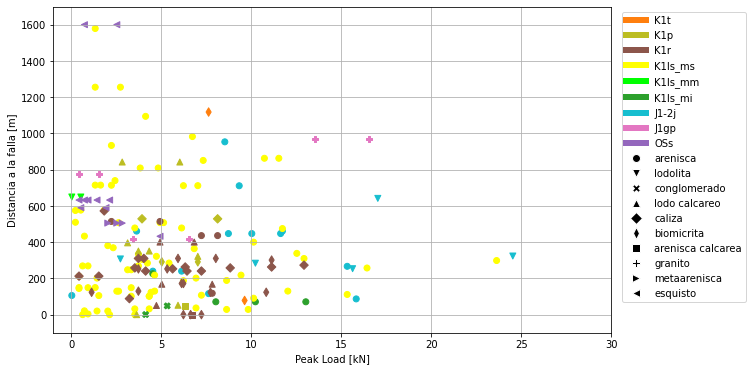

In [ ]:
#@title PeakLoad como variable independiente
propiedad_ejeX = 'PeakLoad'
propiedades_ejeY = ['Agua', 'Porosidad', 'Densidad', 'RhoDry', 
                    'RhoWet', 'CargDry', 'CargWet', 'Vp',
                    'PeakLoad', 'Is50', 'DistFault']
for j in propiedades_ejeY:
  if j != propiedad_ejeX:
    plt.figure(figsize=(10,6))
    for i in simbol_unicos:
      simbol = i
      filtro = petrofisica['Simbolo'] ==  simbol

      plt.scatter(petrofisica[propiedad_ejeX][filtro], petrofisica[j][filtro],
                  c=petrofisica['Color'][filtro], marker=simbol)
    plt.xlabel('Peak Load [kN]')
    plt.xlim(-1, 30)
    plt.grid()
    if j == 'Porosidad':
      plt.ylabel('Porosidad [%]')
      plt.ylim(-1, 30)
    elif j == 'Agua':
      plt.ylabel('Agua [gr]')
      plt.ylim(-1, 15)
    elif j == 'Densidad':
      plt.ylabel('Densidad [gr/cc]')
      plt.ylim(1.75, 3.25)
    elif j == 'RhoDry':
      plt.ylabel('Resistividad seco [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'RhoWet':
      plt.ylabel('Resistividad mojado [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'CargDry':
      plt.ylabel('Cargabilidad seco')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='CargWet':
      plt.ylabel('Cargabilidad mojado')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='Vp':
      plt.ylabel('Velocidad onda P [m/s]')
      plt.ylim(0, 7000)
    elif j == 'PeakLoad':
      plt.ylabel('Peak load [kN]')
      plt.ylim(-1, 30)
    elif j == 'Is50':
      plt.ylabel('Is$_{50} [Mpa]$')
      plt.ylim(-1, 11)
    elif j == 'DistFault':
      plt.ylabel('Distancia a la falla [m]')
      plt.ylim(-100, 1700)
    plt.legend(custom_lines + custom_simbol, labels_unidad + labels_simbol, bbox_to_anchor=(1.25, 1))#, loc=2)
    plt.savefig(('/content/drive/MyDrive/LosSantos/PlotsVs/{}Vs{}.png').format(propiedad_ejeX, j),
                format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
    plt.show()
    print('\n')


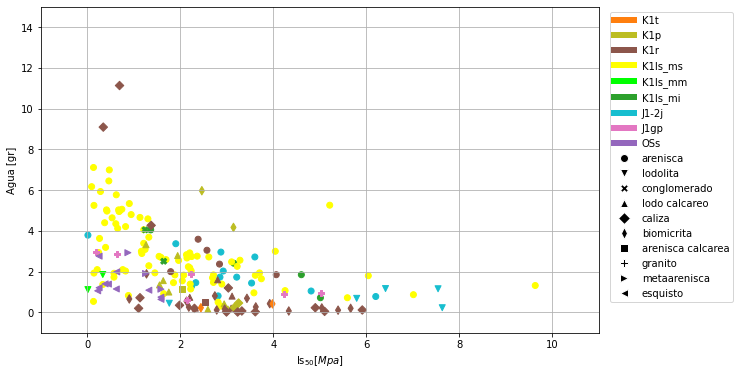

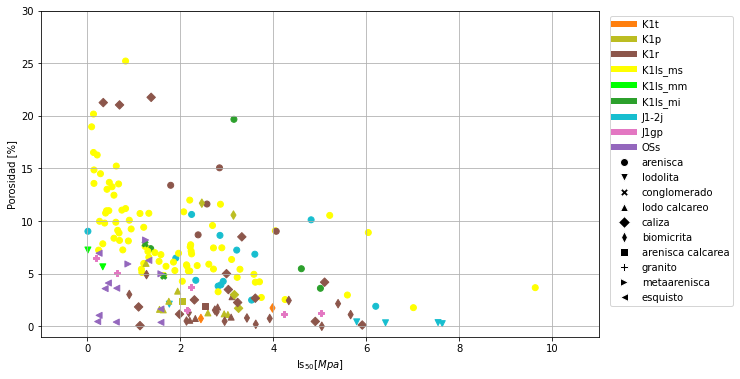

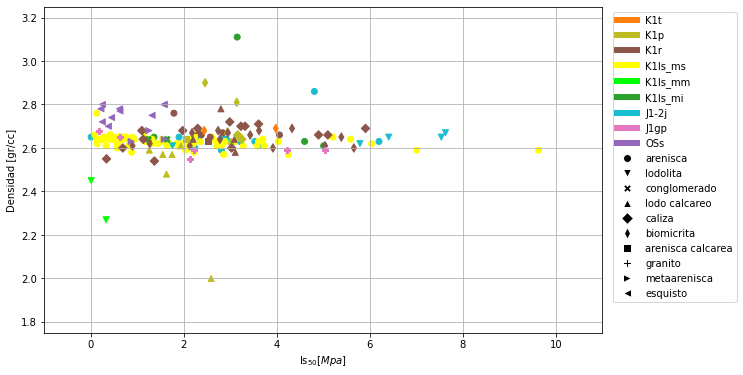

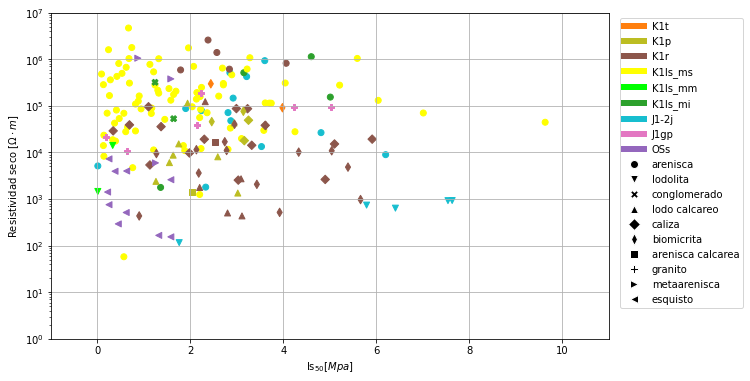

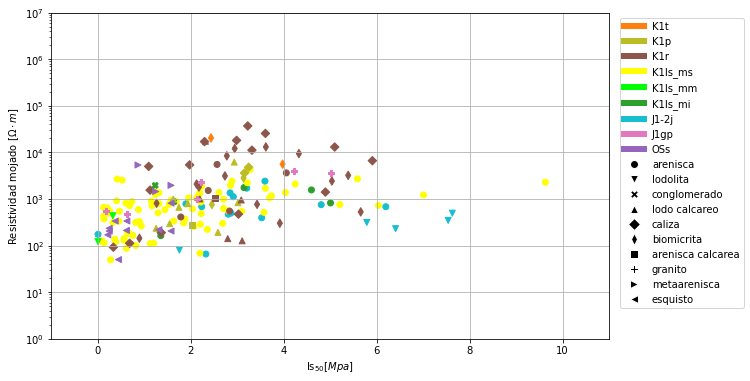

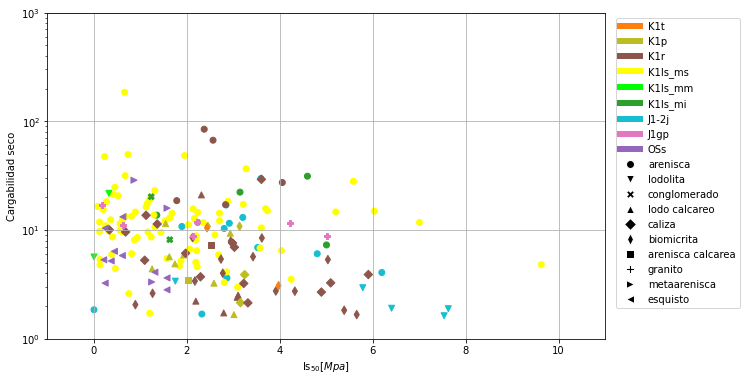

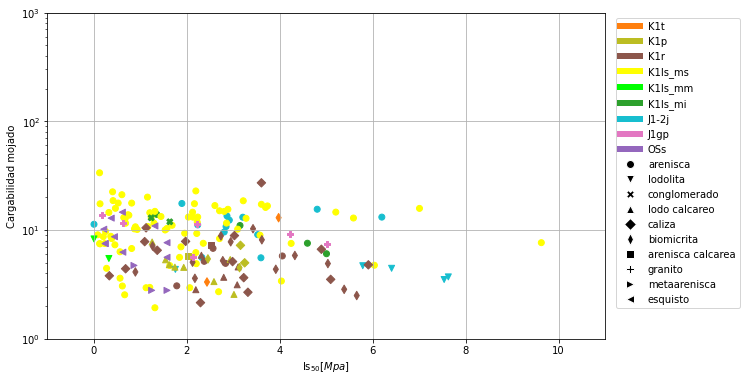

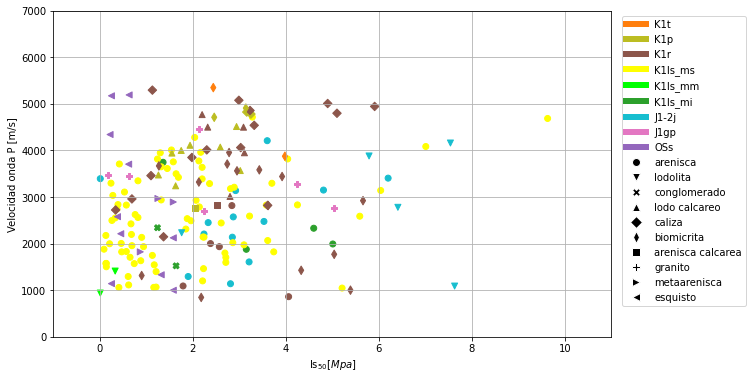

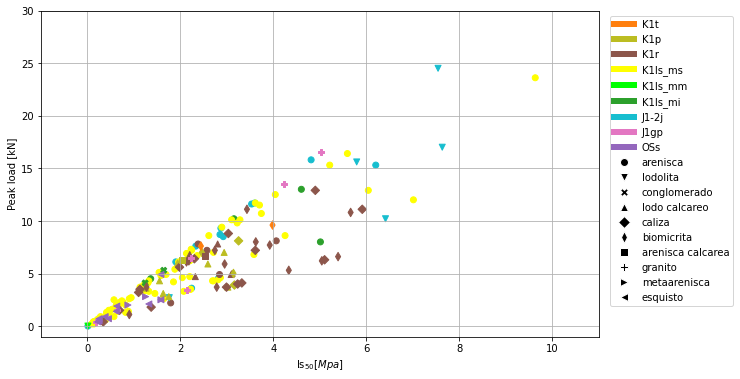

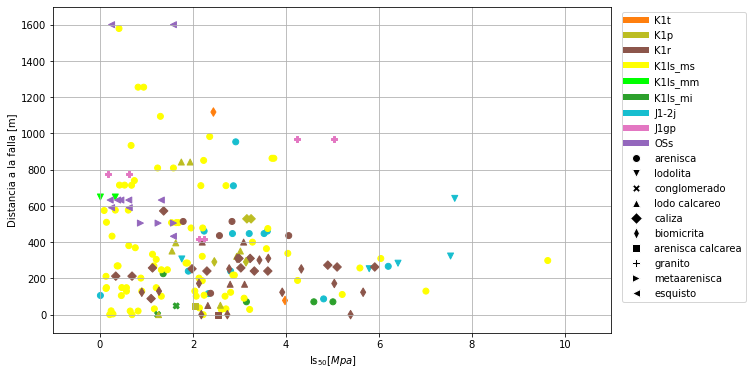

In [ ]:
#@title Is50 como variable independiente
propiedad_ejeX = 'Is50'
propiedades_ejeY = ['Agua', 'Porosidad', 'Densidad', 'RhoDry', 
                    'RhoWet', 'CargDry', 'CargWet', 'Vp',
                    'PeakLoad', 'Is50', 'DistFault']
for j in propiedades_ejeY:
  if j != propiedad_ejeX:
    plt.figure(figsize=(10,6))
    for i in simbol_unicos:
      simbol = i
      filtro = petrofisica['Simbolo'] ==  simbol

      plt.scatter(petrofisica[propiedad_ejeX][filtro], petrofisica[j][filtro],
                  c=petrofisica['Color'][filtro], marker=simbol)
    plt.xlabel('Is$_{50} [Mpa]$')
    plt.xlim(-1, 11)
    plt.grid()
    if j == 'Porosidad':
      plt.ylabel('Porosidad [%]')
      plt.ylim(-1, 30)
    elif j == 'Agua':
      plt.ylabel('Agua [gr]')
      plt.ylim(-1, 15)
    elif j == 'Densidad':
      plt.ylabel('Densidad [gr/cc]')
      plt.ylim(1.75, 3.25)
    elif j == 'RhoDry':
      plt.ylabel('Resistividad seco [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'RhoWet':
      plt.ylabel('Resistividad mojado [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'CargDry':
      plt.ylabel('Cargabilidad seco')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='CargWet':
      plt.ylabel('Cargabilidad mojado')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='Vp':
      plt.ylabel('Velocidad onda P [m/s]')
      plt.ylim(0, 7000)
    elif j == 'PeakLoad':
      plt.ylabel('Peak load [kN]')
      plt.ylim(-1, 30)
    elif j == 'Is50':
      plt.ylabel('Is$_{50} [Mpa]$')
      plt.ylim(-1, 11)
    elif j == 'DistFault':
      plt.ylabel('Distancia a la falla [m]')
      plt.ylim(-100, 1700)
    plt.legend(custom_lines + custom_simbol, labels_unidad + labels_simbol, bbox_to_anchor=(1.25, 1))#, loc=2)
    plt.savefig(('/content/drive/MyDrive/LosSantos/PlotsVs/{}Vs{}.png').format(propiedad_ejeX, j),
                format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
    plt.show()
    print('\n')


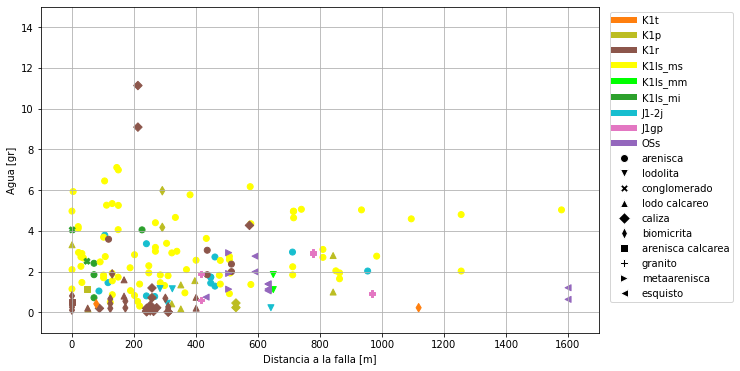

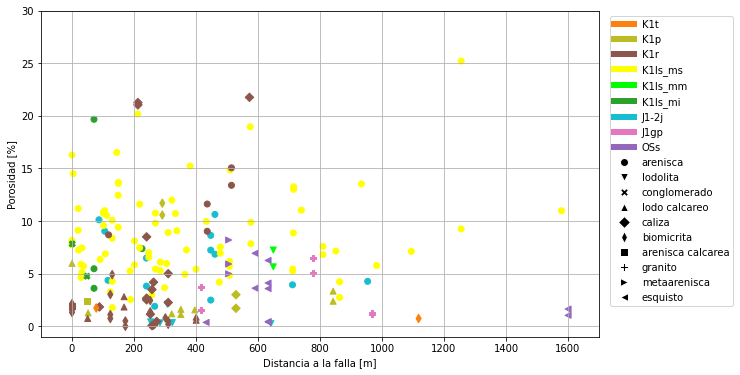

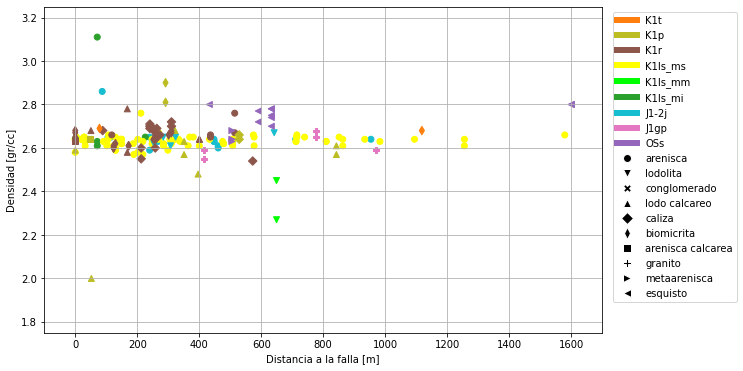

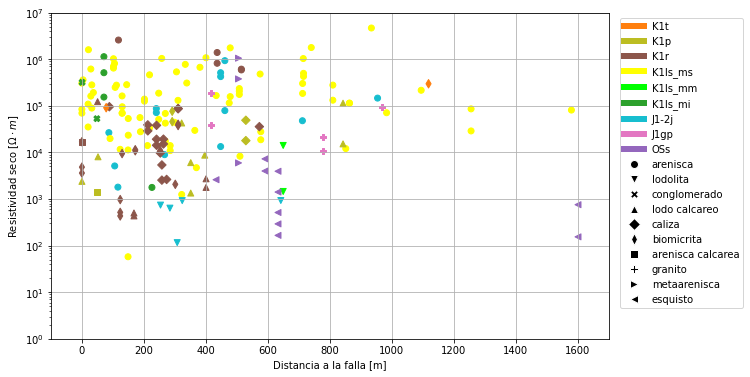

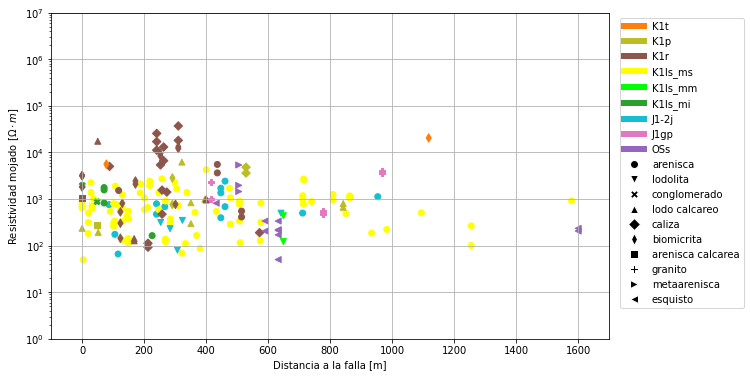

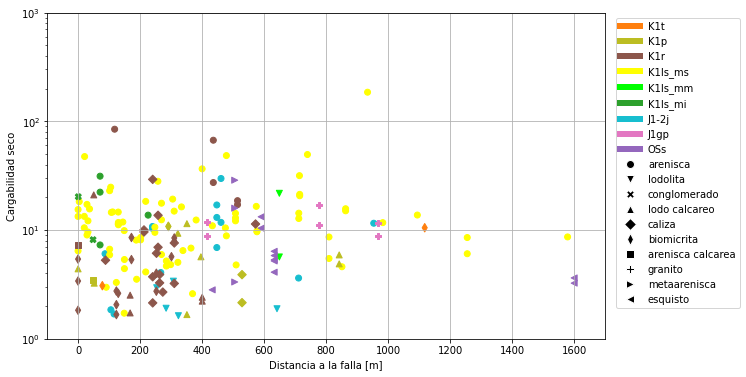

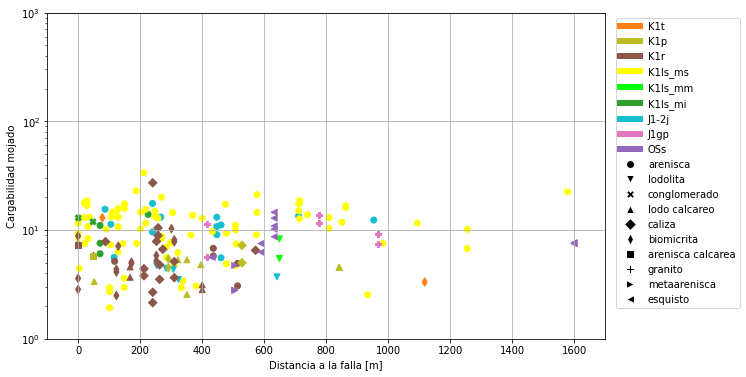

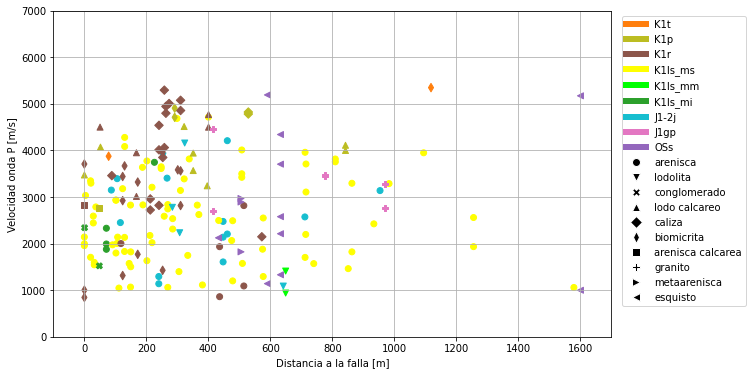

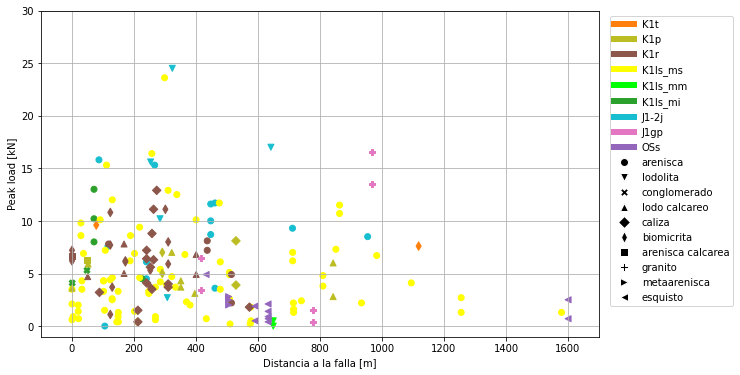

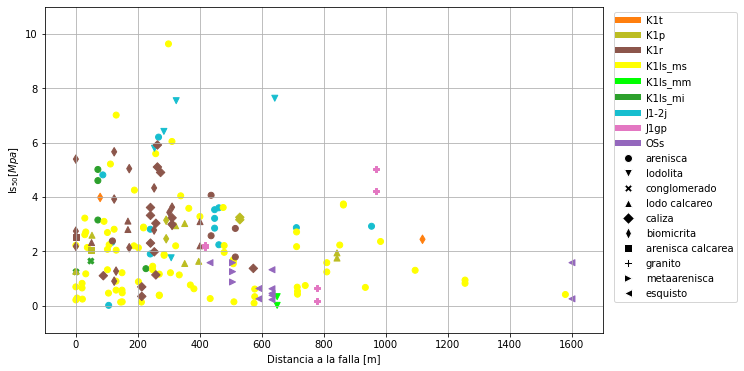

In [ ]:
#@title DistFault como variable independiente
propiedad_ejeX = 'DistFault'
propiedades_ejeY = ['Agua', 'Porosidad', 'Densidad', 'RhoDry', 
                    'RhoWet', 'CargDry', 'CargWet', 'Vp',
                    'PeakLoad', 'Is50', 'DistFault']
for j in propiedades_ejeY:
  if j != propiedad_ejeX:
    plt.figure(figsize=(10,6))
    for i in simbol_unicos:
      simbol = i
      filtro = petrofisica['Simbolo'] ==  simbol

      plt.scatter(petrofisica[propiedad_ejeX][filtro], petrofisica[j][filtro],
                  c=petrofisica['Color'][filtro], marker=simbol)
    plt.xlabel('Distancia a la falla [m]')
    plt.xlim(-100, 1700)
    plt.grid()
    if j == 'Porosidad':
      plt.ylabel('Porosidad [%]')
      plt.ylim(-1, 30)
    elif j == 'Agua':
      plt.ylabel('Agua [gr]')
      plt.ylim(-1, 15)
    elif j == 'Densidad':
      plt.ylabel('Densidad [gr/cc]')
      plt.ylim(1.75, 3.25)
    elif j == 'RhoDry':
      plt.ylabel('Resistividad seco [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'RhoWet':
      plt.ylabel('Resistividad mojado [$\Omega \cdot m$]')
      plt.yscale('log')
      plt.ylim(10**0, 10**7)
    elif j == 'CargDry':
      plt.ylabel('Cargabilidad seco')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='CargWet':
      plt.ylabel('Cargabilidad mojado')
      plt.yscale('log')
      plt.ylim(10**0, 10**3)
    elif j =='Vp':
      plt.ylabel('Velocidad onda P [m/s]')
      plt.ylim(0, 7000)
    elif j == 'PeakLoad':
      plt.ylabel('Peak load [kN]')
      plt.ylim(-1, 30)
    elif j == 'Is50':
      plt.ylabel('Is$_{50} [Mpa]$')
      plt.ylim(-1, 11)
    elif j == 'DistFault':
      plt.ylabel('Distancia a la falla [m]')
      plt.ylim(-100, 1700)
    plt.legend(custom_lines + custom_simbol, labels_unidad + labels_simbol, bbox_to_anchor=(1.25, 1))#, loc=2)
    plt.savefig(('/content/drive/MyDrive/LosSantos/PlotsVs/{}Vs{}.png').format(propiedad_ejeX, j),
                format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
    plt.show()
    print('\n')


En algunas graficas se puede ver de manera visual los resultados de la Correlación de Pearson. También comparar resultados de la muestra en seco y mojada para los valores de resistividad y cargabilidad. Donde se evidencia que a mayores cantidades de agua presente en la muestra la resistividad de la misma decae, en las areniscas (círculos) es más notorio este cambio, en las calizas (rombos) es poca. Resultados también asociables con la Porosidad.

En la gráfica de Porosidad vs Vp, se aprecia una disminución de Vp al aumentar la porosidad de la muestra, pero no se ve una línea recta marcada, lo que reflejaría el valor de -0.37 obtenido en la Correlación de Pearson. Semejante las gráficas de la Porosidad vs Is50/PeakLoad se observa un decaimiento en los valores, pero no lineal, siendo más una curva.

Algunas graficas dejan ver rangos amplios de distribución de las litologías. Para ello realizo graficas de caja y de enjambre.


#Boxplots

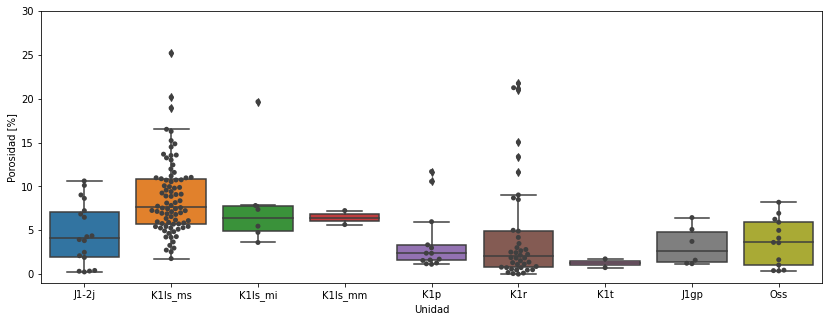

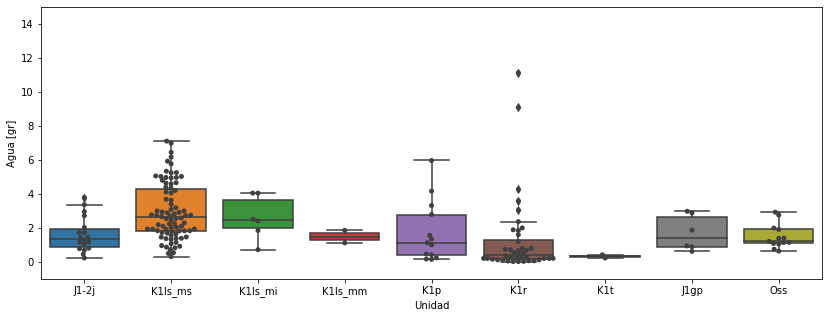

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 41.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


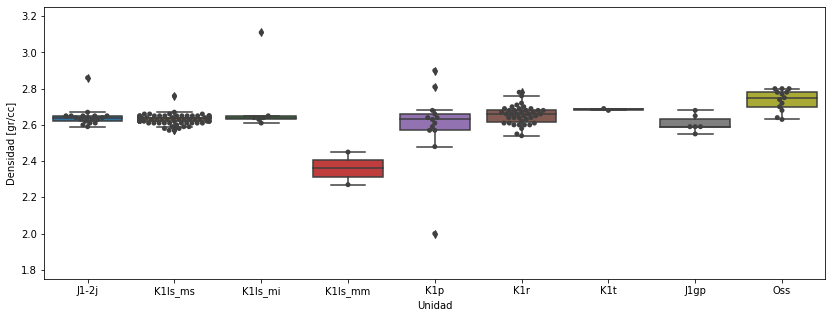

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 24.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 45.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


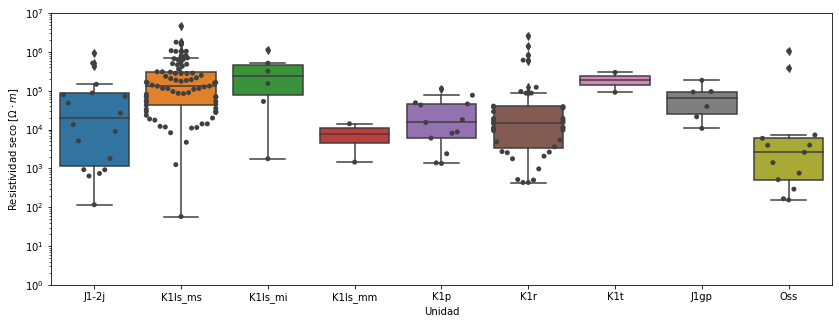

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 51.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


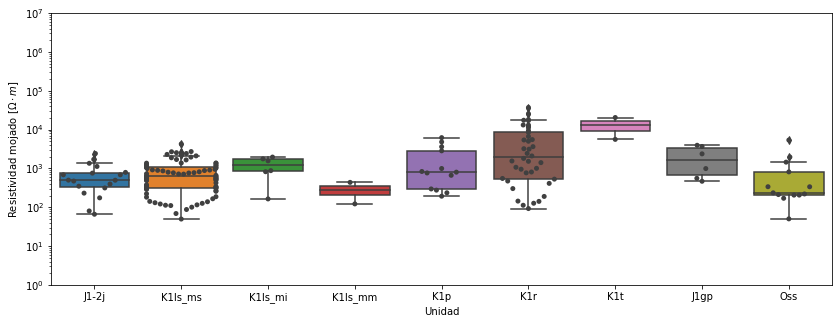

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 19.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 12.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


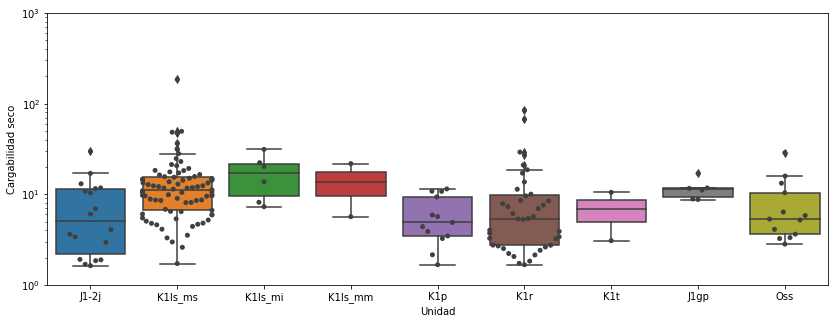

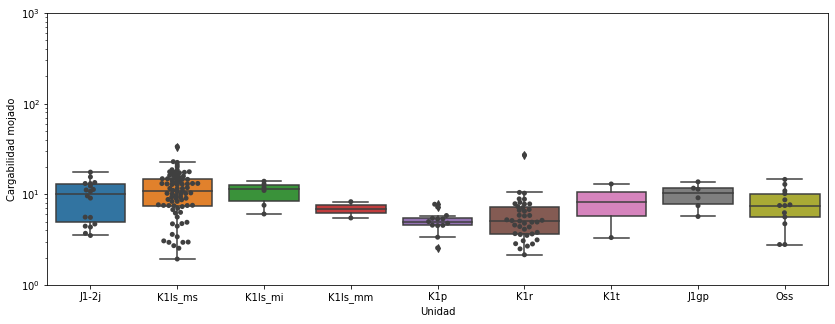

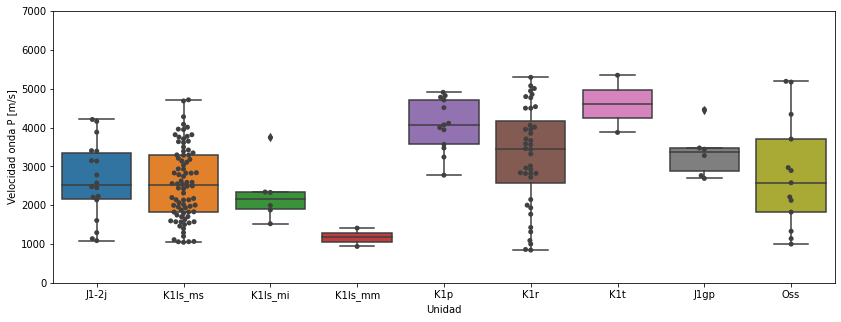

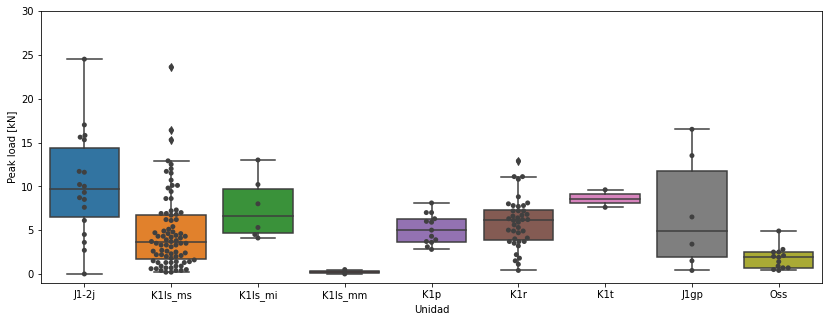

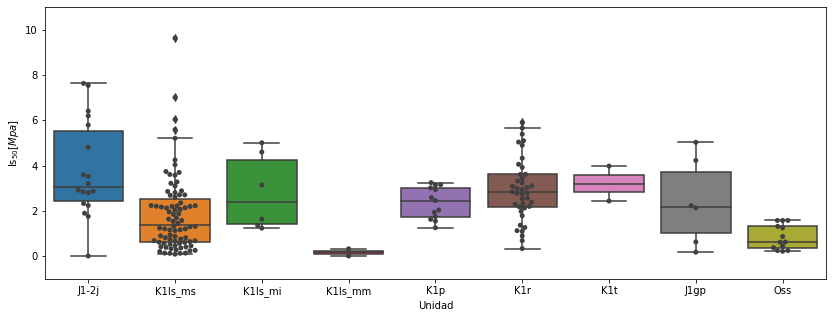

'\nplt.figure(figsize=(13,7))\nax = sn.boxplot(x=\'Formacion\', y=\'Porosidad\', data=petrofisica)\nax = sn.swarmplot(x=\'Formacion\', y=\'Porosidad\', data=petrofisica, color=".25")\nplt.ylabel(\'Porosidad [%]\')\nplt.show()'

In [ ]:
#@title  Por unidad geologica
propiedades = ['Porosidad', 'Agua', 'Densidad', 'RhoDry', 'RhoWet', 'CargDry',
               'CargWet', 'Vp', 'PeakLoad', 'Is50']

for i in propiedades:
  plt.figure(figsize=(14,5))
  ax = sn.boxplot(x='Unidad', y=i, data=petrofisica)
  ax = sn.swarmplot(x='Unidad', y=i,  data=petrofisica, color=".25")
  #plt.ylabel(('{}').format(i))
  if i == 'Porosidad':
    plt.ylabel('Porosidad [%]')
    plt.ylim(-1, 30)
  elif i == 'Agua':
    plt.ylabel('Agua [gr]')
    plt.ylim(-1, 15)
  elif i == 'Densidad':
    plt.ylabel('Densidad [gr/cc]')
    plt.ylim(1.75, 3.25)
  elif i == 'RhoDry':
    plt.ylabel('Resistividad seco [$\Omega \cdot m$]')
    plt.yscale('log')
    plt.ylim(10**0, 10**7)
  elif i == 'RhoWet':
    plt.ylabel('Resistividad mojado [$\Omega \cdot m$]')
    plt.yscale('log')
    plt.ylim(10**0, 10**7)
  elif i == 'CargDry':
    plt.ylabel('Cargabilidad seco')
    plt.yscale('log')
    plt.ylim(10**0, 10**3)
  elif i =='CargWet':
    plt.ylabel('Cargabilidad mojado')
    plt.yscale('log')
    plt.ylim(10**0, 10**3)
  elif i =='Vp':
    plt.ylabel('Velocidad onda P [m/s]')
    plt.ylim(0, 7000)
  elif i == 'PeakLoad':
    plt.ylabel('Peak load [kN]')
    plt.ylim(-1, 30)
  elif i == 'Is50':
    plt.ylabel('Is$_{50} [Mpa]$')
    plt.ylim(-1, 11)
  
  print('\n')
  plt.savefig(('/content/drive/MyDrive/LosSantos/Boxplot/BoxUnidades_{}.png').format(i),
              format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
  
  plt.show()

'''
plt.figure(figsize=(13,7))
ax = sn.boxplot(x='Formacion', y='Porosidad', data=petrofisica)
ax = sn.swarmplot(x='Formacion', y='Porosidad', data=petrofisica, color=".25")
plt.ylabel('Porosidad [%]')
plt.show()'''
#ax = sns.swarmplot(x="day", y="total_bill", data=tips, color=".25")

In [ ]:
#para ver los valores estadisticos para una unidad geologica determinada 
'''
'Oss': silgara
'J1gp': granito
'J1-2j': jordan
'K1ls_mi': santos inf
'K1ls_mm': santos med
'K1ls_ms': santo sup
'K1r': rosablanca
'K1p': paja
'K1t': tablazo 
'''
#en la siguiente celda estan las tablas compiladas
formacionInteres = 'K1ls_mi'

data = petrofisica[propiedades][petrofisica['Unidad'] == formacionInteres]
np.round(data.describe(), 2)


,Porosidad,Agua,Densidad,RhoDry,RhoWet,CargDry,CargWet,Vp,PeakLoad,Is50
count,6.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00
mean,8.12,2.60,2.71,363005.83,1191.19,17.18,10.58,2301.50,7.54,2.83
std,5.88,1.29,0.19,422209.87,684.81,9.24,3.11,770.36,3.55,1.68
min,3.61,0.72,2.61,1773.65,163.71,7.30,6.06,1523.00,4.12,1.24
25%,4.94,1.99,2.63,78251.81,835.92,9.55,8.43,1906.50,4.72,1.43
50%,6.42,2.46,2.64,237022.56,1220.75,17.00,11.47,2161.00,6.67,2.40
75%,7.72,3.66,2.65,465461.79,1711.82,21.82,12.70,2338.25,9.67,4.24
max,19.67,4.05,3.11,1135279.79,1958.78,31.31,13.94,3745.00,13.02,5.01


Tabla resumen de las propiedades, son los resultados visibles en los diagramas de cajas y de enjambre, por formacion:


Fm. Los Santos Sup. | Porosidad | Agua | Densidad | RhoDry | RhoWet | CargDry | CargWet | Vp | PeakLoad | Is 50
---|---|---|---|---|---|---|---|---|---|---
count |	82.00 |	82.00 |	82.00 |	82.00 |	82.00 |	82.00 |	82.00 |	82.00 |	82.00 |	82.00
mean |	8.72 |	2.95 |	2.63 |	337647.72 |	849.07 |	15.12 |	11.34 |	2557.95 |	4.83 |	1.85
std |	4.21 |	1.65 |	0.03 |	621525.37 |	770.52 |	21.26 |	5.66 |	930.13 |	4.30 |	1.69
min |	1.77 |	0.31 |	2.57 |	57.67 |	49.64 |	1.72 |	1.93 |	1046.00 |	0.22 |	0.09
25% |	5.74 |	1.81 |	2.62 |	43008.96 |	308.77 |	6.71 |	7.51 |	1823.00 |	1.67 |	0.63
50% |	7.67 |	2.63 |	2.64 |	131620.67 |	634.76 |	11.30 |	10.92 |	2516.50 |	3.72 |	1.38
75% |	10.85 |	4.31 |	2.64 |	308577.99 |	1061.56 |	15.35 |	14.80 |	3293.25 |	6.80 |	2.55
max |	25.21 |	7.11 |	2.76 |	4680623.90 |	4270.46 |	185.44 |	33.65 |	4715.00 |	23.62 |	9.63



Fm. Los Santos Med. | Porosidad | Agua | Densidad | RhoDry | RhoWet | CargDry | CargWet | Vp | PeakLoad | Is 50
---|---|---|---|---|---|---|---|---|---|---
count |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |
mean |	6.45 |	1.49 |	2.36 |	7788.44 |	279.52 |	13.72 |	6.88 |	1175.00 |	0.27 |	0.17
std |	1.13 |	0.52 |	0.13 |	8959.44 |	222.94 |	11.41 |	1.99 |	333.75 |	0.35 |	0.23
min |	5.65 |	1.12 |	2.27 |	1453.16 |	121.88 |	5.66 |	5.48 |	939.00 |	0.02 |	0.01
25% |	6.05 |	1.31 |	2.32 |	4620.80 |	200.70 |	9.69 |	6.18 |	1057.00 |	0.15 |	0.09
50% |	6.45 |	1.49 |	2.36 |	7788.44 |	279.52 |	13.72 |	6.88 |	1175.00 |	0.27 |	0.17
75% |	6.85 |	1.68 |	2.41 |	10956.08 |	358.34 |	17.76 |	7.59 |	1293.00 |	0.40 |	0.25
max |	7.25 |	1.86 |	2.45 |	14123.72 |	437.16 |	21.79 |	8.29 |	1411.00 |	0.52 |	0.33



Fm. Los Santos Inf. | Porosidad | Agua | Densidad | RhoDry | RhoWet | CargDry | CargWet | Vp | PeakLoad | Is 50
---|---|---|---|---|---|---|---|---|---|---
count |	6.00 |	6.00 |	6.00 |	6.00 |	6.00 |	6.00 |	6.00 |	6.00 |	6.00 |	6.00
mean |	8.12 |	2.60 |	2.71 |	363005.83 |	1191.19 |	17.18 |	10.58	| 2301.50 |	7.54 |	2.83
std |	5.88 |	1.29 |	0.19 |	422209.87 |	684.81 |	9.24 |	3.11 |	770.36 |	3.55 |	1.68
min |	3.61 |	0.72 |	2.61 |	1773.65 |	163.71 |	7.30 |	6.06 |	1523.00 |	4.12 |	1.24
25% |	4.94 |	1.99 |	2.63 |	78251.81 |	835.92 |	9.55 |	8.43 |	1906.50 |	4.72 |	1.43
50% |	6.42 |	2.46 |	2.64 |	237022.56 |	1220.75 |	17.00 |	11.47 |	2161.00 |	6.67 |	2.40
75% |	7.72 |	3.66 |	2.65 |	465461.79 |	1711.82 |	21.82 |	12.70 |	2338.25 |	9.67 |	4.24
max |	19.67 |	4.05 |	3.11 |	1135279.79 |	1958.78 |	31.31 |	13.94 |	3745.00 |	13.02 |	5.01



Fm. Jordan | Porosidad | Agua | Densidad | RhoDry | RhoWet | CargDry | CargWet | Vp | PeakLoad | Is 50
---|---|---|---|---|---|---|---|---|---|---
count |	18.00 |	18.00 |	18.00 |	18.00 |	18.00 |	18.00 |	18.00 |	18.00 |	18.00 |	18.00
mean |	4.62 |	1.60 |	2.65 |	131235.43 |	699.87 |	7.80 |	9.39 |	2628.89 |	10.17 |	3.80
std |	3.52 |	1.01 |	0.06 |	248214.63 |	612.10 |	7.28 |	4.44 |	976.12 |	5.98 |	2.13
min |	0.25 |	0.23 |	2.59 |	115.86 |	66.02 |	1.63 |	3.51 |	1089.00 |	0.02 |	0.01
25% |	1.95 |	0.87 |	2.62 |	1146.11 |	322.56 |	2.17 |	4.92 |	2155.00 |	6.50 |	2.45
50% |	4.10 |	1.36 |	2.64 |	19973.72 |	498.00 |	5.06 |	10.19 |	2524.50 |	9.67 |	3.06
75% |	7.14 |	1.96 |	2.65 |	85305.03 |	781.08 |	11.37 |	12.94	| 3332.75 |	14.42 |	5.54
max	| 10.63 |	3.79 |	2.86 |	932321.51 |	2418.12 |	29.82 |	17.57 |	4209.00 |	24.52 |	7.63


Granito Pescadero | Porosidad | Agua | Densidad | RhoDry | RhoWet | CargDry | CargWet | Vp | PeakLoad | Is 50
---|---|---|---|---|---|---|---|---|---|---
count	| 6.00 |	6.00 |	6.00 |	6.00 |	6.00 |	6.00 |	6.00 |	6.00 |	6.00 |	6.00
mean |	3.22 |	1.70 |	2.61 |	74250.43 |	2000.53 |	11.52 |	9.86 |	3352.83 |	6.99 |	2.41
std |	2.23 |	1.04 |	0.05 |	65314.11 |	1560.29 |	2.99 |	2.97 |	639.97 |	6.63 |	1.92
min |	1.19 |	0.62 |	2.55 |	10746.13 |	466.50 |	8.76 |	5.69 |	2691.00 |	0.42 |	0.18
25% |	1.33 |	0.90 |	2.59 |	25839.81 |	665.02 |	9.44 |	7.90 |	2893.00 |	2.00 |	1.01
50% |	2.66 |	1.40 |	2.59 |	66003.12 |	1681.22 |	11.39 | 10.26 |	3361.50 |	4.97 |	2.18
75% |	4.76 |	2.63 |	2.64 |	94724.58 |	3348.71 |	11.72 |	11.61 |	3467.00 |	11.77 |	3.73
max |	6.45 |	2.98 |	2.68 |	185999.77 |	3943.40 |	16.99 |	13.73 |	4464.00 |	16.52 |	5.03


Silgará | Porosidad | Agua | Densidad | RhoDry | RhoWet | CargDry | CargWet | Vp | PeakLoad | Is 50
---|---|---|---|---|---|---|---|---|---|---
count |	13.00 |	13.00 |	13.00 |	13.00 |	13.00 |	13.00 |	13.00 |	13.00 |	13.00 |	13.00
mean |	3.66 |	1.49 |	2.74 |	112107.75 |	890.14 |	8.32 |	7.86 |	2806.08 |	1.81 |	0.84
std |	2.71 |	0.71 |	0.06 |	300916.25 |	1462.54 |	7.38	3.59 |	1429.86 |	1.25 |	0.55
min	| 0.37 |	0.64 |	2.63 |	154.12 |	50.15 |	2.82 |	2.79 |	999.00 |	0.42 |	0.22
25% |	1.04 |	1.09 |	2.70 |	513.27 |	205.46 |	3.63 |	5.62 |	1823.00	| 0.72 |	0.38
50% |	3.62 |	1.21 |	2.75 |	2593.46 |	235.02 |	5.33 |	7.52 |	2578.00 |	1.92 |	0.63
75% |	5.92 |	1.91 |	2.78 |	5955.15 |	814.06 |	10.41 |	10.18 |	3705.00 |	2.52 |	1.32
max |	8.20 |	2.93 |	2.80 |	1052003.40 |	5371.57 |	28.76 |	14.60 |	5191.00 |	4.92 |	1.58

Fm. Rosablanca | Porosidad | Agua | Densidad | RhoDry | RhoWet | CargDry | CargWet | Vp | PeakLoad | Is 50
---|---|---|---|---|---|---|---|---|---|---
count |	40.00 |	40.00 |	40.00 |	40.00 |	40.00 |	40.00 |	40.00 |	40.00 |	40.00 |	40.00
mean |	4.58 |	1.28 |	2.65 |	170070.64 |	5840.68 |	10.84 |	5.99 |	3253.75 |	5.92 |	2.93
std |	6.09 |	2.30 |	0.05 |	477713.42 |	8079.43| 	16.67 |	4.06 |	1291.34 |	2.80 |	1.38
min |	0.00 |	0.02 |	2.54 |	433.39 |	92.42 |	1.67 |	2.15 |	845.00 |	0.42 |	0.34 |
25% |	0.78 |	0.19 |	2.62 |	3387.51 |	545.38 |	2.73 |	3.67 |	2578.25 |	3.94 |	2.17
50% |	2.01 |	0.39 |	2.66 |	14713.10 |	1952.14 |	5.38 |	5.10 |	3449.50 |	6.17 |	2.82
75%	| 4.93 | 1.30 |	2.68 |	39323.83 |	8694.46 |	9.72 |	7.18 |	4170.50 |	7.34 |	3.61
max |	21.76 |	11.13 |	2.78 |	2582162.39 |	37015.69 |	84.69 |	27.21 |	5294.00 |	12.92 |	5.91

Fm. Paja | Porosidad | Agua | Densidad | RhoDry | RhoWet | CargDry | CargWet | Vp | PeakLoad | Is 50
---|---|---|---|---|---|---|---|---|---|---
count |	13.00 |	13.00 |	13.00 |	13.00 |	13.00 |	13.00 |	13.00 |	13.00 |	13.00 |	13.00
mean |	3.68 |	1.75 |	2.60 |	29947.95 |	1732.26 |	5.98 |	5.10 |	4070.62 |	5.15 |	2.36
std |	3.56 |	1.81 |	0.21 |	34474.12 |	1985.88 |	3.45 |	1.38 |	669.51 |	1.70 |	0.70
min |	1.12 |	0.15 |	2.00 |	1342.88 |	192.48 |	1.67 |	2.56 |	2775.00 |	2.82 |	1.26
25% |	1.56 |	0.42 |	2.57 |	6042.39 |	295.81 |	3.47 |	4.54 |	3568.00 |	3.72 |	1.75
50% |	2.38 |	1.13 |	2.63 |	15257.22 |	800.63 |	4.89 |	5.00 |	4071.00 |	5.02 |	2.46
75% |	3.34 |	2.79 |	2.66 |	45763.08 |	2836.10 |	9.35 |	5.43 |	4711.00 |	6.32 |	3.02
max |	11.70 |	5.97 |	2.90 |	113938.02 |	6205.22 |	11.46 |	7.77 |	4908.00 |	8.12 |	3.25

Fm. Tablazo | Porosidad | Agua | Densidad | RhoDry | RhoWet | CargDry | CargWet | Vp | PeakLoad | Is 50
---|---|---|---|---|---|---|---|---|---|---
count |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00
mean |	1.24 |	0.32 |	2.68 |	194233.69 |	13016.76 |	6.80 |	8.16 |	4611.50 |	8.62 |	3.21
std |	0.71 |	0.13 |	0.01 |	145822.63 |	10499.10 |	5.25 |	6.84 |	1041.57 |	1.41 |	1.09
min |	0.74 |	0.23 |	2.68 |	91121.52 |	5592.77 |	3.08 |	3.33 |	3875.00 |	7.62 |	2.44
25% |	0.99 |	0.28 |	2.68 |	142677.60 |	9304.76 |	4.94 |	5.75 |	4243.25 |	8.12 |	2.82
50% |	1.24 |	0.32 |	2.68 |	194233.69 |	13016.76 |	6.80 |	8.16 |	4611.50 |	8.62 |	3.21
75% |	1.49 |	0.37 |	2.69 |	245789.78 |	16728.75 |	8.65 |	10.58 |	4979.75 |	9.12 |	3.60
max |	1.74 |	0.42 |	2.69 |	297345.86 |	20440.74 |	10.51 |	13.00 |	5348.00 |	9.62 |	3.98


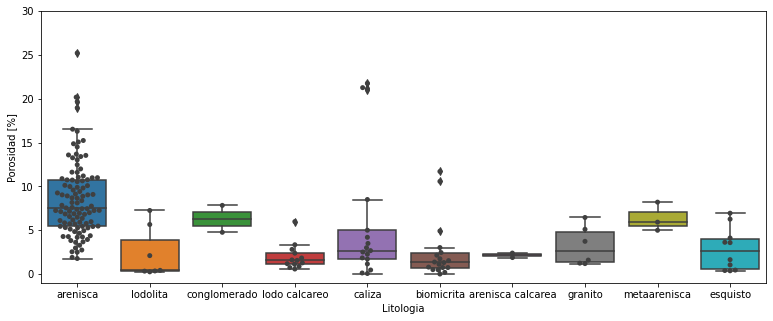

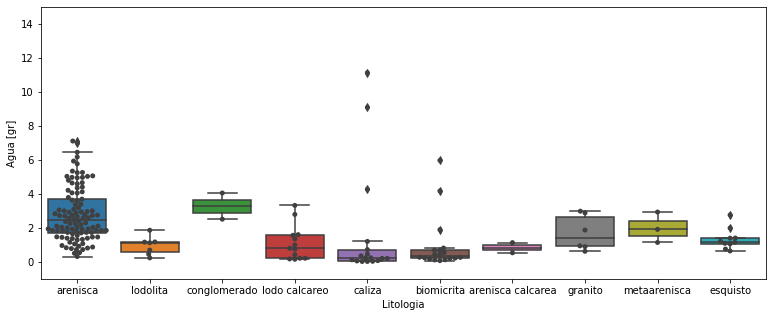

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 54.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


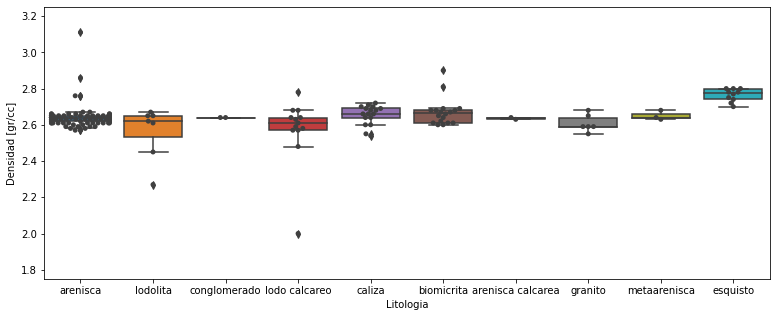

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 34.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 17.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 27.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


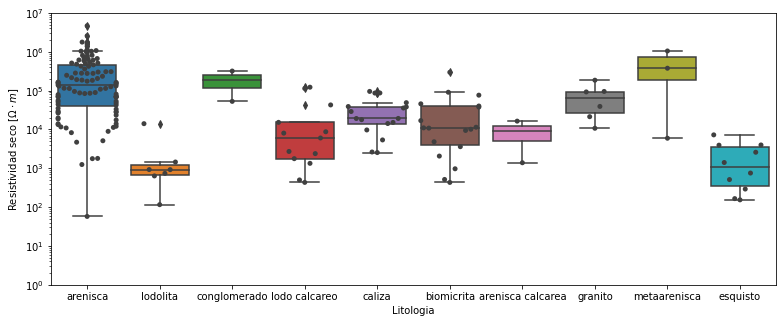

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 57.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


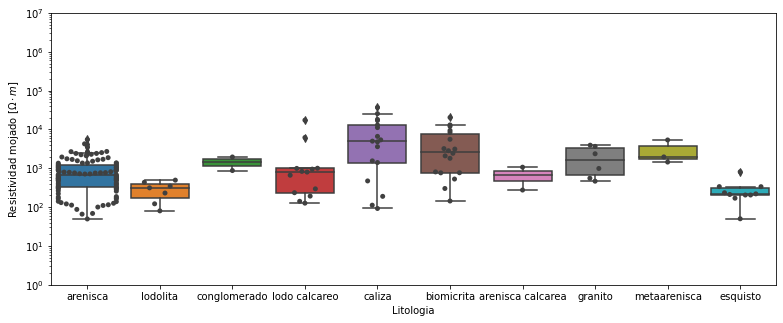

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 31.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


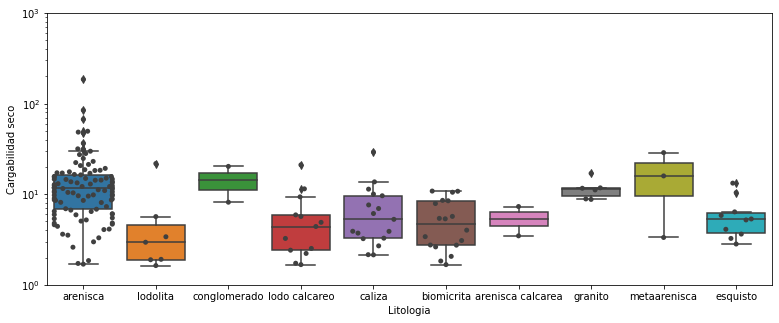

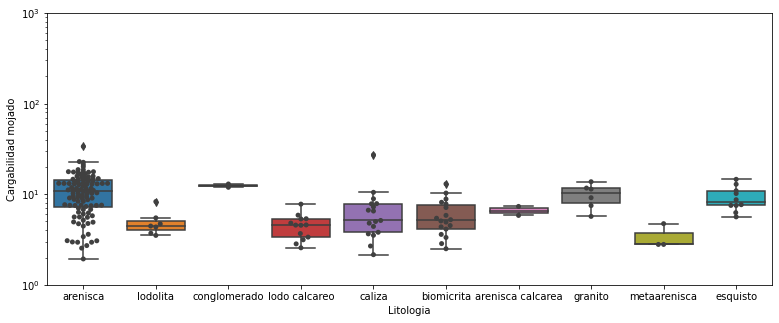

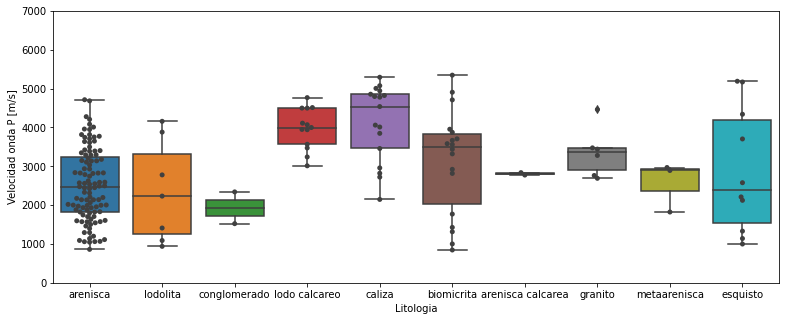

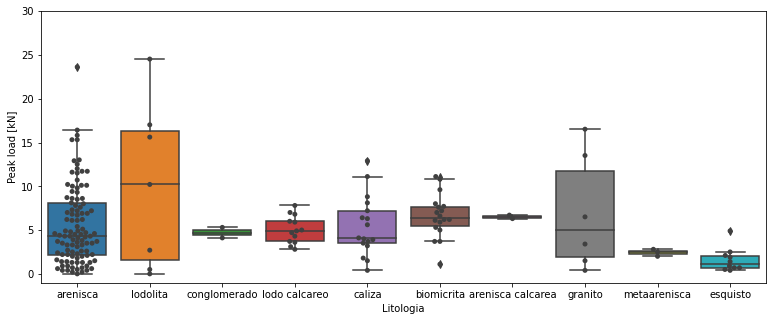

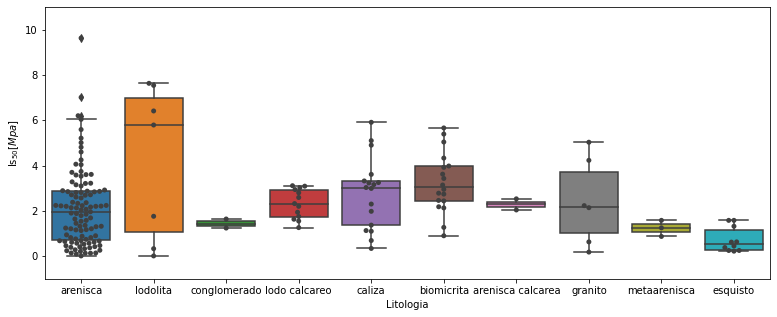

'\nplt.figure(figsize=(13,7))\nax = sn.boxplot(x=\'Formacion\', y=\'Porosidad\', data=petrofisica)\nax = sn.swarmplot(x=\'Formacion\', y=\'Porosidad\', data=petrofisica, color=".25")\nplt.ylabel(\'Porosidad [%]\')\nplt.show()'

In [ ]:
#@title Por litologia
propiedades = ['Porosidad', 'Agua', 'Densidad', 'RhoDry', 'RhoWet', 'CargDry',
               'CargWet', 'Vp', 'PeakLoad', 'Is50']

for i in propiedades:
  plt.figure(figsize=(13,5))
  ax = sn.boxplot(x='Litologia', y=i, data=petrofisica)
  ax = sn.swarmplot(x='Litologia', y=i,  data=petrofisica, color=".25")
  #plt.ylabel(('{}').format(i))
  if i == 'Porosidad':
    plt.ylabel('Porosidad [%]')
    plt.ylim(-1, 30)
  elif i == 'Agua':
    plt.ylabel('Agua [gr]')
    plt.ylim(-1, 15)
  elif i == 'Densidad':
    plt.ylabel('Densidad [gr/cc]')
    plt.ylim(1.75, 3.25)
  elif i == 'RhoDry':
    plt.ylabel('Resistividad seco [$\Omega \cdot m$]')
    plt.yscale('log')
    plt.ylim(10**0, 10**7)
  elif i == 'RhoWet':
    plt.ylabel('Resistividad mojado [$\Omega \cdot m$]')
    plt.yscale('log')
    plt.ylim(10**0, 10**7)
  elif i == 'CargDry':
    plt.ylabel('Cargabilidad seco')
    plt.yscale('log')
    plt.ylim(10**0, 10**3)
  elif i =='CargWet':
    plt.ylabel('Cargabilidad mojado')
    plt.yscale('log')
    plt.ylim(10**0, 10**3)
  elif i =='Vp':
    plt.ylabel('Velocidad onda P [m/s]')
    plt.ylim(0, 7000)
  elif i == 'PeakLoad':
    plt.ylabel('Peak load [kN]')
    plt.ylim(-1, 30)
  elif i == 'Is50':
    plt.ylabel('Is$_{50} [Mpa]$')
    plt.ylim(-1, 11)

  plt.savefig(('/content/drive/MyDrive/LosSantos/Boxplot/BoxLitos_{}.png').format(i),
              format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
  
  plt.show()
  print('\n')
'''
plt.figure(figsize=(13,7))
ax = sn.boxplot(x='Formacion', y='Porosidad', data=petrofisica)
ax = sn.swarmplot(x='Formacion', y='Porosidad', data=petrofisica, color=".25")
plt.ylabel('Porosidad [%]')
plt.show()'''
#ax = sns.swarmplot(x="day", y="total_bill", data=tips, color=".25")

In [ ]:
#para ver los valores estadisticos para una litologia determinada 
#en la siguiente celda estan las tablas compiladas
litologiaInteres = 'esquisto'

data = petrofisica[propiedades][petrofisica['Litologia'] == litologiaInteres]
np.round(data.describe(), 2)

,Porosidad,Agua,Densidad,RhoDry,RhoWet,CargDry,CargWet,Vp,PeakLoad,Is50
count,10.00,10.00,10.00,10.00,10.00,10.00,10.00,10.00,10.00,10.00
mean,2.84,1.34,2.76,2108.73,278.61,6.02,9.18,2879.40,1.62,0.73
std,2.44,0.62,0.04,2345.32,204.96,3.34,2.91,1615.20,1.37,0.55
min,0.37,0.64,2.70,154.12,50.15,2.82,5.62,999.00,0.42,0.22
25%,0.60,1.07,2.74,347.66,205.29,3.75,7.51,1529.25,0.72,0.28
50%,2.61,1.18,2.78,1083.18,215.88,5.26,8.18,2395.00,1.17,0.54
75%,3.99,1.40,2.79,3606.46,311.14,6.24,10.73,4182.00,2.07,1.15
max,6.94,2.76,2.80,7265.90,814.06,13.25,14.60,5191.00,4.92,1.58


Tabla resumen de las propiedades, son los resultados visibles en los diagramas de cajas y de enjambre, por litologia:


Areniscas | Porosidad | Agua | Densidad | RhoDry | RhoWet | CargDry | CargWet | Vp | PeakLoad | Is 50
---|---|---|---|---|---|---|---|---|---|---
count |	104.00 |	104.00 |	104.00 |	104.00 |	104.00 |	104.00 |	104.00 |	104.00 |	104.00 |	104.00
mean |	8.54 |	2.78 |	2.64 |	363935.17 |	929.87 |	15.94 |	10.99 |	2515.18 |	5.53 |	2.11
std |	4.24 |	1.57 |	0.06 |	621655.23 |	906.77 |	21.06 |	5.37 |	922.16 |	4.43 |	1.69
min |	1.77 |	0.31 |	2.57 |	57.67 |	49.64 |	1.69 |	1.93 |	861.00 |	0.02 |	0.01
25% |	5.46 |	1.72 |	2.62 |	40687.69 |	326.02 |	6.79 |	7.24 |	1823.00 |	2.20 |	0.73
50% |	7.56 |	2.45 |	2.64 |	135801.13 |	684.80 |	11.64 |	10.77 |	2463.50 |	4.37 |	1.93
75% |	10.74 |	3.72 |	2.65 |	467796.52 |	1188.90 |	16.38 |	14.47	| 3229.50 |	8.04 |	2.86
max |	25.21 |	7.11 |	3.11 |	4680623.90 |	5522.10 |	185.44 |	33.65 |	4715.00 |	23.62 |	9.63


Lodolitas | Porosidad | Agua | Densidad | RhoDry | RhoWet | CargDry | CargWet | Vp | PeakLoad | Is 50
---|---|---|---|---|---|---|---|---|---|---
count |	7.00 |	7.00 |	7.00 |	7.00 |	7.00 |	7.00 |	7.00 |	7.00 |	7.00 |	7.00
mean |	2.34 |	0.95 |	2.56 |	2703.11 |	289.84 |	5.60 |	4.93 |	2355.86 |	10.09 |	4.21
std |	2.92 |	0.55 |	0.15 |	5051.82 |	154.94 |	7.27 |	1.62 |	1308.73 |	9.44 |	3.39
min |	0.25 |	0.23 |	2.27 |	115.86 |	80.25 |	1.63 |	3.51 |	939.00 |	0.02 |	0.01
25% |	0.34 |	0.57 |	2.53 |	688.68 |	176.38 |	1.90 |	4.03 |	1250.00 |	1.62 |	1.04
50% |	0.42 |	1.12 |	2.62 |	923.23 |	314.09 |	2.95 |	4.45 |	2233.00 |	10.22 |	5.79
75% |	3.88 |	1.16 |	2.65 |	1190.80 |	392.57 |	4.53 |	5.09 |	3330.00 |	16.32 |	6.98
max |	7.25 |	1.86 |	2.67 |	14123.72 |	496.63 |	21.79 |	8.29 |	4159.00 |	24.52 |	7.63

Conglomerados | Porosidad | Agua | Densidad | RhoDry | RhoWet | CargDry | CargWet | Vp | PeakLoad | Is 50
---|---|---|---|---|---|---|---|---|---|---
count |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00
mean |	6.30 |	3.28 |	2.64 |	186513.87 |	1417.17 |	14.22 |	12.44 |	1932.00	| 4.72 |	1.44
std |	2.17 |	1.09 |	0.00 |	188820.70 |	765.95 |	8.57 |	0.74 |	578.41 |	0.85 |	0.28
min |	4.76 |	2.51 |	2.64 |	52997.47 |	875.56 |	8.16 |	11.92 |	1523.00 |	4.12 |	1.24
25% |	5.53 |	2.89 |	2.64 |	119755.67 |	1146.36 |	11.19	| 12.18 |	1727.50 |	4.42 |	1.34
50% |	6.30 |	3.28 |	2.64 |	186513.87 |	1417.17 |	14.22 |	12.44 |	1932.00 |	4.72 |	1.44
75% |	7.06 |	3.66 |	2.64 |	253272.07	| 1687.98 |	17.25	| 12.70 |	2136.50 |	5.02 |	1.54
max |	7.83 |	4.05 |	2.64 |	320030.27 |	1958.78 |	20.28 |	12.96 |	2341.00 |	5.32 |	1.64



Lodos calcareos | Porosidad | Agua | Densidad | RhoDry | RhoWet | CargDry | CargWet | Vp | PeakLoad | Is 50
---|---|---|---|---|---|---|---|---|---|---
count |	13.00 |	13.00 |	13.00	| 13.00 |	13.00 |	13.00 |	13.00 |	13.00 |	13.00 |	13.00
mean |	1.94 |	1.10 |	2.57 |	25143.26 |	2294.90 |	5.89 |	4.49 |	3973.08 |	5.07 |	2.32
std |	1.46 |	1.01 |	0.19 |	42920.08 |	4806.21 |	5.44 |	1.43 |	530.87 |	1.57 |	0.65
min |	0.57 |	0.15 |	2.00 |	433.94 |	126.77 |	1.67 |	2.56 |	3013.00 |	2.82 |	1.26
25% |	1.12 |	0.21 |	2.57 |	1771.36 |	235.48 |	2.41 |	3.36 |	3568.00 |	3.72 |	1.75
50% |	1.56 |	0.80 |	2.61 |	6042.39 |	800.63 |	4.40 |	4.56 |	3999.00 |	4.92 |	2.32
75% |	2.38 |	1.56 |	2.64 |	15257.22 |	994.62 |	5.91 |	5.33 |	4499.00 |	6.02 |	2.94
max |	5.98 |	3.32 |	2.78 |	122772.72 |	17385.51 |	21.07 |	7.77 |	4769.00	| 7.82 |	3.11


Calizas | Porosidad | Agua | Densidad | RhoDry | RhoWet | CargDry | CargWet | Vp | PeakLoad | Is 50
---|---|---|---|---|---|---|---|---|---|---
count |	17.00 |	17.00 |	17.00 |	17.00 |	17.00 |	17.00	| 17.00 |	17.00	| 17.00 |	17.00
mean |	5.94 |	1.67 |	2.65 |	33334.89 |	8903.59 |	7.35 |	6.93 |	4126.47 |	5.46 |	2.79
std |	7.63 |	3.35 |	0.05 |	30132.98 |	10404.99 |	6.62 |	5.71 |	977.12 |	3.38 |	1.58
min |	0.06 |	0.02 |	2.54 |	2543.99 |	92.42 |	2.14 |	2.15 |	2147.00 |	0.42 |	0.34
25% |	1.71 |	0.07 |	2.64 |	14239.50 |	1409.05 |	3.27 |	3.80 |	3459.00 |	3.52 |	1.37
50% |	2.67 |	0.23 |	2.66 |	19272.17 |	5011.72 |	5.28 |	5.13 |	4539.00 |	4.12 |	3.03
75% |	5.00 |	0.72 |	2.69 |	39023.52 |	13060.83 |	9.61 |	7.83	| 4857.00 |	7.22 |	3.32
max |	21.76 |	11.13 |	2.72 |	95645.82 |	37015.69 |	29.27 |	27.21 |	5294.00 |	12.92 |	5.91


Biomicritas | Porosidad | Agua | Densidad | RhoDry | RhoWet | CargDry | CargWet | Vp | PeakLoad | Is 50
---|---|---|---|---|---|---|---|---|---|---
count |	18.00 |	18.00 |	18.00 |	18.00 |	18.00 |	18.00 |	18.00 |	18.00 |	18.00 |	18.00
mean |	2.52 |	0.96 |	2.67 |	37278.40 |	4888.78 |	5.42 |	5.94 |	3120.89 |	6.62 |	3.24
std	| 3.35 |	1.58 |	0.08 |	70121.82 |	5648.18 |	3.26 |	2.78 |	1348.24 |	2.47 |	1.32
min |	0.00 |	0.07 |	2.60 |	433.39 |	143.92 |	1.67 |	2.50 |	845.00 |	1.12 |	0.90
25% |	0.74 |	0.20 |	2.61 |	3916.81 |	778.51 |	2.74 |	4.18 |	2031.75 |	5.47 |	2.45
50%	| 1.34 |	0.34 |	2.66 |	10929.90 |	2635.66 |	4.68 |	5.15 |	3501.00 |	6.42 |	3.04
75%	| 2.38 |	0.68 |	2.68 |	39610.61 |	7731.54 |	8.32 |	7.63 |	3833.25 |	7.70 |	3.96
max |	11.70 |	5.97 |	2.90 |	297345.86 |	20440.74 |	10.83 |	13.00 |	5348.00 |	11.12 |	5.66

Areniscas calcareas | Porosidad | Agua | Densidad | RhoDry | RhoWet | CargDry | CargWet | Vp | PeakLoad | Is 50
---|---|---|---|---|---|---|---|---|---|---
count |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00 |	2.00
mean |	2.13 |	0.83 |	2.64 |	8902.09 |	672.73 |	5.39 |	6.58 |	2806.00 |	6.52 |	2.28
std |	0.36 |	0.42 |	0.01 |	10621.32 |	561.37 |	2.72 |	1.06 |	43.84 |	0.28 |	0.35
min |	1.88 |	0.53 |	2.63 |	1391.68 |	275.78 |	3.47 |	5.83 |	2775.00 |	6.32 |	2.04
25% |	2.01 |	0.68 |	2.63 |	5146.88 |	474.26 |	4.43 |	6.20 |	2790.50 |	6.42 |	2.16
50% |	2.13 |	0.83 |	2.64 |	8902.09 |	672.73 |	5.39 |	6.58 |	2806.00	| 6.52 |	2.28
75%	| 2.26 |	0.98 |	2.64 |	12657.30 |	871.20 |	6.35 |	6.96 |	2821.50	| 6.62 |	2.41
max |	2.39 |	1.13 |	2.64 |	16412.50 |	1069.68 |	7.31 |	7.33 |	2837.00 |	6.72 |	2.53


Granito | Porosidad | Agua | Densidad | RhoDry | RhoWet | CargDry | CargWet | Vp | PeakLoad | Is 50
---|---|---|---|---|---|---|---|---|---|---
count |	6.00 |	6.00 |	6.00 |	6.00 |	6.00 |	6.00 |	6.00 |	6.00 |	6.00 |	6.00
mean |	3.22 |	1.70 |	2.61 |	74250.43 |	2000.53 |	11.52 |	9.86 |	3352.83 |	6.99 |	2.41
std |	2.23 |	1.04 |	0.05 |	65314.11 |	1560.29 |	2.99 |	2.97 |	639.97 |	6.63 |	1.92
min |	1.19 |	0.62 |	2.55 |	10746.13 |	466.50 |	8.76 |	5.69 |	2691.00 |	0.42 |	0.18
25% |	1.33 |	0.90 |	2.59 |	25839.81 |	665.02 |	9.44 |	7.90 |	2893.00	 |2.00 |	1.01
50% |	2.66 |	1.40 |	2.59 |	66003.12 |	1681.22 |	11.39 |	10.26 |	3361.50 |	4.97 |	2.18
75% |	4.76 |	2.63 |	2.64 |	94724.58 |	3348.71 |	11.72	| 11.61	| 3467.00 |	11.77 | 3.73
max |	6.45 |	2.98 |	2.68 |	185999.77 |	3943.40 |	16.99	| 13.73 |	4464.00 |	16.52 |	5.03

Metaarenisca | Porosidad | Agua | Densidad | RhoDry | RhoWet | CargDry | CargWet | Vp | PeakLoad | Is 50
---|---|---|---|---|---|---|---|---|---|---
count |	3.00 |	3.00 |	3.00 |	3.00 |	3.00 |	3.00 |	3.00 |	3.00 |	3.00 |	3.00
mean |	6.37 |	1.99 |	2.65 |	478771.13 |	2928.60 |	16.00 |	3.44 |	2561.67 |	2.45 |	1.23
std |	1.65 |	0.90 |	0.03 |	530204.50 |	2131.26 |	12.72 |	1.12 |	640.83 |	0.40 |	0.36
min |	4.99 |	1.14 |	2.63 |	5955.15 |	1449.81 |	3.33 |	2.79 |	1823.00 |	2.02 |	0.87
25% | 5.46 |	1.52 |	2.64 |	192155.00 |	1707.12 |	9.62 |	2.79 |	2358.00 |	2.27 |	1.06
50% |	5.92 |	1.91 |	2.64 |	378354.84	| 1964.42 |	15.91 |	2.79 |	2893.00 |	2.52 |	1.25
75% |	7.06 |	2.42 |	2.66 |	715179.12 |	3668.00 |	22.34 |	3.76 |	2931.00 |	2.67 |	1.42
max |	8.20 |	2.93 |	2.68 |	1052003.40 |	5371.57 |	28.76 |	4.73 |	2969.00	| 2.82 |	1.58

Esquito | Porosidad | Agua | Densidad | RhoDry | RhoWet | CargDry | CargWet | Vp | PeakLoad | Is 50
---|---|---|---|---|---|---|---|---|---|---
count |	10.00	| 10.00 |	10.00 |	10.00 |	10.00 |	10.00 |	10.00 |	10.00 |	10.00 |	10.00
mean |	2.84 |	1.34 |	2.76 |	2108.73 |	278.61 |	6.02 |	9.18 |	2879.40 |	1.62 |	0.73
std |	2.44 |	0.62 |	0.04 |	2345.32 |	204.96 |	3.34 |	2.91 |	1615.20 |	1.37 |	0.55
min |	0.37 |	0.64 |	2.70 |	154.12 |	50.15 |	2.82 |	5.62 |	999.00 |	0.42 |	0.22
25%	| 0.60 |	1.07 |	2.74 |	347.66 |	205.29 |	3.75 |	7.51 |	1529.25 |	0.72 |	0.28
50% |	2.61 |	1.18 |	2.78 |	1083.18 |	215.88 |	5.26 | 	8.18 |	2395.00 |	1.17 |	0.54
75%	| 3.99 |	1.40 |	2.79 |	3606.46 |	311.14 |	6.24 |	10.73 |	4182.00 |	2.07 |	1.15
max | 6.94 |	2.76 |	2.80 |	7265.90 |	814.06 |	13.25	| 14.60	| 5191.00 |	4.92 |	1.58


#SEVs Moyano

In [10]:
#se cargan los SEVs de Moyano
rutaSEVs = '/content/drive/MyDrive/LosSantos/TablaGeneral_SEV_Moyano.csv'
df_SEVs = pd.read_csv(rutaSEVs, sep=',', decimal='.')
df_SEVs.head()

,SEV,CoorX,CoorY,Cota,Rumbo,Formacion,Bloque,AB2,Resistividad,DisFalla
0,G1-08-01,1102053,1244896,1163,350,ROSABLANCA,Bloque F,2.001,367.323,758.817997
1,G1-08-01,1102053,1244896,1163,350,ROSABLANCA,Bloque F,2.483,309.929,758.817997
2,G1-08-01,1102053,1244896,1163,350,ROSABLANCA,Bloque F,3.000,280.895,758.817997
3,G1-08-01,1102053,1244896,1163,350,ROSABLANCA,Bloque F,4.003,261.502,758.817997
4,G1-08-01,1102053,1244896,1163,350,ROSABLANCA,Bloque F,5.013,203.581,758.817997


In [12]:
#@title SEVs Moyano
SEVsMoyano = df_SEVs.copy()
#print(SEVsMoyano.head())

print('\n Los SEVs disponibles de Moyano 2010 son: ')
print(SEVsMoyano['SEV'].unique())


 Los SEVs disponibles de Moyano 2010 son: 
['G1-08-01' 'G1-08-02' 'G1-08-03' 'G1-08-04' 'G1-08-05' 'G1-08-06'
 'G1-08-07' 'G1-08-08' 'G1-08-09' 'G1-08-10' 'G1-08-11' 'G1-08-12'
 'G1-08-13' 'G1-08-14' 'G1-08-15' 'G1-08-16' 'G1-08-17' 'G1-08-18'
 'G1-08-19' 'G1-08-20' 'G1-08-21' 'G1-08-22' 'G1-08-23' 'G1-08-24'
 'G1-08-25' 'G1-08-26' 'G1-08-27' 'G1-08-28' 'G1-08-29' 'G1-08-30'
 'G1-08-31' 'G1-08-32' 'G1-08-33' 'G1-08-34' 'G1-08-35' 'G1-08-36'
 'G1-08-37' 'G1-08-38' 'G1-08-39' 'G1-08-40' 'G1-08-41' 'G1-08-42'
 'G1-08-43' 'G1-08-44' 'G1-08-45' 'G1-08-46' 'G1-08-47' 'G1-08-48'
 'G1-08-49' 'G1-08-50' 'G1-08-51' 'G1-08-52' 'G1-08-53' 'G1-08-54'
 'G1-08-55' 'G1-08-56' 'G1-08-57' 'G1-08-58' 'G1-08-59' 'G1-08-60'
 'G1-08-61' 'G1-08-62' 'G1-08-63' 'G1-08-64' 'G1-08-65' 'G1-08-66'
 'G1-08-67' 'G1-08-68' 'G1-08-69' 'G1-08-70' 'G1-08-71' 'G1-08-72'
 'G1-08-73' 'G1-08-74' 'G1-08-75' 'G1-08-76' 'G1-08-77' 'G1-08-78']


In [13]:
#especificar cual SEV se quiere analizar
SEVinteres = 'G1-08-04'#nombre del SEV
espaciado = 10 #espaciado entre puntos en metros para el 2D

AjustarDistFault = True #para ajustar las distancias del 2D
savePlot = False #para guardar los plots "AJUSTADOS" de los SEVs

SEVanalizar = SEVsMoyano[SEVsMoyano['SEV'] == SEVinteres]
print('SEV interes: ', SEVinteres)
print('\n')
print('Coordenada X: ', SEVanalizar['CoorX'].min())
print('Coordenada Y: ', SEVanalizar['CoorY'].min())
print('Coordenada Z: ', SEVanalizar['Cota'].min())
print('AB2 maximo: ', SEVanalizar['AB2'].max())
#print(SEVanalizar)

#media profundidad investigacion Edwards (1977)
#para Wenner - Schlumberger el factor a tomar es de 0.173
factorDOI = 0.173
ABtotal = SEVanalizar['AB2'].max()*2
DOI = (ABtotal) * factorDOI
nodos = 4 #cuantos datos/nodos tomar para cada "celda"
totalNodos = len(SEVanalizar['AB2']) #datos/nodos totales
grid = np.logspace(np.log10(SEVanalizar['AB2'].min()),np.log10(DOI), int(totalNodos/nodos))

print('\n')
print('La profundidad media de investigacion es: ', np.round(DOI,1))
print('Datos totales tomados: ', totalNodos)
print('Datos por celda: ', nodos)
print('Celdas totales grid: ', int(totalNodos/nodos))
print('Profundidad cada celda (Grid): ', np.round(grid, 1))

SEV interes:  G1-08-04


Coordenada X:  1103372
Coordenada Y:  1245531
Coordenada Z:  1114
AB2 maximo:  399.046


La profundidad media de investigacion es:  138.1
Datos totales tomados:  23
Datos por celda:  4
Celdas totales grid:  5
Profundidad cada celda (Grid):  [  1.5   4.6  14.4  44.6 138.1]


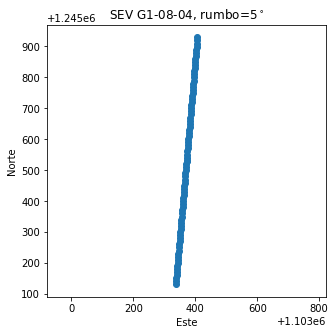

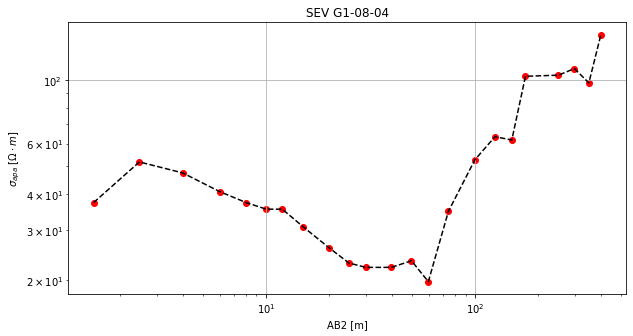

In [18]:
#@title SEV
#crear una grilla para el 2D...la distancia de falla será constante
#para facilitar algunos calculos
X_SEV = SEVanalizar['CoorX'].min() #centro X del SEV
Y_SEV = SEVanalizar['CoorY'].min() #centro Y del SEV
Z_SEV = SEVanalizar['Cota'].min() #centro Z del SEV
AB2 = SEVanalizar['AB2'].max() #longitud del centro a un extremo del SEV


parte_positiva = np.arange(0, AB2+espaciado, espaciado)
parte_negativa = -1 * np.arange(1, AB2+espaciado, espaciado)
#print(parte_positiva)
#print(parte_negativa)
longSEV = np.concatenate([parte_negativa, parte_positiva]) #concateno la parte positiva con la negativa
#se crea todo desde la coordenada (0,0) como centro
cooX_SEV = longSEV
cooY_SEV = np.zeros(len(longSEV))
cooZ_SEV = np.ones(len(longSEV)) * Z_SEV

'''
#plot superficie
plt.figure(figsize=(5,5))
plt.scatter(cooX_SEV, cooY_SEV)
plt.xlabel('Este')
plt.ylabel('Norte')
plt.show()
print('\n')
'''

#rotar los ejes
rumbo = -90 + SEVanalizar['Rumbo'].min() #en grados
cooX_SEVr = cooX_SEV * np.cos((rumbo * np.pi)/180) +  cooY_SEV * np.sin((rumbo * np.pi)/180) #X rotado
cooY_SEVr = -1 * cooX_SEV * np.sin((rumbo * np.pi)/180) +  cooY_SEV * np.cos((rumbo * np.pi)/180) #Y rotado

#plot superficie rotada
plt.figure(figsize=(5,5))
plt.scatter(cooX_SEVr + X_SEV, cooY_SEVr + Y_SEV)
plt.xlabel('Este')
plt.ylabel('Norte')
plt.axis('equal')
plt.title(('SEV {}, rumbo={}$^\circ $').format(SEVinteres, SEVanalizar['Rumbo'].min()))
plt.show()
print('\n')

#plot rho aparente y AB2
plt.figure(figsize=(10,5))
plt.plot(SEVanalizar['AB2'], SEVanalizar['Resistividad'], 'k--')
plt.scatter(SEVanalizar['AB2'], SEVanalizar['Resistividad'], c='r')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('AB2 [m]')
plt.ylabel('$\sigma_{apa}$ [$\Omega \cdot m$]')
plt.grid()
plt.title(('SEV {}').format(SEVinteres))
plt.show()
print('\n')


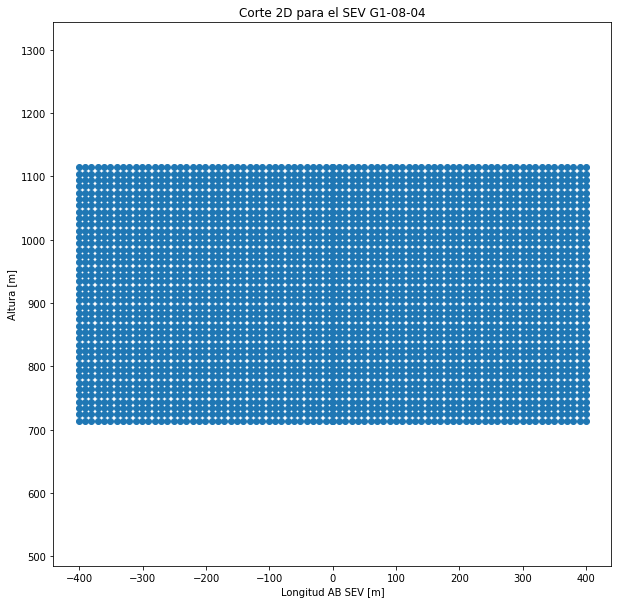

In [19]:
#@title Crear 2D del SEV
x2D = []
y2D = []
z2D = []
AB2D = []
for i in range(len(longSEV)):
  for j in range(len(parte_positiva)):
    x2D.append(longSEV[i])
    y2D.append(0)
    z2D.append( (-1 * parte_positiva[j]) + Z_SEV)
    AB2D.append(longSEV[i])
x2D = np.array(x2D)
y2D = np.array(y2D)
z2D = np.array(z2D)
AB2D = np.array(AB2D)
#plot 2D
plt.figure(figsize=(10,10))
plt.scatter(x2D, z2D)
plt.xlabel('Longitud AB SEV [m]')
plt.ylabel('Altura [m]')
plt.axis('equal')
plt.title(('Corte 2D para el SEV {}').format(SEVinteres))
plt.show()


#rotar los valores de X y Y
x2D_r = x2D * np.cos((rumbo * np.pi)/180) +  y2D * np.sin((rumbo * np.pi)/180) #X rotado
y2D_r = -1 * x2D * np.sin((rumbo * np.pi)/180) +  y2D * np.cos((rumbo * np.pi)/180) #Y rotado

x2D_r2 = x2D_r + X_SEV
y2D_r2 = y2D_r + Y_SEV
z2D_r2 = z2D
distFault_r2 = np.ones(len(z2D)) * SEVanalizar['DisFalla'].min()

#crear DataFrame con las coordenadas del SEV
dfSEV = pd.DataFrame(list(zip(AB2D, x2D_r2, y2D_r2, z2D_r2, distFault_r2)),
                          columns =['AB', 'X_2D', 'Y_2D', 'Z_2D', 'DistFault_2D'])
dfSEVinteres = dfSEV.copy() #copia con la que se va a trabajar

In [20]:
dfSEVinteres.head() #en este DataFrame esta guardado el SEV de interes

,AB,X_2D,Y_2D,Z_2D,DistFault_2D
0,-1.0,1.103372e+06,1.245530e+06,1114.0,114.779471
1,-1.0,1.103372e+06,1.245530e+06,1104.0,114.779471
2,-1.0,1.103372e+06,1.245530e+06,1094.0,114.779471
3,-1.0,1.103372e+06,1.245530e+06,1084.0,114.779471
4,-1.0,1.103372e+06,1.245530e+06,1074.0,114.779471


##Mapa Mesa de Los Santos (Puntos)

In [14]:
#cargar los puntos sobre las fallas y poder calcular mejor la distancia a las
#fallas de cada punto 
rutaPuntosFallas = '/content/drive/MyDrive/LosSantos/puntosSobreFallas.csv'
df_PuntosFallas = pd.read_csv(rutaPuntosFallas, sep=',', decimal='.')
df_PuntosFallas.head()


,fid,DEM_mesa_r,CoorX,CoorY
0,1,1268.019653,1.106547e+06,1.239542e+06
1,2,1268.019653,1.106546e+06,1.239543e+06
2,3,1268.019653,1.106546e+06,1.239544e+06
3,4,1268.019653,1.106545e+06,1.239544e+06
4,5,1268.019653,1.106545e+06,1.239545e+06


In [15]:
dfMapaSup = pd.read_csv('/content/drive/MyDrive/LosSantos/geo_mapa_sup.csv')
dfMapaSup.columns = ['coorX', 'coorY', 'coorZ', 'distFault', 'Unidad']
dfMapaSup.head()

,coorX,coorY,coorZ,distFault,Unidad
0,1109036.77,1259898.34,1284.0,48.86,K1ls_mi
1,1109136.77,1259898.34,1309.0,99.65,K1ls_mi
2,1109236.77,1259898.34,1317.0,163.49,K1ls_mi
3,1109336.77,1259898.34,1330.0,250.61,K1ls_mi
4,1109436.77,1259898.34,1350.0,344.79,K1ls_mi


In [16]:
#@title Codigo unidades map. sup
dfMapaSup['colorUnidad'] = dfMapaSup['Unidad'].replace({'J1-2j': 'tab:cyan',
                                                        'J1gp': 'tab:pink',
                                                        'K1ls_mi': 'tab:green',
                                                        'K1ls_mm': 'lime',
                                                        'K1ls_ms': 'yellow',
                                                        'K1p': 'tab:olive',
                                                        'K1r': 'tab:brown',
                                                        'K1t': 'tab:orange',
                                                        'OSs': 'tab:purple'})
dfMapaSup['codigoUnidad'] = dfMapaSup['Unidad'].replace({'OSs':0, #silgara
                                                         'J1gp':1, #granito
                                                         'J1-2j':2, #jordan
                                                         'K1ls_mi':3, #santos inf
                                                         'K1ls_mm':4, #santos med
                                                         'K1ls_ms':5, #santo sup
                                                         'K1r':6, #rosablanca
                                                         'K1p':7, #paja
                                                         'K1t':8}) #tablazo 

dfMapaSup.head()

,coorX,coorY,coorZ,distFault,Unidad,colorUnidad,codigoUnidad
0,1109036.77,1259898.34,1284.0,48.86,K1ls_mi,tab:green,3
1,1109136.77,1259898.34,1309.0,99.65,K1ls_mi,tab:green,3
2,1109236.77,1259898.34,1317.0,163.49,K1ls_mi,tab:green,3
3,1109336.77,1259898.34,1330.0,250.61,K1ls_mi,tab:green,3
4,1109436.77,1259898.34,1350.0,344.79,K1ls_mi,tab:green,3


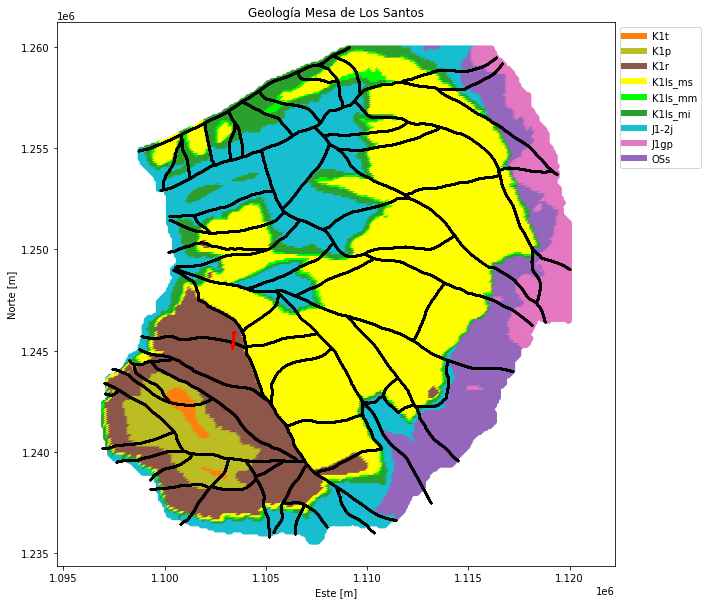

In [ ]:
plt.figure(figsize=(10,10))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], c=dfMapaSup['colorUnidad'])
plt.legend(custom_lines, labels_unidad, bbox_to_anchor=(1, 1))

plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.3)
plt.scatter(dfSEVinteres['X_2D'], dfSEVinteres['Y_2D'], c='r', s=1)
plt.axis('equal')
plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
plt.title('Geología Mesa de Los Santos')
plt.show()

In [ ]:
#recalculo las nuevas distancias para cada punto de la grilla
if AjustarDistFault == True:
  for i in range(0, len(dfSEVinteres['X_2D'])):
    dif_X = dfSEVinteres['X_2D'][i] - df_PuntosFallas['CoorX']
    dif_Y = dfSEVinteres['Y_2D'][i] - df_PuntosFallas['CoorY']
    distancia = np.sqrt(dif_X**2 + dif_Y**2)
    dfSEVinteres['DistFault_2D'][i] = np.min(distancia)

print(dfSEVinteres['DistFault_2D'].unique())
dfSEVinteres.head()

[113.82530574 104.14281789  94.45831811  84.77610737  75.09133049
  65.40956097  55.72434288  46.04338576  36.35735529  26.67839007
  16.99036776   7.32393617   2.37662156  12.07015754  21.74360787
  31.43082954  41.11059543  50.79631687  60.47758303  70.16263242
  79.84457065  89.52923874  99.21155827 108.8959807  118.5785459
 128.26279684 137.94553352 147.62965798 157.31252115 166.99654846
 176.67950879 186.36345912 196.04649641 205.73038428 215.41348404
 225.09732019 234.78047167 244.4642643  254.1474593  263.83121479
 273.51444693 114.7938296  124.47749819 134.16077709 143.84445273
 153.52773471 163.21141513 172.89469906 182.57838288 192.26166809
 201.94535445 211.62864053 221.31232882 230.99561551 240.67930533
 250.36259246 260.0462835  269.72957094 279.41326297 289.09655063
 298.78024351 308.46353134 318.14722491 327.83051286 337.51420702
 347.19749506 356.88118974 366.56447783 376.24817295 385.9314611
 395.61515661 405.29844477 414.98214063 418.38024637 413.43363916
 408.4872655

,AB,X_2D,Y_2D,Z_2D,DistFault_2D
0,-1.0,1.103372e+06,1.245530e+06,1114.0,113.825306
1,-1.0,1.103372e+06,1.245530e+06,1104.0,113.825306
2,-1.0,1.103372e+06,1.245530e+06,1094.0,113.825306
3,-1.0,1.103372e+06,1.245530e+06,1084.0,113.825306
4,-1.0,1.103372e+06,1.245530e+06,1074.0,113.825306


#Redes neuronales

In [69]:
#Cargar redes Neuronales
'''
#red geologia
mlp_geo = joblib.load('/content/drive/MyDrive/LosSantos/NN/red_geoMesa4_85.pkl')
#red porosidad
mlp_poro = joblib.load('/content/drive/MyDrive/LosSantos/NN/red_porosidad_87.pkl')
#red densidad
mlp_dens = joblib.load('/content/drive/MyDrive/LosSantos/NN/red_densidad_86.pkl')
#red rhoDry...regresa exponente escala log
mlp_rDry = joblib.load('/content/drive/MyDrive/LosSantos/NN/red_rhoDry_92.pkl')
#red rhoWet...regresa exponente escala log
mlp_rWet = joblib.load('/content/drive/MyDrive/LosSantos/NN/red_rhoWet_89.pkl')
#red cargDry
mlp_cDry = joblib.load('/content/drive/MyDrive/LosSantos/NN/red_cargDry_92.pkl')
#red cargWet
mlp_cWet = joblib.load('/content/drive/MyDrive/LosSantos/NN/red_cargWet_81.pkl')
#red Vp...regresa exponente escala log
mlp_Vp = joblib.load('/content/drive/MyDrive/LosSantos/NN/red_Vp_77.pkl')
#red Is50
mlp_Is50 = joblib.load('/content/drive/MyDrive/LosSantos/NN/red_Is50_86.pkl')
#red peak Load
mlp_pLoad = joblib.load('/content/drive/MyDrive/LosSantos/NN/red_peakLoad_91.pkl')
'''

#las nuevas
#red geologia
mlp_geo = joblib.load('/content/drive/MyDrive/LosSantos/NN/Nuevas1/red_geoMesa91.pkl')
#red porosidad
mlp_poro = joblib.load('/content/drive/MyDrive/LosSantos/NN/Nuevas1/red_porosidad_90.pkl')
#red densidad
mlp_dens = joblib.load('/content/drive/MyDrive/LosSantos/NN/Nuevas1/red_densidad_79.pkl')
#red rhoDry...regresa exponente escala log
mlp_rDry = joblib.load('/content/drive/MyDrive/LosSantos/NN/Nuevas1/red_rhoDry_93.pkl')
#red rhoWet...regresa exponente escala log
mlp_rWet = joblib.load('/content/drive/MyDrive/LosSantos/NN/Nuevas1/red_rhoWet_90.pkl')
#red cargDry
mlp_cDry = joblib.load('/content/drive/MyDrive/LosSantos/NN/Nuevas1/red_cargDry_924.pkl')
#red cargWet
mlp_cWet = joblib.load('/content/drive/MyDrive/LosSantos/NN/Nuevas1/red_cargWet_91.pkl')
#red Vp...regresa exponente escala log
mlp_Vp = joblib.load('/content/drive/MyDrive/LosSantos/NN/Nuevas1/red_Vp_53.pkl')
#red Is50
mlp_Is50 = joblib.load('/content/drive/MyDrive/LosSantos/NN/Nuevas1/red_Is50__91.pkl')
#red peak Load
mlp_pLoad = joblib.load('/content/drive/MyDrive/LosSantos/NN/Nuevas1/red_peakLoad_90.pkl')


"\n\n#las nuevas\n#red geologia\nmlp_geo = joblib.load('/content/drive/MyDrive/LosSantos/NN/Nuevas1/red_geoMesa91.pkl')\n#red porosidad\nmlp_poro = joblib.load('/content/drive/MyDrive/LosSantos/NN/Nuevas1/red_porosidad_90.pkl')\n#red densidad\nmlp_dens = joblib.load('/content/drive/MyDrive/LosSantos/NN/Nuevas1/red_densidad_79.pkl')\n#red rhoDry...regresa exponente escala log\nmlp_rDry = joblib.load('/content/drive/MyDrive/LosSantos/NN/Nuevas1/red_rhoDry_93.pkl')\n#red rhoWet...regresa exponente escala log\nmlp_rWet = joblib.load('/content/drive/MyDrive/LosSantos/NN/Nuevas1/red_rhoWet_90.pkl')\n#red cargDry\nmlp_cDry = joblib.load('/content/drive/MyDrive/LosSantos/NN/Nuevas1/red_cargDry_924.pkl')\n#red cargWet\nmlp_cWet = joblib.load('/content/drive/MyDrive/LosSantos/NN/Nuevas1/red_cargWet_91.pkl')\n#red Vp...regresa exponente escala log\nmlp_Vp = joblib.load('/content/drive/MyDrive/LosSantos/NN/Nuevas1/red_Vp_53.pkl')\n#red Is50\nmlp_Is50 = joblib.load('/content/drive/MyDrive/LosSantos

In [21]:
#@title Normalizo valores para predecir los SEVs
'''
#se deben estandarizar al mismo rango con el que la entrené
dfSEVinteres['X_norm'] = (dfSEVinteres['X_2D'] - 1171611) / 185926.90
dfSEVinteres['Y_norm'] = (dfSEVinteres['Y_2D'] - 1272689) / 74772.29
dfSEVinteres['Z_norm'] = (dfSEVinteres['Z_2D'] - 1071.45) / 465.95
dfSEVinteres['Df_norm'] = (dfSEVinteres['DistFault_2D'] - 376.26) / 317.57
'''
#para las nuevas
dfSEVinteres['X_norm'] = (dfSEVinteres['X_2D'] - 1096700) / (1120100 - 1096700) 
dfSEVinteres['Y_norm'] = (dfSEVinteres['Y_2D'] - 1235500) / (1260100 - 1235500)
dfSEVinteres['Z_norm'] = (dfSEVinteres['Z_2D'] - (-150)) / (1830 - (-150))
dfSEVinteres['Df_norm'] = (dfSEVinteres['DistFault_2D'] - (000)) / (3000 - (000))


In [27]:
#predecir geologia del SEV
dfSEVinteres['Geologia'] = mlp_geo.predict(dfSEVinteres[['X_norm', 'Y_norm', 'Z_norm']])
dfSEVinteres['Geologia']

0       6
1       6
2       6
3       6
4       6
       ..
3357    0
3358    0
3359    0
3360    0
3361    0
Name: Geologia, Length: 3362, dtype: int64

In [28]:
#@title Colores para la geologia
NNgeo_color = {0:'tab:purple', #OSs
               1:'tab:pink', #J1gp
               2:'tab:cyan', #J1-2j
               3:'tab:green', #K1ls_mi
               4:'lime', #K1ls_mm
               5:'yellow', #K1ls_ms
               6:'tab:brown', #K1r
               7:'tab:olive', #K1p
               8:'tab:orange'} #K1t
dfSEVinteres['ColorGeo'] = dfSEVinteres['Geologia'].replace(NNgeo_color)

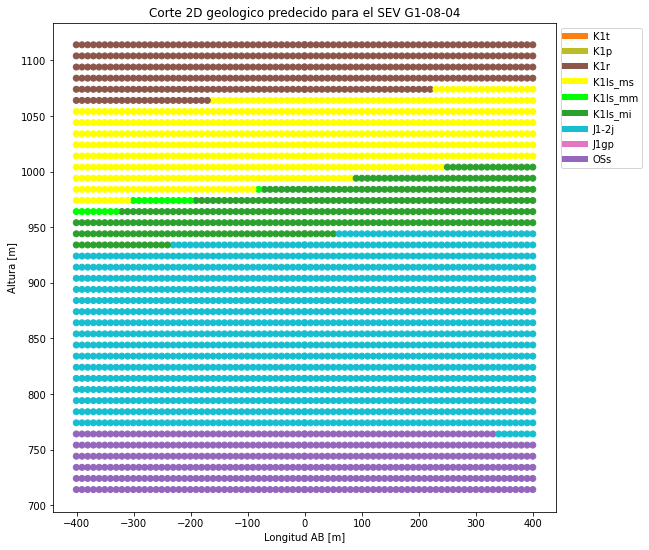

In [ ]:
#@title Corte 2D geologico predecido 
#plot 2D
plt.figure(figsize=(9,9))
plt.scatter(dfSEVinteres['AB'], dfSEVinteres['Z_2D'], c=dfSEVinteres['ColorGeo'])
plt.xlabel('Longitud AB [m]')
plt.ylabel('Altura [m]')
#plt.axis('equal')
plt.title(('Corte 2D geologico predecido para el SEV {}').format(SEVinteres))
plt.legend(custom_lines, labels_unidad, bbox_to_anchor=(1, 1))#, loc=2)
plt.show()

##Propiedades fisicas 

Se presentan los resultados para los valores predichos originales, y unos con el sufijo de **ajustado** que es simplemente sesgar los resultados a los obtenidos en el laboratorio, ya que en algunas pruebas realizadas se obtenían valores que los superaban. 

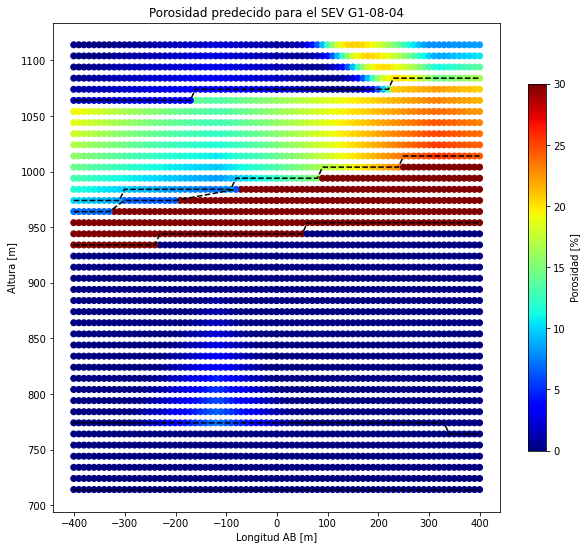

In [ ]:
#@title Predecir porosidad
dfSEVinteres['Porosidad'] = mlp_poro.predict(dfSEVinteres[['X_norm', 'Y_norm', 'Z_norm', 'Df_norm', 'Geologia']])
#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfSEVinteres['AB'], dfSEVinteres['Z_2D'], 
            c=dfSEVinteres['Porosidad'], cmap='jet',
            norm=colors.Normalize(vmin=0, vmax=30))

#limites geologicos
for i in dfSEVinteres['Geologia'].unique():
  x = []
  y = []
  fil_geo = dfSEVinteres['Geologia'] == i
  for_geo = dfSEVinteres[fil_geo]
  for j in for_geo['AB'].unique():
    fil_Ab = for_geo['AB'] == j
    x.append(j)
    y.append((for_geo['Z_2D'][fil_Ab]).min()) 
    df = pd.DataFrame(list(zip(x, y)), columns=['x', 'y'])
    df2 = df.sort_values(by=['x'])
  plt.plot(df2['x'], df2['y'], 'k--')



plt.xlabel('Longitud AB [m]')
plt.ylabel('Altura [m]')
plt.title(('Porosidad predecido para el SEV {}').format(SEVinteres))
plt.colorbar(shrink=0.75, label='Porosidad [%]')
plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


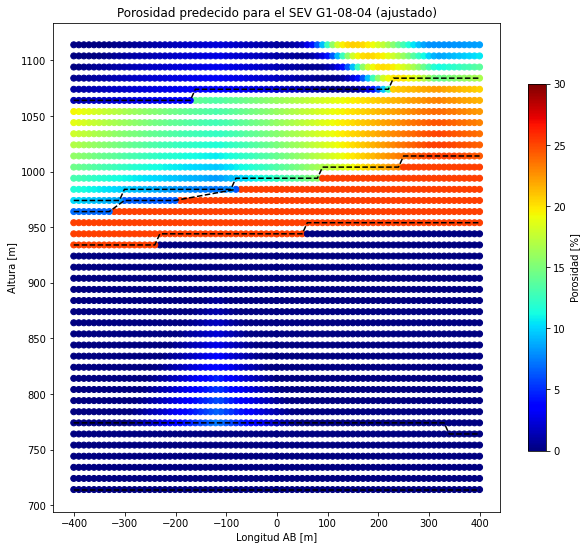

In [ ]:
#@title Predecir porosidad ajustado
dfSEVinteres['Porosidad_c'] = dfSEVinteres['Porosidad']
fil_min = dfSEVinteres['Porosidad_c'] < petrofisica['Porosidad'].min()
dfSEVinteres['Porosidad_c'][fil_min] = petrofisica['Porosidad'].min()
fil_max = dfSEVinteres['Porosidad_c'] > petrofisica['Porosidad'].max()
dfSEVinteres['Porosidad_c'][fil_max] = petrofisica['Porosidad'].max()

#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfSEVinteres['AB'], dfSEVinteres['Z_2D'], 
            c=dfSEVinteres['Porosidad_c'], cmap='jet',
            norm=colors.Normalize(vmin=0, vmax=30))

#limites geologicos
for i in dfSEVinteres['Geologia'].unique():
  x = []
  y = []
  fil_geo = dfSEVinteres['Geologia'] == i
  for_geo = dfSEVinteres[fil_geo]
  for j in for_geo['AB'].unique():
    fil_Ab = for_geo['AB'] == j
    x.append(j)
    y.append((for_geo['Z_2D'][fil_Ab]).min()) 
    df = pd.DataFrame(list(zip(x, y)), columns=['x', 'y'])
    df2 = df.sort_values(by=['x'])
  plt.plot(df2['x'], df2['y'], 'k--')



plt.xlabel('Longitud AB [m]')
plt.ylabel('Altura [m]')
plt.title(('Porosidad predecido para el SEV {} (ajustado)').format(SEVinteres))
plt.colorbar(shrink=0.75, label='Porosidad [%]')

if savePlot == True:
  plt.savefig(('/content/drive/MyDrive/LosSantos/FigurasSEVs/{}porosidad.png').format(SEVinteres),
              format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)

plt.show()


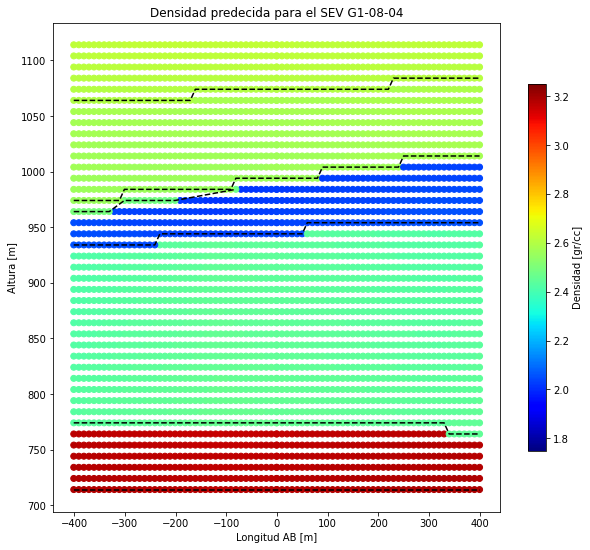

In [ ]:
#@title Predecir densidad
dfSEVinteres['Densidad'] = mlp_dens.predict(dfSEVinteres[['X_norm', 'Y_norm', 'Z_norm', 'Df_norm', 'Geologia']])
#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfSEVinteres['AB'], dfSEVinteres['Z_2D'], 
            c=dfSEVinteres['Densidad'], cmap='jet',
            norm=colors.Normalize(vmin=1.75, vmax=3.25))

#limites geologicos
for i in dfSEVinteres['Geologia'].unique():
  x = []
  y = []
  fil_geo = dfSEVinteres['Geologia'] == i
  for_geo = dfSEVinteres[fil_geo]
  for j in for_geo['AB'].unique():
    fil_Ab = for_geo['AB'] == j
    x.append(j)
    y.append((for_geo['Z_2D'][fil_Ab]).min()) 
    df = pd.DataFrame(list(zip(x, y)), columns=['x', 'y'])
    df2 = df.sort_values(by=['x'])
  plt.plot(df2['x'], df2['y'], 'k--')


plt.xlabel('Longitud AB [m]')
plt.ylabel('Altura [m]')
#plt.axis('equal')
plt.title(('Densidad predecida para el SEV {}').format(SEVinteres))
plt.colorbar(shrink=0.75, label='Densidad [gr/cc]')
plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


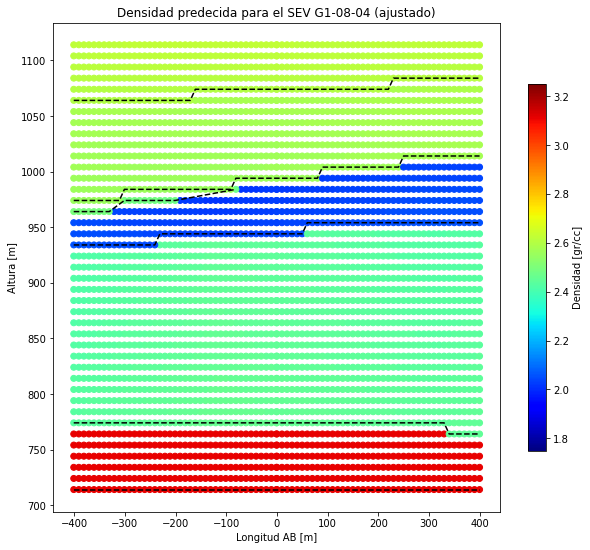

In [ ]:
#@title Predecir densidad ajustado
dfSEVinteres['Densidad_c'] = dfSEVinteres['Densidad']
fil_min = dfSEVinteres['Densidad_c'] < petrofisica['Densidad'].min()
dfSEVinteres['Densidad_c'][fil_min] = petrofisica['Densidad'].min()
fil_max = dfSEVinteres['Densidad_c'] > petrofisica['Densidad'].max()
dfSEVinteres['Densidad_c'][fil_max] = petrofisica['Densidad'].max()

#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfSEVinteres['AB'], dfSEVinteres['Z_2D'], 
            c=dfSEVinteres['Densidad_c'], cmap='jet',
            norm=colors.Normalize(vmin=1.75, vmax=3.25))

#limites geologicos
for i in dfSEVinteres['Geologia'].unique():
  x = []
  y = []
  fil_geo = dfSEVinteres['Geologia'] == i
  for_geo = dfSEVinteres[fil_geo]
  for j in for_geo['AB'].unique():
    fil_Ab = for_geo['AB'] == j
    x.append(j)
    y.append((for_geo['Z_2D'][fil_Ab]).min()) 
    df = pd.DataFrame(list(zip(x, y)), columns=['x', 'y'])
    df2 = df.sort_values(by=['x'])
  plt.plot(df2['x'], df2['y'], 'k--')


plt.xlabel('Longitud AB [m]')
plt.ylabel('Altura [m]')
#plt.axis('equal')
plt.title(('Densidad predecida para el SEV {} (ajustado)').format(SEVinteres))
plt.colorbar(shrink=0.75, label='Densidad [gr/cc]')

if savePlot == True:
  plt.savefig(('/content/drive/MyDrive/LosSantos/FigurasSEVs/{}densidad.png').format(SEVinteres),
              format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)

plt.show()


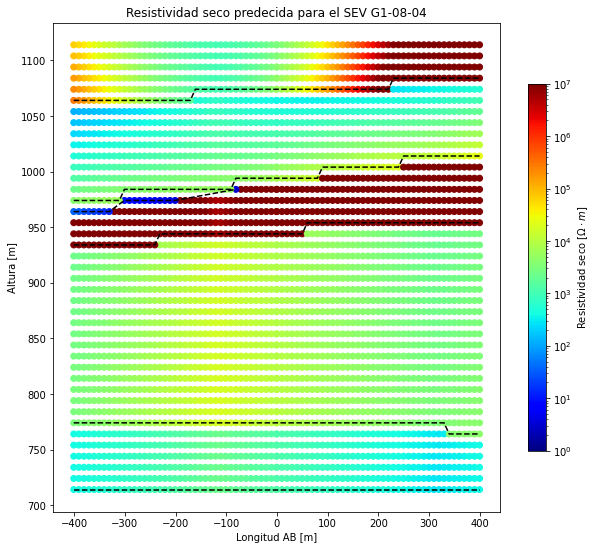

In [ ]:
#@title Predecir rhoDry
dfSEVinteres['rhoDry'] = mlp_rDry.predict(dfSEVinteres[['X_norm', 'Y_norm', 'Z_norm', 'Df_norm', 'Geologia']])
#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfSEVinteres['AB'], dfSEVinteres['Z_2D'], 
            c=10**dfSEVinteres['rhoDry'], cmap='jet',
            norm=colors.LogNorm(vmin=10**0, vmax=10**7))

#limites geologicos
for i in dfSEVinteres['Geologia'].unique():
  x = []
  y = []
  fil_geo = dfSEVinteres['Geologia'] == i
  for_geo = dfSEVinteres[fil_geo]
  for j in for_geo['AB'].unique():
    fil_Ab = for_geo['AB'] == j
    x.append(j)
    y.append((for_geo['Z_2D'][fil_Ab]).min()) 
    df = pd.DataFrame(list(zip(x, y)), columns=['x', 'y'])
    df2 = df.sort_values(by=['x'])
  plt.plot(df2['x'], df2['y'], 'k--')


plt.xlabel('Longitud AB [m]')
plt.ylabel('Altura [m]')
#plt.axis('equal')
plt.title(('Resistividad seco predecida para el SEV {}').format(SEVinteres))
plt.colorbar(shrink=0.75, label='Resistividad seco [$\Omega \cdot m$]')
plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


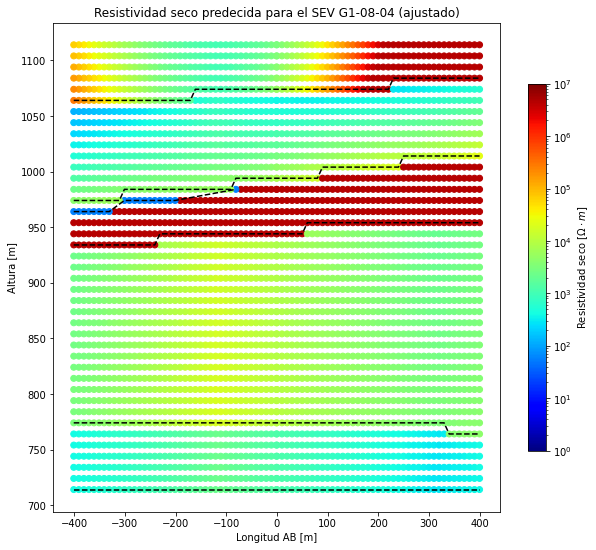

In [ ]:
#@title Predecir rhoDry ajustado
dfSEVinteres['rhoDry_c'] = dfSEVinteres['rhoDry']
fil_min = dfSEVinteres['rhoDry_c'] < np.log10(petrofisica['RhoDry'].min())
dfSEVinteres['rhoDry_c'][fil_min] = np.log10(petrofisica['RhoDry'].min())
fil_max = dfSEVinteres['rhoDry_c'] > np.log10(petrofisica['RhoDry'].max())
dfSEVinteres['rhoDry_c'][fil_max] = np.log10(petrofisica['RhoDry'].max())

#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfSEVinteres['AB'], dfSEVinteres['Z_2D'], 
            c=10**dfSEVinteres['rhoDry_c'], cmap='jet',
            norm=colors.LogNorm(vmin=10**0, vmax=10**7))

#limites geologicos
for i in dfSEVinteres['Geologia'].unique():
  x = []
  y = []
  fil_geo = dfSEVinteres['Geologia'] == i
  for_geo = dfSEVinteres[fil_geo]
  for j in for_geo['AB'].unique():
    fil_Ab = for_geo['AB'] == j
    x.append(j)
    y.append((for_geo['Z_2D'][fil_Ab]).min()) 
    df = pd.DataFrame(list(zip(x, y)), columns=['x', 'y'])
    df2 = df.sort_values(by=['x'])
  plt.plot(df2['x'], df2['y'], 'k--')


plt.xlabel('Longitud AB [m]')
plt.ylabel('Altura [m]')
#plt.axis('equal')
plt.title(('Resistividad seco predecida para el SEV {} (ajustado)').format(SEVinteres))
plt.colorbar(shrink=0.75, label='Resistividad seco [$\Omega \cdot m$]')

if savePlot == True:
  plt.savefig(('/content/drive/MyDrive/LosSantos/FigurasSEVs/{}rhoDry.png').format(SEVinteres),
              format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
plt.show()


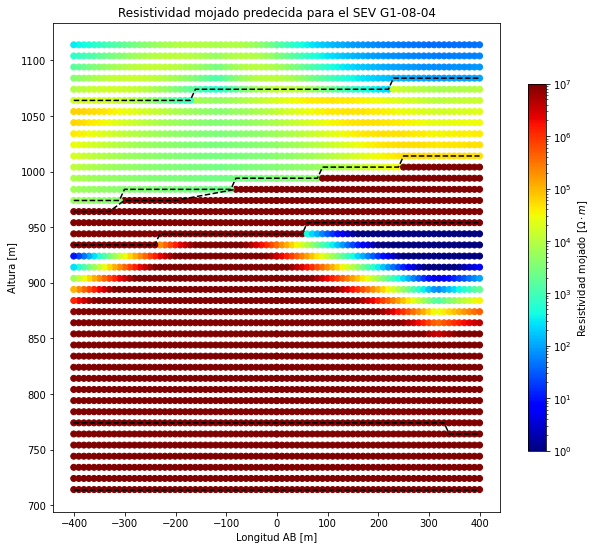

In [ ]:
#@title Predecir rhoWet
dfSEVinteres['rhoWet'] = mlp_rWet.predict(dfSEVinteres[['X_norm', 'Y_norm', 'Z_norm', 'Df_norm', 'Geologia']])
#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfSEVinteres['AB'], dfSEVinteres['Z_2D'], 
            c=10**dfSEVinteres['rhoWet'], cmap='jet',
            norm=colors.LogNorm(vmin=10**0, vmax=10**7))

#limites geologicos
for i in dfSEVinteres['Geologia'].unique():
  x = []
  y = []
  fil_geo = dfSEVinteres['Geologia'] == i
  for_geo = dfSEVinteres[fil_geo]
  for j in for_geo['AB'].unique():
    fil_Ab = for_geo['AB'] == j
    x.append(j)
    y.append((for_geo['Z_2D'][fil_Ab]).min()) 
    df = pd.DataFrame(list(zip(x, y)), columns=['x', 'y'])
    df2 = df.sort_values(by=['x'])
  plt.plot(df2['x'], df2['y'], 'k--')


plt.xlabel('Longitud AB [m]')
plt.ylabel('Altura [m]')
#plt.axis('equal')
plt.title(('Resistividad mojado predecida para el SEV {}').format(SEVinteres))
plt.colorbar(shrink=0.75, label='Resistividad mojado [$\Omega \cdot m$]')
plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


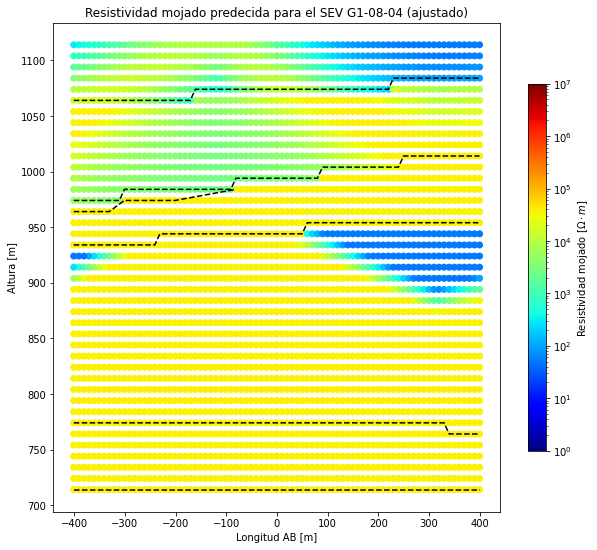

In [ ]:
#@title Predecir rhoWet ajustado
dfSEVinteres['rhoWet_c'] = dfSEVinteres['rhoWet']
fil_min = dfSEVinteres['rhoWet_c'] < np.log10(petrofisica['RhoWet'].min())
dfSEVinteres['rhoWet_c'][fil_min] = np.log10(petrofisica['RhoWet'].min())
fil_max = dfSEVinteres['rhoWet_c'] > np.log10(petrofisica['RhoWet'].max())
dfSEVinteres['rhoWet_c'][fil_max] = np.log10(petrofisica['RhoWet'].max())

#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfSEVinteres['AB'], dfSEVinteres['Z_2D'], 
            c=10**dfSEVinteres['rhoWet_c'], cmap='jet',
            norm=colors.LogNorm(vmin=10**0, vmax=10**7))

#limites geologicos
for i in dfSEVinteres['Geologia'].unique():
  x = []
  y = []
  fil_geo = dfSEVinteres['Geologia'] == i
  for_geo = dfSEVinteres[fil_geo]
  for j in for_geo['AB'].unique():
    fil_Ab = for_geo['AB'] == j
    x.append(j)
    y.append((for_geo['Z_2D'][fil_Ab]).min()) 
    df = pd.DataFrame(list(zip(x, y)), columns=['x', 'y'])
    df2 = df.sort_values(by=['x'])
  plt.plot(df2['x'], df2['y'], 'k--')


plt.xlabel('Longitud AB [m]')
plt.ylabel('Altura [m]')
#plt.axis('equal')
plt.title(('Resistividad mojado predecida para el SEV {} (ajustado)').format(SEVinteres))
plt.colorbar(shrink=0.75, label='Resistividad mojado [$\Omega \cdot m$]')

if savePlot == True:
  plt.savefig(('/content/drive/MyDrive/LosSantos/FigurasSEVs/{}rhoWet.png').format(SEVinteres),
              format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
plt.show()


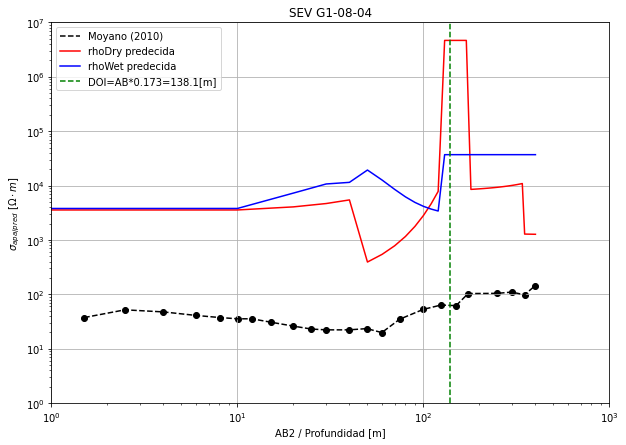

In [ ]:
#@title Resistividades

fil_SEV_rho = (dfSEVinteres['X_2D'] == X_SEV) & (dfSEVinteres['Y_2D'] == Y_SEV)
#plot rho aparente de Moyano mas los predecidos AJUSTADOS
# vs AB2 o profundidad
plt.figure(figsize=(10,7))
plt.plot(SEVanalizar['AB2'], SEVanalizar['Resistividad'], 'k--', label='Moyano (2010)')
plt.scatter(SEVanalizar['AB2'], SEVanalizar['Resistividad'], c='k')
plt.plot(Z_SEV - (dfSEVinteres['Z_2D'][fil_SEV_rho]),
            10**(dfSEVinteres['rhoDry_c'][fil_SEV_rho]),'r', label='rhoDry predecida')
plt.plot(Z_SEV - (dfSEVinteres['Z_2D'][fil_SEV_rho]),
            10**(dfSEVinteres['rhoWet_c'][fil_SEV_rho]),'b', label='rhoWet predecida')
plt.plot([DOI, DOI], [10**0, 10**7], 'g--',
         label=('DOI=AB*0.173={}[m]').format(np.round(DOI,1)))
plt.xscale('log')
plt.yscale('log')
plt.xlabel('AB2 / Profundidad [m]')
plt.ylabel('$\sigma_{apa/pred}$ [$\Omega \cdot m$]')
plt.ylim(10**0, 10**7)
plt.xlim(10**0, 10**3)
plt.grid()
plt.legend()
plt.title(('SEV {}').format(SEVinteres))
if savePlot == True:
  plt.savefig(('/content/drive/MyDrive/LosSantos/FigurasSEVs/{}resistividades.png').format(SEVinteres),
              format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
plt.show()
print('\n')

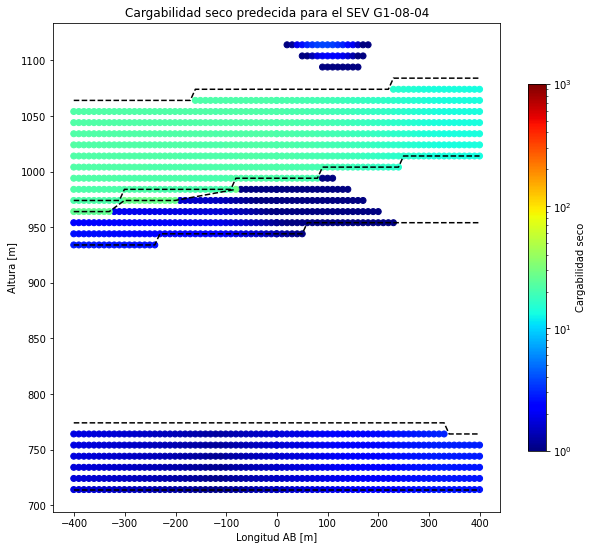

In [ ]:
#@title Predecir cargDry
dfSEVinteres['cargDry'] = mlp_cDry.predict(dfSEVinteres[['X_norm', 'Y_norm', 'Z_norm', 'Df_norm', 'Geologia']])
#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfSEVinteres['AB'], dfSEVinteres['Z_2D'], 
            c=dfSEVinteres['cargDry'], cmap='jet',
            norm=colors.LogNorm(vmin=10**0, vmax=10**3))

#limites geologicos
for i in dfSEVinteres['Geologia'].unique():
  x = []
  y = []
  fil_geo = dfSEVinteres['Geologia'] == i
  for_geo = dfSEVinteres[fil_geo]
  for j in for_geo['AB'].unique():
    fil_Ab = for_geo['AB'] == j
    x.append(j)
    y.append((for_geo['Z_2D'][fil_Ab]).min()) 
    df = pd.DataFrame(list(zip(x, y)), columns=['x', 'y'])
    df2 = df.sort_values(by=['x'])
  plt.plot(df2['x'], df2['y'], 'k--')


plt.xlabel('Longitud AB [m]')
plt.ylabel('Altura [m]')
#plt.axis('equal')
plt.title(('Cargabilidad seco predecida para el SEV {}').format(SEVinteres))
plt.colorbar(shrink=0.75, label='Cargabilidad seco')
plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


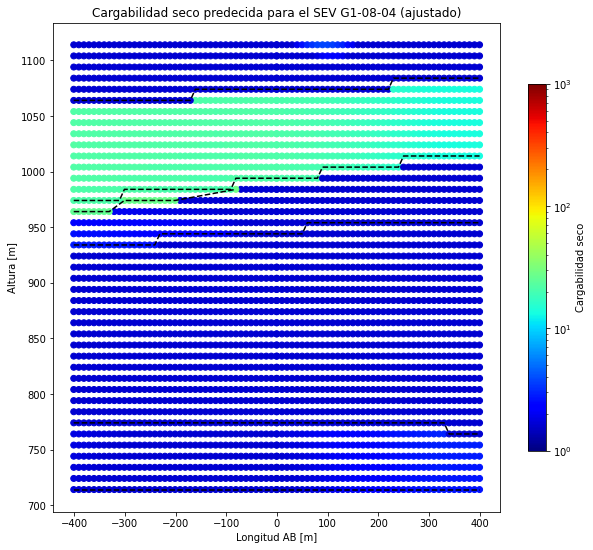

In [ ]:
#@title Predecir cargDry ajustado
dfSEVinteres['cargDry_c'] = dfSEVinteres['cargDry']
fil_min = dfSEVinteres['cargDry_c'] < petrofisica['CargDry'].min()
dfSEVinteres['cargDry_c'][fil_min] = petrofisica['CargDry'].min()
fil_max = dfSEVinteres['cargDry_c'] > petrofisica['CargDry'].max()
dfSEVinteres['cargDry_c'][fil_max] = petrofisica['CargDry'].max()

#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfSEVinteres['AB'], dfSEVinteres['Z_2D'], 
            c=dfSEVinteres['cargDry_c'], cmap='jet',
            norm=colors.LogNorm(vmin=10**0, vmax=10**3))

#limites geologicos
for i in dfSEVinteres['Geologia'].unique():
  x = []
  y = []
  fil_geo = dfSEVinteres['Geologia'] == i
  for_geo = dfSEVinteres[fil_geo]
  for j in for_geo['AB'].unique():
    fil_Ab = for_geo['AB'] == j
    x.append(j)
    y.append((for_geo['Z_2D'][fil_Ab]).min()) 
    df = pd.DataFrame(list(zip(x, y)), columns=['x', 'y'])
    df2 = df.sort_values(by=['x'])
  plt.plot(df2['x'], df2['y'], 'k--')


plt.xlabel('Longitud AB [m]')
plt.ylabel('Altura [m]')
#plt.axis('equal')
plt.title(('Cargabilidad seco predecida para el SEV {} (ajustado)').format(SEVinteres))
plt.colorbar(shrink=0.75, label='Cargabilidad seco')

if savePlot == True:
  plt.savefig(('/content/drive/MyDrive/LosSantos/FigurasSEVs/{}cargDry.png').format(SEVinteres),
              format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
plt.show()


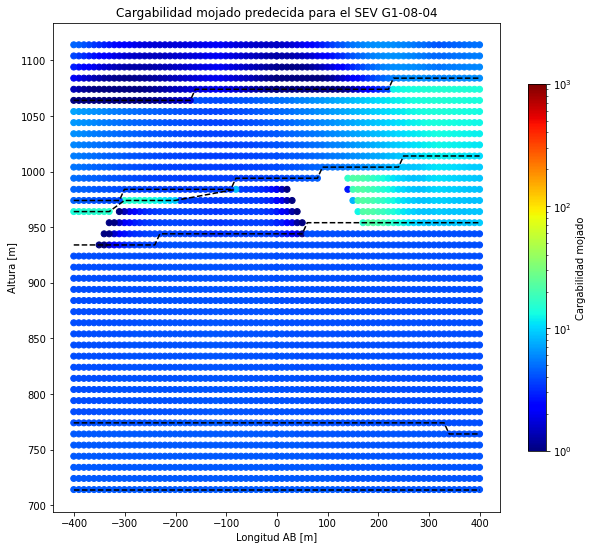

In [ ]:
#@title Predecir cargWet
dfSEVinteres['cargWet'] = mlp_cWet.predict(dfSEVinteres[['X_norm', 'Y_norm', 'Z_norm', 'Df_norm', 'Geologia']])
#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfSEVinteres['AB'], dfSEVinteres['Z_2D'], 
            c=dfSEVinteres['cargWet'], cmap='jet',
            norm=colors.LogNorm(vmin=10**0, vmax=10**3))

#limites geologicos
for i in dfSEVinteres['Geologia'].unique():
  x = []
  y = []
  fil_geo = dfSEVinteres['Geologia'] == i
  for_geo = dfSEVinteres[fil_geo]
  for j in for_geo['AB'].unique():
    fil_Ab = for_geo['AB'] == j
    x.append(j)
    y.append((for_geo['Z_2D'][fil_Ab]).min()) 
    df = pd.DataFrame(list(zip(x, y)), columns=['x', 'y'])
    df2 = df.sort_values(by=['x'])
  plt.plot(df2['x'], df2['y'], 'k--')


plt.xlabel('Longitud AB [m]')
plt.ylabel('Altura [m]')
#plt.axis('equal')
plt.title(('Cargabilidad mojado predecida para el SEV {}').format(SEVinteres))
plt.colorbar(shrink=0.75, label='Cargabilidad mojado')
plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


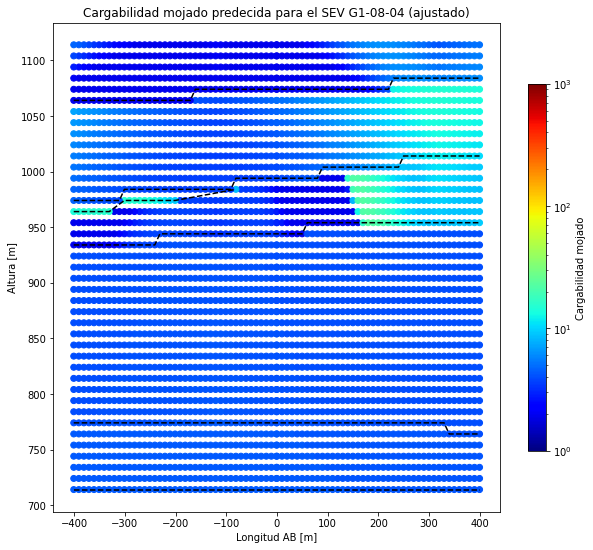

In [ ]:
#@title Predecir cargWet ajustado
dfSEVinteres['cargWet_c'] = dfSEVinteres['cargWet']
fil_min = dfSEVinteres['cargWet_c'] < petrofisica['CargWet'].min()
dfSEVinteres['cargWet_c'][fil_min] = petrofisica['CargWet'].min()
fil_max = dfSEVinteres['cargWet_c'] > petrofisica['CargWet'].max()
dfSEVinteres['cargWet_c'][fil_max] = petrofisica['CargWet'].max()

#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfSEVinteres['AB'], dfSEVinteres['Z_2D'], 
            c=dfSEVinteres['cargWet_c'], cmap='jet',
            norm=colors.LogNorm(vmin=10**0, vmax=10**3))

#limites geologicos
for i in dfSEVinteres['Geologia'].unique():
  x = []
  y = []
  fil_geo = dfSEVinteres['Geologia'] == i
  for_geo = dfSEVinteres[fil_geo]
  for j in for_geo['AB'].unique():
    fil_Ab = for_geo['AB'] == j
    x.append(j)
    y.append((for_geo['Z_2D'][fil_Ab]).min()) 
    df = pd.DataFrame(list(zip(x, y)), columns=['x', 'y'])
    df2 = df.sort_values(by=['x'])
  plt.plot(df2['x'], df2['y'], 'k--')


plt.xlabel('Longitud AB [m]')
plt.ylabel('Altura [m]')
#plt.axis('equal')
plt.title(('Cargabilidad mojado predecida para el SEV {} (ajustado)').format(SEVinteres))
plt.colorbar(shrink=0.75, label='Cargabilidad mojado')

if savePlot == True:
  plt.savefig(('/content/drive/MyDrive/LosSantos/FigurasSEVs/{}cargWet.png').format(SEVinteres),
              format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
plt.show()


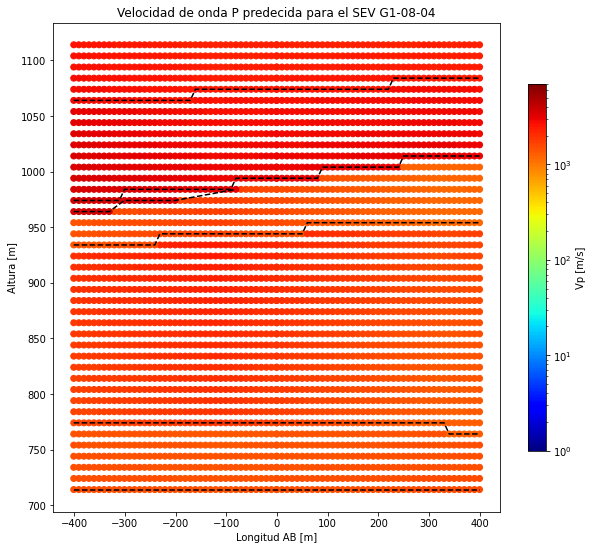

In [ ]:
#@title Predecir Vp
dfSEVinteres['Vp'] = mlp_Vp.predict(dfSEVinteres[['X_norm', 'Y_norm', 'Z_norm', 'Df_norm', 'Geologia']])
#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfSEVinteres['AB'], dfSEVinteres['Z_2D'], 
            c=10**dfSEVinteres['Vp'], cmap='jet',
            norm=colors.LogNorm(vmin=10**0, vmax=7*10**3))

#limites geologicos
for i in dfSEVinteres['Geologia'].unique():
  x = []
  y = []
  fil_geo = dfSEVinteres['Geologia'] == i
  for_geo = dfSEVinteres[fil_geo]
  for j in for_geo['AB'].unique():
    fil_Ab = for_geo['AB'] == j
    x.append(j)
    y.append((for_geo['Z_2D'][fil_Ab]).min()) 
    df = pd.DataFrame(list(zip(x, y)), columns=['x', 'y'])
    df2 = df.sort_values(by=['x'])
  plt.plot(df2['x'], df2['y'], 'k--')


plt.xlabel('Longitud AB [m]')
plt.ylabel('Altura [m]')
#plt.axis('equal')
plt.title(('Velocidad de onda P predecida para el SEV {}').format(SEVinteres))
plt.colorbar(shrink=0.75, label='Vp [m/s]')
plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


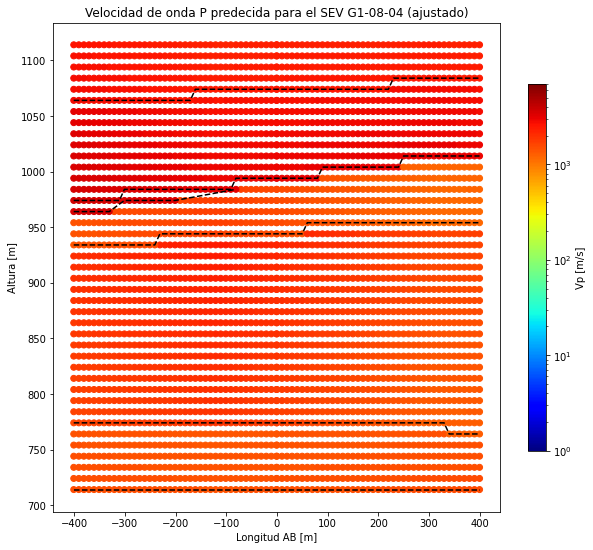

In [ ]:
#@title Predecir Vp ajustado
dfSEVinteres['Vp_c'] = dfSEVinteres['Vp']
fil_min = dfSEVinteres['Vp_c'] < np.log10(petrofisica['Vp'].min())
dfSEVinteres['Vp_c'][fil_min] = np.log10(petrofisica['Vp'].min())
fil_max = dfSEVinteres['Vp_c'] > np.log10(petrofisica['Vp'].max())
dfSEVinteres['Vp_c'][fil_max] = np.log10(petrofisica['Vp'].max())

#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfSEVinteres['AB'], dfSEVinteres['Z_2D'], 
            c=10**dfSEVinteres['Vp_c'], cmap='jet',
            norm=colors.LogNorm(vmin=10**0, vmax=7*10**3))

#limites geologicos
for i in dfSEVinteres['Geologia'].unique():
  x = []
  y = []
  fil_geo = dfSEVinteres['Geologia'] == i
  for_geo = dfSEVinteres[fil_geo]
  for j in for_geo['AB'].unique():
    fil_Ab = for_geo['AB'] == j
    x.append(j)
    y.append((for_geo['Z_2D'][fil_Ab]).min()) 
    df = pd.DataFrame(list(zip(x, y)), columns=['x', 'y'])
    df2 = df.sort_values(by=['x'])
  plt.plot(df2['x'], df2['y'], 'k--')


plt.xlabel('Longitud AB [m]')
plt.ylabel('Altura [m]')
#plt.axis('equal')
plt.title(('Velocidad de onda P predecida para el SEV {} (ajustado)').format(SEVinteres))
plt.colorbar(shrink=0.75, label='Vp [m/s]')

if savePlot == True:
  plt.savefig(('/content/drive/MyDrive/LosSantos/FigurasSEVs/{}Vp.png').format(SEVinteres),
              format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
plt.show()


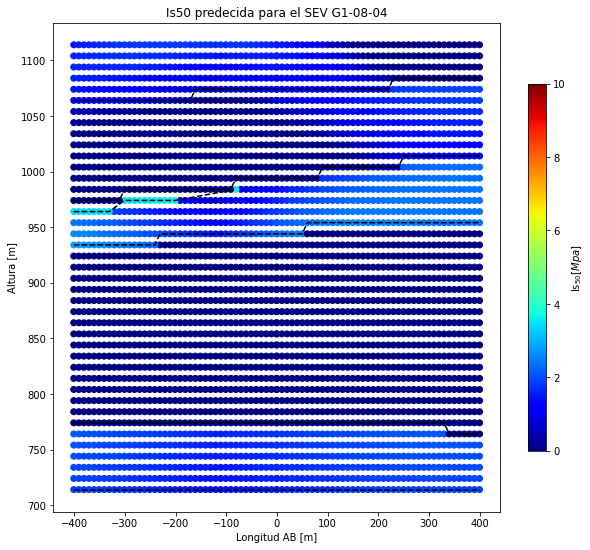

In [ ]:
#@title Predecir Is50
dfSEVinteres['Is50'] = mlp_Is50.predict(dfSEVinteres[['X_norm', 'Y_norm', 'Z_norm', 'Df_norm', 'Geologia']])
#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfSEVinteres['AB'], dfSEVinteres['Z_2D'], 
            c=dfSEVinteres['Is50'], cmap='jet',
            norm=colors.Normalize(vmin=0, vmax=10))

#limites geologicos
for i in dfSEVinteres['Geologia'].unique():
  x = []
  y = []
  fil_geo = dfSEVinteres['Geologia'] == i
  for_geo = dfSEVinteres[fil_geo]
  for j in for_geo['AB'].unique():
    fil_Ab = for_geo['AB'] == j
    x.append(j)
    y.append((for_geo['Z_2D'][fil_Ab]).min()) 
    df = pd.DataFrame(list(zip(x, y)), columns=['x', 'y'])
    df2 = df.sort_values(by=['x'])
  plt.plot(df2['x'], df2['y'], 'k--')


plt.xlabel('Longitud AB [m]')
plt.ylabel('Altura [m]')
#plt.axis('equal')
plt.title(('Is50 predecida para el SEV {}').format(SEVinteres))
plt.colorbar(shrink=0.75, label='Is$_{50} [Mpa]$')
plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


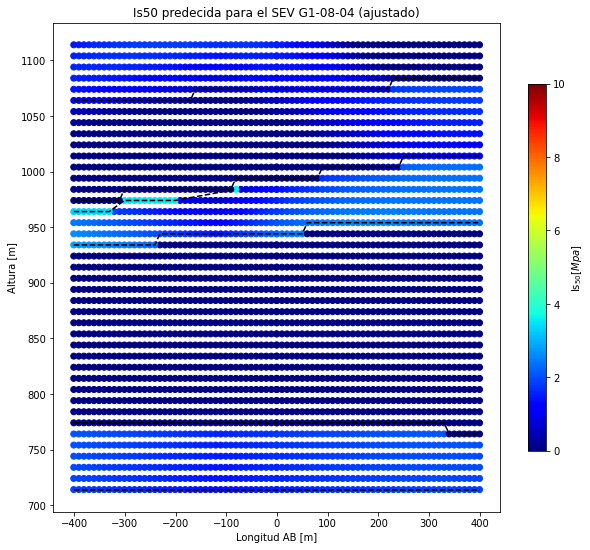

In [ ]:
#@title Predecir Is50 ajustado
dfSEVinteres['Is50_c'] = dfSEVinteres['Is50']
fil_min = dfSEVinteres['Is50_c'] < petrofisica['Is50'].min()
dfSEVinteres['Is50_c'][fil_min] = petrofisica['Is50'].min()
fil_max = dfSEVinteres['Is50_c'] > petrofisica['Is50'].max()
dfSEVinteres['Is50_c'][fil_max] = petrofisica['Is50'].max()

#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfSEVinteres['AB'], dfSEVinteres['Z_2D'], 
            c=dfSEVinteres['Is50_c'], cmap='jet',
            norm=colors.Normalize(vmin=0, vmax=10))

#limites geologicos
for i in dfSEVinteres['Geologia'].unique():
  x = []
  y = []
  fil_geo = dfSEVinteres['Geologia'] == i
  for_geo = dfSEVinteres[fil_geo]
  for j in for_geo['AB'].unique():
    fil_Ab = for_geo['AB'] == j
    x.append(j)
    y.append((for_geo['Z_2D'][fil_Ab]).min()) 
    df = pd.DataFrame(list(zip(x, y)), columns=['x', 'y'])
    df2 = df.sort_values(by=['x'])
  plt.plot(df2['x'], df2['y'], 'k--')


plt.xlabel('Longitud AB [m]')
plt.ylabel('Altura [m]')
#plt.axis('equal')
plt.title(('Is50 predecida para el SEV {} (ajustado)').format(SEVinteres))
plt.colorbar(shrink=0.75, label='Is$_{50} [Mpa]$')

if savePlot == True:
  plt.savefig(('/content/drive/MyDrive/LosSantos/FigurasSEVs/{}Is50.png').format(SEVinteres),
              format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
plt.show()


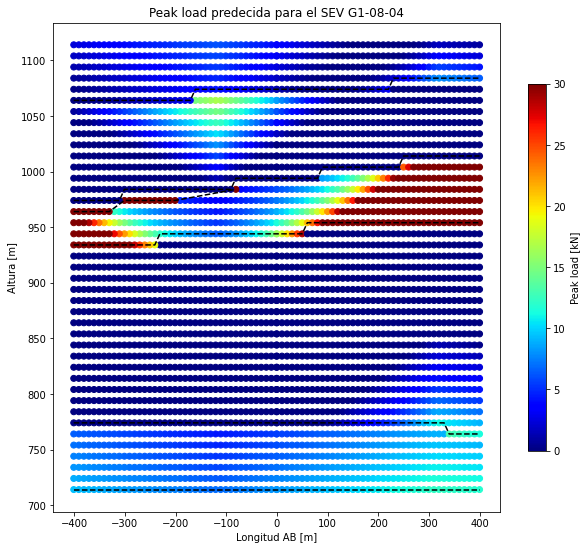

In [ ]:
#@title Predecir peakLoad
dfSEVinteres['peakLoad'] = mlp_pLoad.predict(dfSEVinteres[['X_norm', 'Y_norm', 'Z_norm', 'Df_norm', 'Geologia']])
#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfSEVinteres['AB'], dfSEVinteres['Z_2D'], 
            c=dfSEVinteres['peakLoad'], cmap='jet',
            norm=colors.Normalize(vmin=0, vmax=30))

#limites geologicos
for i in dfSEVinteres['Geologia'].unique():
  x = []
  y = []
  fil_geo = dfSEVinteres['Geologia'] == i
  for_geo = dfSEVinteres[fil_geo]
  for j in for_geo['AB'].unique():
    fil_Ab = for_geo['AB'] == j
    x.append(j)
    y.append((for_geo['Z_2D'][fil_Ab]).min()) 
    df = pd.DataFrame(list(zip(x, y)), columns=['x', 'y'])
    df2 = df.sort_values(by=['x'])
  plt.plot(df2['x'], df2['y'], 'k--')


plt.xlabel('Longitud AB [m]')
plt.ylabel('Altura [m]')
#plt.axis('equal')
plt.title(('Peak load predecida para el SEV {}').format(SEVinteres))
plt.colorbar(shrink=0.75, label='Peak load [kN]')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


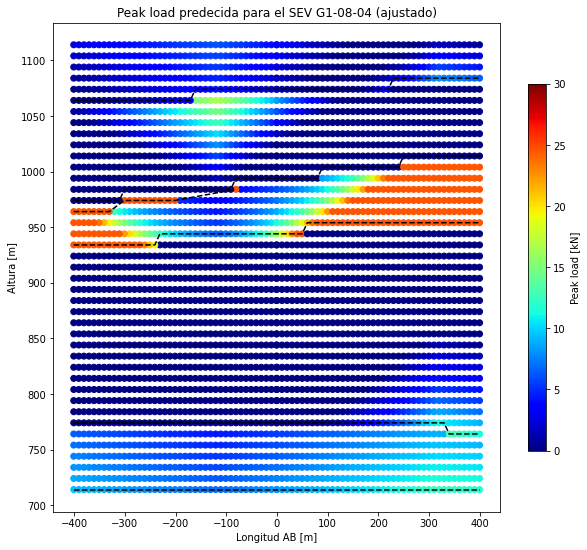

In [ ]:
#@title Predecir peakLoad ajustado
dfSEVinteres['peakLoad_c'] = dfSEVinteres['peakLoad']
fil_min = dfSEVinteres['peakLoad_c'] < petrofisica['PeakLoad'].min()
dfSEVinteres['peakLoad_c'][fil_min] = petrofisica['PeakLoad'].min()
fil_max = dfSEVinteres['peakLoad_c'] > petrofisica['PeakLoad'].max()
dfSEVinteres['peakLoad_c'][fil_max] = petrofisica['PeakLoad'].max()

#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfSEVinteres['AB'], dfSEVinteres['Z_2D'], 
            c=dfSEVinteres['peakLoad_c'], cmap='jet',
            norm=colors.Normalize(vmin=0, vmax=30))

#limites geologicos
for i in dfSEVinteres['Geologia'].unique():
  x = []
  y = []
  fil_geo = dfSEVinteres['Geologia'] == i
  for_geo = dfSEVinteres[fil_geo]
  for j in for_geo['AB'].unique():
    fil_Ab = for_geo['AB'] == j
    x.append(j)
    y.append((for_geo['Z_2D'][fil_Ab]).min()) 
    df = pd.DataFrame(list(zip(x, y)), columns=['x', 'y'])
    df2 = df.sort_values(by=['x'])
  plt.plot(df2['x'], df2['y'], 'k--')


plt.xlabel('Longitud AB [m]')
plt.ylabel('Altura [m]')
#plt.axis('equal')
plt.title(('Peak load predecida para el SEV {} (ajustado)').format(SEVinteres))
plt.colorbar(shrink=0.75, label='Peak load [kN]')

if savePlot == True:
  plt.savefig(('/content/drive/MyDrive/LosSantos/FigurasSEVs/{}PeakLoad.png').format(SEVinteres),
              format='png', dpi=300, bbox_inches = 'tight',pad_inches=0.25)
plt.show()

#Mapa superficial

Haciendo uso de estas redes, realizo el análisis del mapa superficial para cada propiedad. También presento el mapa geológico original y el que predice la red neuronal.

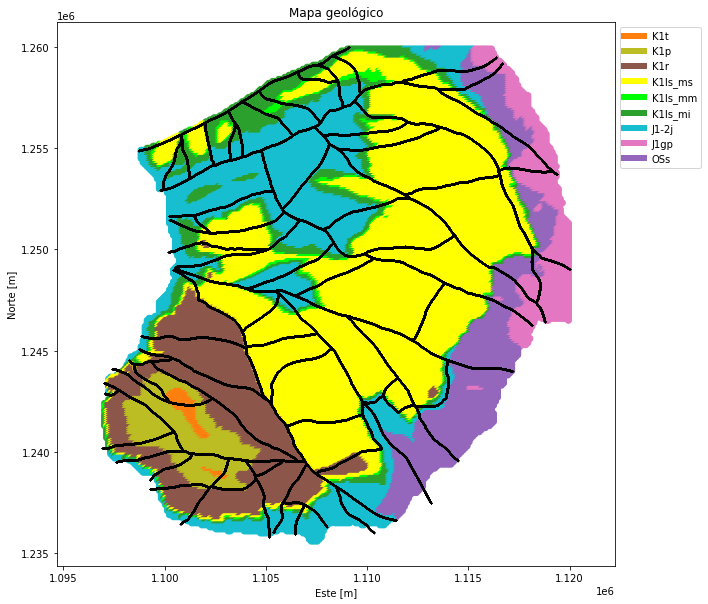

In [23]:
plt.figure(figsize=(10,10))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], c=dfMapaSup['colorUnidad'])
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.legend(custom_lines, labels_unidad, bbox_to_anchor=(1, 1))
plt.axis('equal')
plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
plt.title('Mapa geológico')
plt.show()

In [24]:
'''
#normalizo
dfMapaSup['X_norm'] = (dfMapaSup['coorX'] - 1171611) / 185926.90
dfMapaSup['Y_norm'] = (dfMapaSup['coorY'] - 1272689) / 74772.29
dfMapaSup['Z_norm'] = (dfMapaSup['coorZ'] - 1071.45) / 465.95
dfMapaSup['Df_norm'] = (dfMapaSup['distFault'] - 376.26) / 317.57
'''
#normalizo las nuevas
dfMapaSup['X_norm'] = (dfMapaSup['coorX'] - 1096700) / (1120100 - 1096700)
dfMapaSup['Y_norm'] = (dfMapaSup['coorY'] - 1235500) / (1260100 - 1235500)
dfMapaSup['Z_norm'] = (dfMapaSup['coorZ'] - (-150)) / (1830 - (-150)) 
dfMapaSup['Df_norm'] = (dfMapaSup['distFault'] - (000)) / (3000 - (000))

dfMapaSup.head()

,coorX,coorY,coorZ,distFault,Unidad,colorUnidad,codigoUnidad,X_norm,Y_norm,Z_norm,Df_norm
0,1109036.77,1259898.34,1284.0,48.86,K1ls_mi,tab:green,3,0.527212,0.991802,0.724242,0.016287
1,1109136.77,1259898.34,1309.0,99.65,K1ls_mi,tab:green,3,0.531486,0.991802,0.736869,0.033217
2,1109236.77,1259898.34,1317.0,163.49,K1ls_mi,tab:green,3,0.535759,0.991802,0.740909,0.054497
3,1109336.77,1259898.34,1330.0,250.61,K1ls_mi,tab:green,3,0.540033,0.991802,0.747475,0.083537
4,1109436.77,1259898.34,1350.0,344.79,K1ls_mi,tab:green,3,0.544306,0.991802,0.757576,0.114930


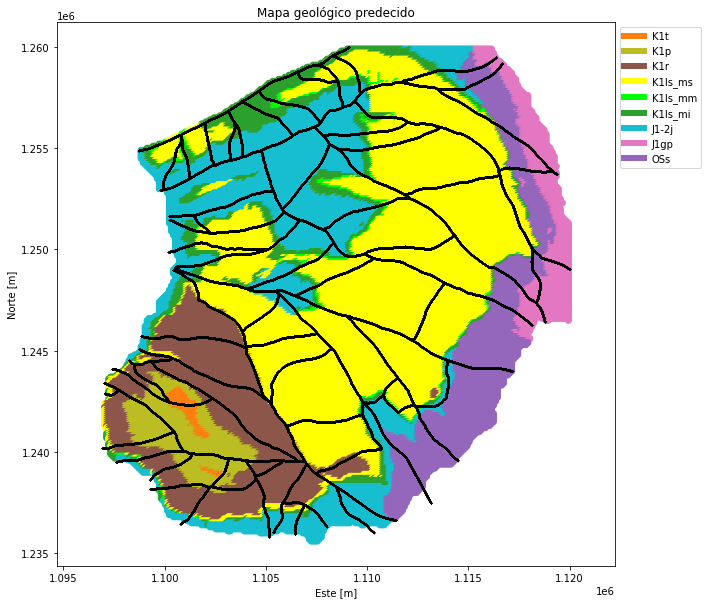

In [29]:
dfMapaSup['GeoPrede'] = mlp_geo.predict(dfMapaSup[['X_norm', 'Y_norm', 'Z_norm']])
dfMapaSup['colorPrede'] = dfMapaSup['GeoPrede'].replace(NNgeo_color)

plt.figure(figsize=(10,10))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], c=dfMapaSup['colorPrede'])
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.legend(custom_lines, labels_unidad, bbox_to_anchor=(1, 1))
plt.axis('equal')
plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
plt.title('Mapa geológico predecido')
plt.show()

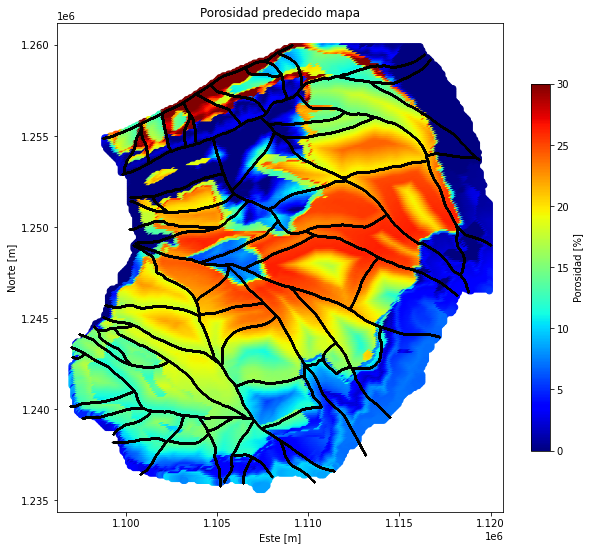

In [70]:
#@title Predecir porosidad
dfMapaSup['Porosidad'] = mlp_poro.predict(dfMapaSup[['X_norm', 'Y_norm', 'Z_norm', 'Df_norm', 'codigoUnidad']])
#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], 
            c=dfMapaSup['Porosidad'], cmap='jet',
            norm=colors.Normalize(vmin=0, vmax=30))
plt.axis('equal')
plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
plt.title('Porosidad predecido mapa')
plt.colorbar(shrink=0.75, label='Porosidad [%]')
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


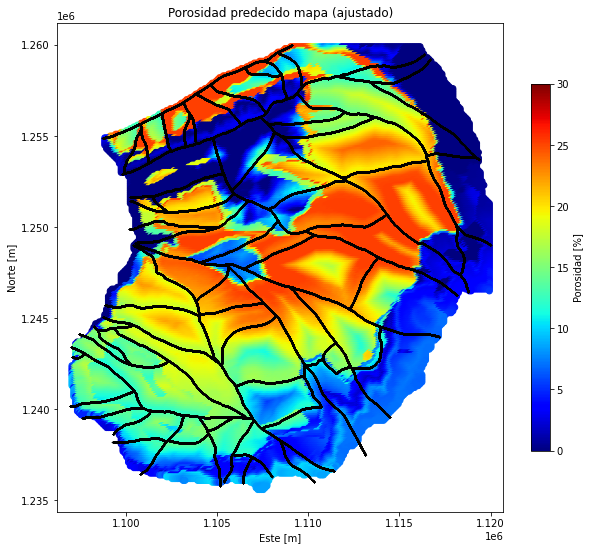

In [71]:
#@title Predecir porosidad ajustado
dfMapaSup['Porosidad_c'] = dfMapaSup['Porosidad']
fil_min = dfMapaSup['Porosidad_c'] < petrofisica['Porosidad'].min()
dfMapaSup['Porosidad_c'][fil_min] = petrofisica['Porosidad'].min()
fil_max = dfMapaSup['Porosidad_c'] > petrofisica['Porosidad'].max()
dfMapaSup['Porosidad_c'][fil_max] = petrofisica['Porosidad'].max()


#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], 
            c=dfMapaSup['Porosidad_c'], cmap='jet',
            norm=colors.Normalize(vmin=0, vmax=30))
plt.axis('equal')
plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
plt.title('Porosidad predecido mapa (ajustado)')
plt.colorbar(shrink=0.75, label='Porosidad [%]')
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.show()

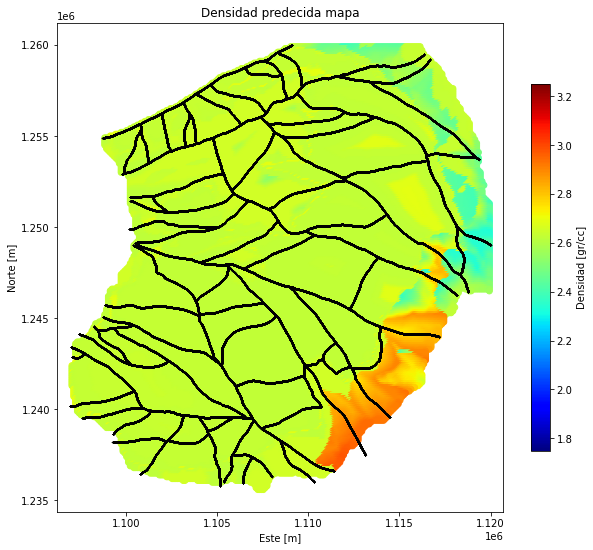

In [72]:
#@title Predecir densidad
dfMapaSup['Densidad'] = mlp_dens.predict(dfMapaSup[['X_norm', 'Y_norm', 'Z_norm', 'Df_norm', 'codigoUnidad']])
#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], 
            c=dfMapaSup['Densidad'], cmap='jet',
            norm=colors.Normalize(vmin=1.75, vmax=3.25))
plt.axis('equal')
plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
#plt.axis('equal')
plt.title('Densidad predecida mapa')
plt.colorbar(shrink=0.75, label='Densidad [gr/cc]')
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


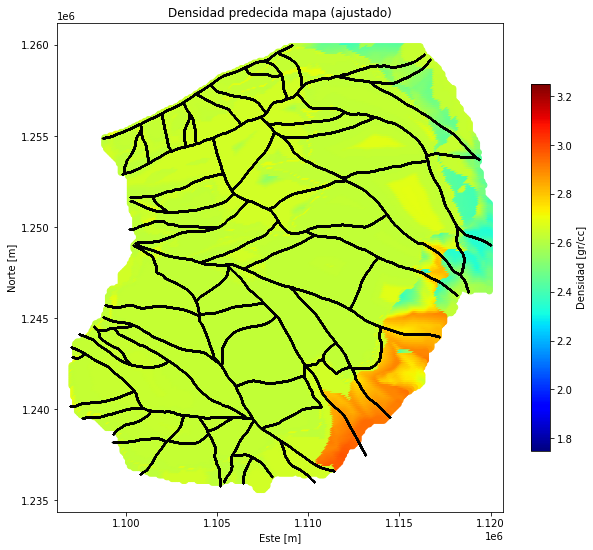

In [73]:
#@title Predecir densidad ajustado
dfMapaSup['Densidad_c'] = dfMapaSup['Densidad']
fil_min = dfMapaSup['Densidad_c'] < petrofisica['Densidad'].min()
dfMapaSup['Densidad_c'][fil_min] = petrofisica['Densidad'].min()
fil_max = dfMapaSup['Densidad_c'] > petrofisica['Densidad'].max()
dfMapaSup['Densidad_c'][fil_max] = petrofisica['Densidad'].max()


dfMapaSup['Densidad']
#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], 
            c=dfMapaSup['Densidad_c'], cmap='jet',
            norm=colors.Normalize(vmin=1.75, vmax=3.25))
plt.axis('equal')
plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
#plt.axis('equal')
plt.title('Densidad predecida mapa (ajustado)')
plt.colorbar(shrink=0.75, label='Densidad [gr/cc]')
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.show()

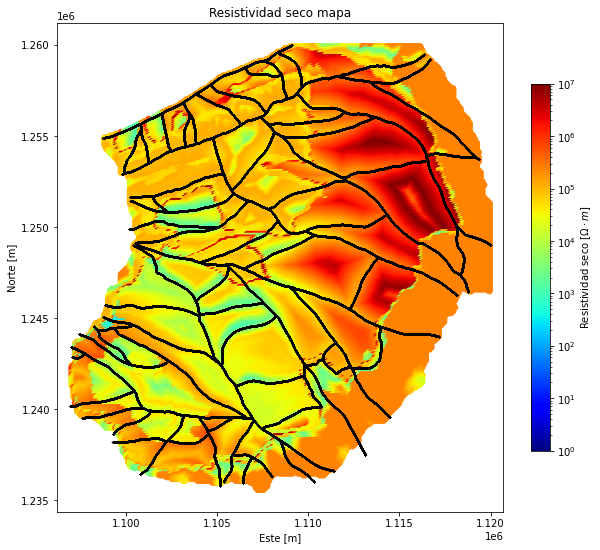

In [74]:
#@title Predecir rhoDry
dfMapaSup['rhoDry'] = mlp_rDry.predict(dfMapaSup[['X_norm', 'Y_norm', 'Z_norm', 'Df_norm', 'codigoUnidad']])
#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], 
            c=10**dfMapaSup['rhoDry'], cmap='jet',
            norm=colors.LogNorm(vmin=10**0, vmax=10**7))
plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
plt.axis('equal')
plt.title('Resistividad seco mapa')
plt.colorbar(shrink=0.75, label='Resistividad seco [$\Omega \cdot m$]')
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


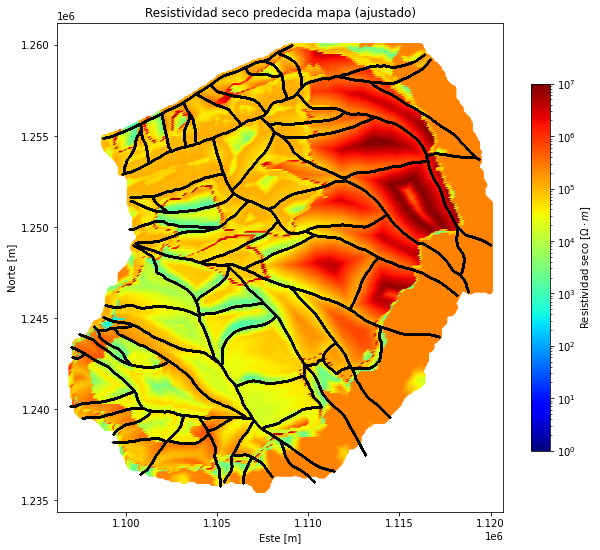

In [75]:
#@title Predecir rhoDry ajustado
dfMapaSup['rhoDry_c'] = dfMapaSup['rhoDry']
fil_min = dfMapaSup['rhoDry'] < np.log10(petrofisica['RhoDry'].min())
dfMapaSup['rhoDry_c'][fil_min] = np.log10(petrofisica['RhoDry'].min())
fil_max = dfMapaSup['rhoDry'] > np.log10(petrofisica['RhoDry'].max())
dfMapaSup['rhoDry_c'][fil_max] = np.log10(petrofisica['RhoDry'].max())

#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], 
            c=10**dfMapaSup['rhoDry'], cmap='jet',
            norm=colors.LogNorm(vmin=10**0, vmax=10**7))
plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
plt.axis('equal')
plt.title('Resistividad seco predecida mapa (ajustado)')
plt.colorbar(shrink=0.75, label='Resistividad seco [$\Omega \cdot m$]')
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.show()


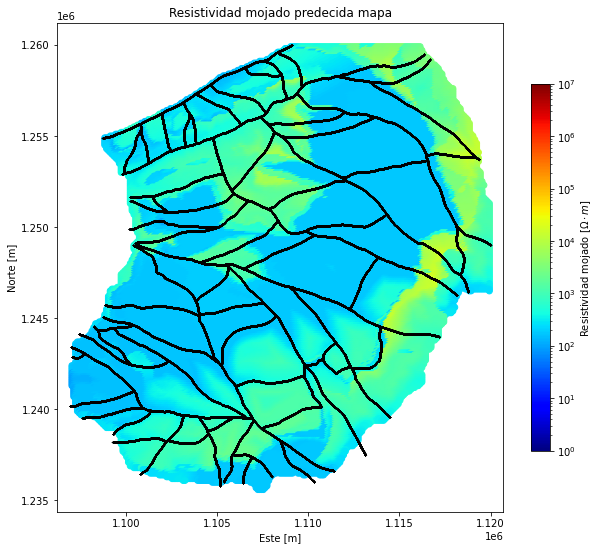

In [76]:
#@title Predecir rhoWet
dfMapaSup['rhoWet'] = mlp_rWet.predict(dfMapaSup[['X_norm', 'Y_norm', 'Z_norm', 'Df_norm', 'codigoUnidad']])
#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], 
            c=10**dfMapaSup['rhoWet'], cmap='jet',
            norm=colors.LogNorm(vmin=10**0, vmax=10**7))
plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
plt.axis('equal')
plt.title('Resistividad mojado predecida mapa')
plt.colorbar(shrink=0.75, label='Resistividad mojado [$\Omega \cdot m$]')
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


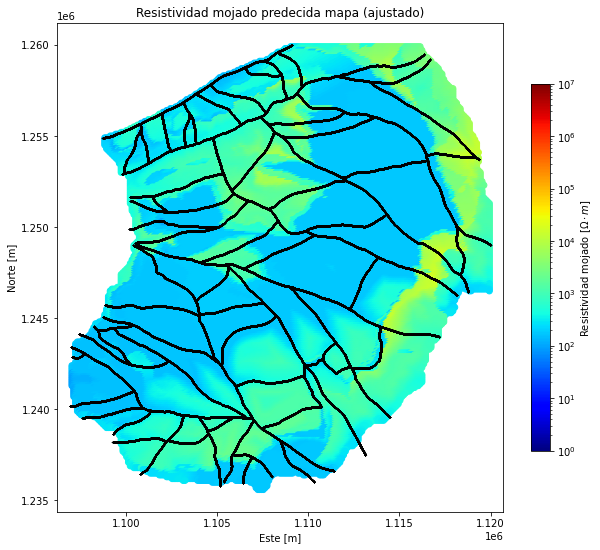

In [77]:
#@title Predecir rhoWet ajustado
dfMapaSup['rhoWet_c'] = dfMapaSup['rhoWet']
fil_min = dfMapaSup['rhoWet'] < np.log10(petrofisica['RhoWet'].min())
dfMapaSup['rhoWet_c'][fil_min] = np.log10(petrofisica['RhoWet'].min())
fil_max = dfMapaSup['rhoWet'] > np.log10(petrofisica['RhoWet'].max())
dfMapaSup['rhoWet_c'][fil_max] = np.log10(petrofisica['RhoWet'].max())

#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], 
            c=10**dfMapaSup['rhoWet'], cmap='jet',
            norm=colors.LogNorm(vmin=10**0, vmax=10**7))
plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
plt.axis('equal')
plt.title('Resistividad mojado predecida mapa (ajustado)')
plt.colorbar(shrink=0.75, label='Resistividad mojado [$\Omega \cdot m$]')
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.show()

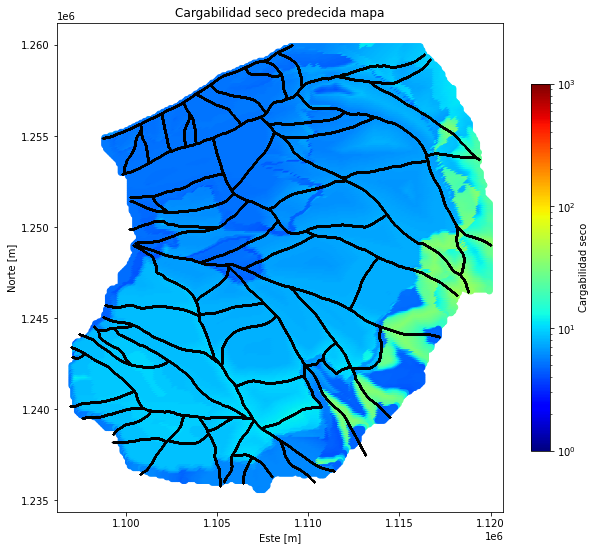

In [78]:
#@title Predecir cargDry
dfMapaSup['cargDry'] = mlp_cDry.predict(dfMapaSup[['X_norm', 'Y_norm', 'Z_norm', 'Df_norm', 'codigoUnidad']])
#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], 
            c=dfMapaSup['cargDry'], cmap='jet',
            norm=colors.LogNorm(vmin=10**0, vmax=10**3))

plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
plt.axis('equal')
plt.title('Cargabilidad seco predecida mapa')
plt.colorbar(shrink=0.75, label='Cargabilidad seco')
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


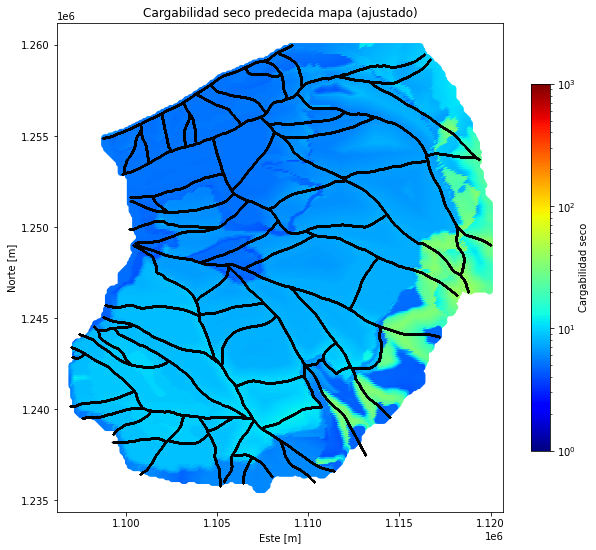

In [79]:
#@title Predecir cargDry ajustado
dfMapaSup['cargDry_c'] = dfMapaSup['cargDry']
fil_min = dfMapaSup['cargDry'] < petrofisica['CargDry'].min()
dfMapaSup['cargDry_c'][fil_min] = petrofisica['CargDry'].min()
fil_max = dfMapaSup['cargDry'] > petrofisica['CargDry'].max()
dfMapaSup['cargDry_c'][fil_max] = petrofisica['CargDry'].max()

#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], 
            c=dfMapaSup['cargDry_c'], cmap='jet',
            norm=colors.LogNorm(vmin=10**0, vmax=10**3))

plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
plt.axis('equal')
plt.title('Cargabilidad seco predecida mapa (ajustado)')
plt.colorbar(shrink=0.75, label='Cargabilidad seco')
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.show()

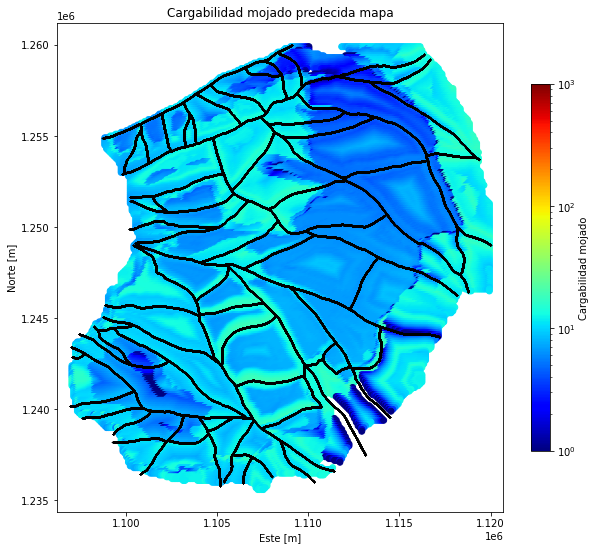

In [80]:
#@title Predecir cargWet
dfMapaSup['cargWet'] = mlp_cWet.predict(dfMapaSup[['X_norm', 'Y_norm', 'Z_norm', 'Df_norm', 'codigoUnidad']])
#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], 
            c=dfMapaSup['cargWet'], cmap='jet',
            norm=colors.LogNorm(vmin=10**0, vmax=10**3))
plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
plt.axis('equal')
plt.title('Cargabilidad mojado predecida mapa')
plt.colorbar(shrink=0.75, label='Cargabilidad mojado')
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


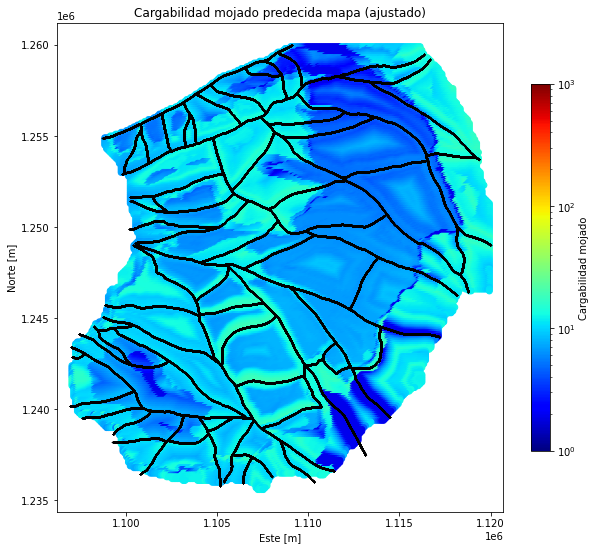

In [81]:
#@title Predecir cargWet ajustado
dfMapaSup['cargWet_c'] = dfMapaSup['cargWet']
fil_min = dfMapaSup['cargWet'] < petrofisica['CargWet'].min()
dfMapaSup['cargWet_c'][fil_min] = petrofisica['CargWet'].min()
fil_max = dfMapaSup['cargWet'] > petrofisica['CargWet'].max()
dfMapaSup['cargWet_c'][fil_max] = petrofisica['CargWet'].max()

#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], 
            c=dfMapaSup['cargWet_c'], cmap='jet',
            norm=colors.LogNorm(vmin=10**0, vmax=10**3))
plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
plt.axis('equal')
plt.title('Cargabilidad mojado predecida mapa (ajustado)')
plt.colorbar(shrink=0.75, label='Cargabilidad mojado')
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.show()


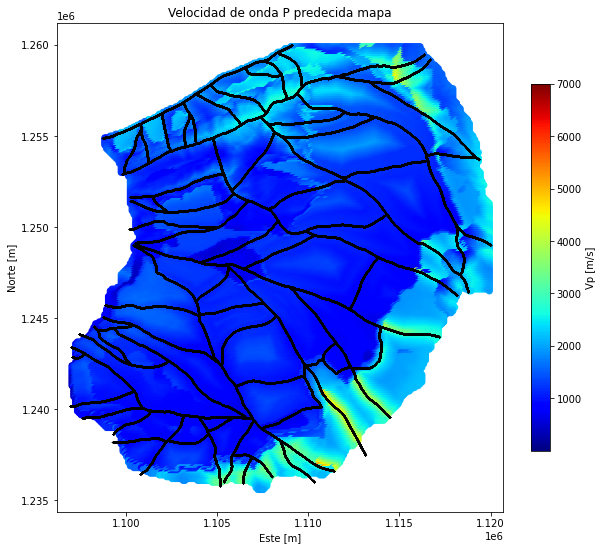

In [82]:
#@title Predecir Vp
dfMapaSup['Vp'] = mlp_Vp.predict(dfMapaSup[['X_norm', 'Y_norm', 'Z_norm', 'Df_norm', 'codigoUnidad']])
#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], 
            c=10**dfMapaSup['Vp'], cmap='jet',
            norm=colors.Normalize(vmin=10**0, vmax=7*10**3))
plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
plt.axis('equal')
plt.title('Velocidad de onda P predecida mapa')
plt.colorbar(shrink=0.75, label='Vp [m/s]')
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


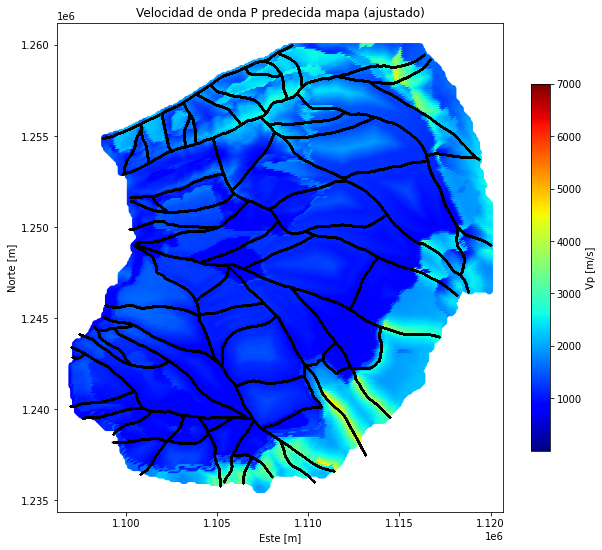

In [83]:
#@title Predecir Vp ajustado
dfMapaSup['Vp_c'] = dfMapaSup['Vp']
fil_min = dfMapaSup['Vp'] < np.log10(petrofisica['Vp'].min())
dfMapaSup['Vp_c'][fil_min] = np.log10(petrofisica['Vp'].min())
fil_max = dfMapaSup['Vp'] > np.log10(petrofisica['Vp'].max())
dfMapaSup['Vp_c'][fil_max] = np.log10(petrofisica['Vp'].max())

#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], 
            c=10**dfMapaSup['Vp_c'], cmap='jet',
            norm=colors.Normalize(vmin=10**0, vmax=7*10**3))
plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
plt.axis('equal')
plt.title('Velocidad de onda P predecida mapa (ajustado)')
plt.colorbar(shrink=0.75, label='Vp [m/s]')
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.show()


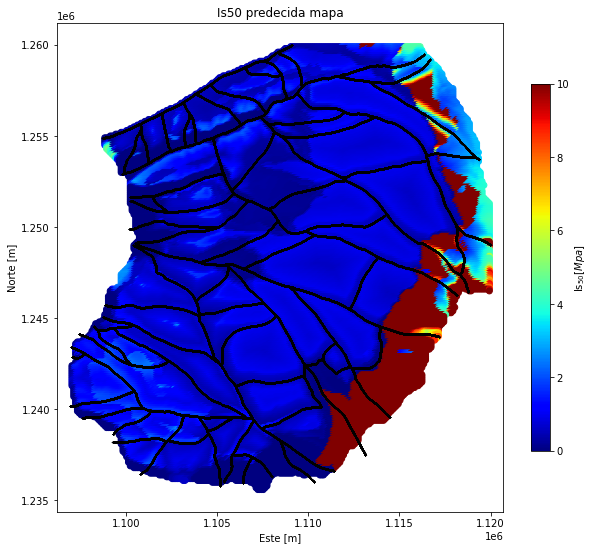

In [84]:
#@title Predecir Is50
dfMapaSup['Is50'] = mlp_Is50.predict(dfMapaSup[['X_norm', 'Y_norm', 'Z_norm', 'Df_norm', 'codigoUnidad']])
#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], 
            c=dfMapaSup['Is50'], cmap='jet',
            norm=colors.Normalize(vmin=0, vmax=10))
plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
plt.axis('equal')
plt.title('Is50 predecida mapa')
plt.colorbar(shrink=0.75, label='Is$_{50} [Mpa]$')
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


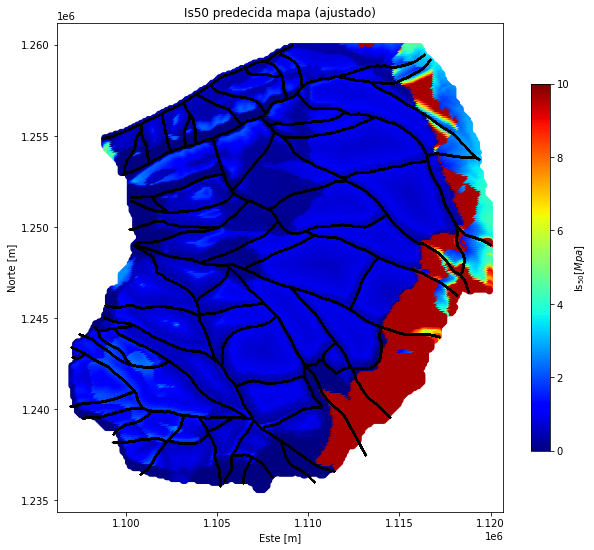

In [85]:
#@title Predecir Is50 ajustado
dfMapaSup['Is50_c'] = dfMapaSup['Is50']
fil_min = dfMapaSup['Is50'] < petrofisica['Is50'].min()
dfMapaSup['Is50_c'][fil_min] = petrofisica['Is50'].min()
fil_max = dfMapaSup['Is50'] > petrofisica['Is50'].max()
dfMapaSup['Is50_c'][fil_max] = petrofisica['Is50'].max()

#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], 
            c=dfMapaSup['Is50_c'], cmap='jet',
            norm=colors.Normalize(vmin=0, vmax=10))
plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
plt.axis('equal')
plt.title('Is50 predecida mapa (ajustado)')
plt.colorbar(shrink=0.75, label='Is$_{50} [Mpa]$')
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.show()


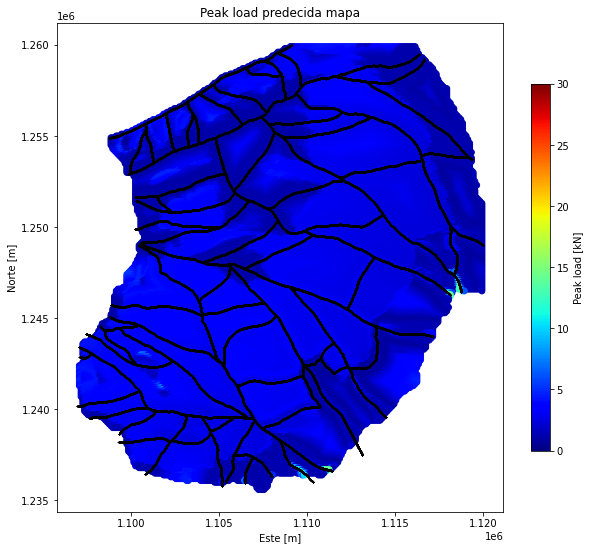

In [86]:
#@title Predecir peakLoad
dfMapaSup['peakLoad'] = mlp_pLoad.predict(dfMapaSup[['X_norm', 'Y_norm', 'Z_norm', 'Df_norm', 'codigoUnidad']])
#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], 
            c=dfMapaSup['peakLoad'], cmap='jet',
            norm=colors.Normalize(vmin=0, vmax=30))
plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
#plt.axis('equal')
plt.title('Peak load predecida mapa')
plt.colorbar(shrink=0.75, label='Peak load [kN]')
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


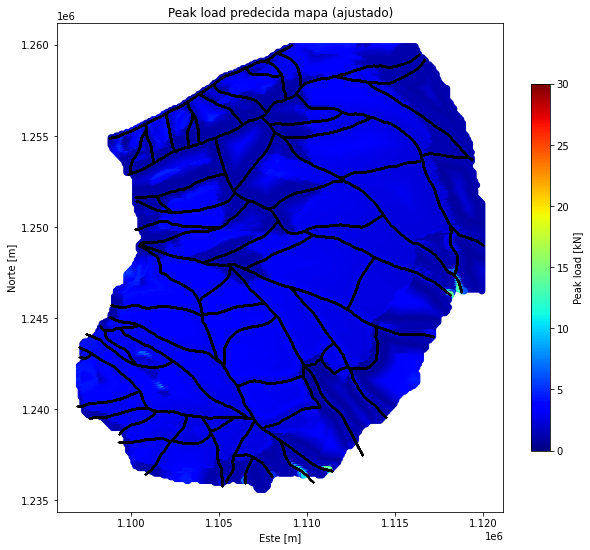

In [87]:
#@title Predecir peakLoad ajustada
dfMapaSup['peakLoad_c'] = dfMapaSup['peakLoad']
fil_min = dfMapaSup['peakLoad_c'] < petrofisica['PeakLoad'].min()
dfMapaSup['peakLoad_c'][fil_min] = petrofisica['PeakLoad'].min()
fil_max = dfMapaSup['peakLoad_c'] > petrofisica['PeakLoad'].max()
dfMapaSup['peakLoad_c'][fil_max] = petrofisica['PeakLoad'].max()

#plot 2D
plt.figure(figsize=(10,9))
plt.scatter(dfMapaSup['coorX'], dfMapaSup['coorY'], 
            c=dfMapaSup['peakLoad_c'], cmap='jet',
            norm=colors.Normalize(vmin=0, vmax=30))
plt.xlabel('Este [m]')
plt.ylabel('Norte [m]')
#plt.axis('equal')
plt.title('Peak load predecida mapa (ajustado)')
plt.colorbar(shrink=0.75, label='Peak load [kN]')
plt.scatter(df_PuntosFallas['CoorX'], df_PuntosFallas['CoorY'], c='k', s=0.1)
plt.show()

In [88]:
#guardo mapa sup predecido
dfMapaSup['rhoDry_c'] = 10**dfMapaSup['rhoDry_c']
dfMapaSup['rhoWet_c'] = 10**dfMapaSup['rhoWet_c']
dfMapaSup['Vp_c'] = 10**dfMapaSup['Vp_c']


dfMapaSup.to_csv('mapSupPrede.csv', decimal='.', sep=',')

dfMapaSup.head()

,coorX,coorY,coorZ,distFault,Unidad,colorUnidad,codigoUnidad,X_norm,Y_norm,Z_norm,Df_norm,GeoPrede,colorPrede,Porosidad,Porosidad_c,Densidad,Densidad_c,rhoDry,rhoDry_c,rhoWet,rhoWet_c,cargDry,cargDry_c,cargWet,cargWet_c,Vp,Vp_c,Is50,Is50_c,peakLoad,peakLoad_c
0,1109036.77,1259898.34,1284.0,48.86,K1ls_mi,tab:green,3,0.527212,0.991802,0.724242,0.016287,3,tab:green,30.695019,25.21,2.629209,2.629209,4.966118,92494.890412,2.365582,232.050258,5.856363,5.856363,8.892319,8.892319,3.289643,1948.244245,0.458198,0.458198,1.297385,1.297385
1,1109136.77,1259898.34,1309.0,99.65,K1ls_mi,tab:green,3,0.531486,0.991802,0.736869,0.033217,3,tab:green,31.142698,25.21,2.628303,2.628303,4.938332,86762.409991,2.385948,243.191278,5.870985,5.870985,8.536416,8.536416,3.287183,1937.237568,0.429882,0.429882,1.607773,1.607773
2,1109236.77,1259898.34,1317.0,163.49,K1ls_mi,tab:green,3,0.535759,0.991802,0.740909,0.054497,3,tab:green,31.021882,25.21,2.627039,2.627039,4.871034,74307.764020,2.397483,249.737326,5.887005,5.887005,7.961756,7.961756,3.283229,1919.678852,0.408269,0.408269,2.090121,2.090121
3,1109336.77,1259898.34,1330.0,250.61,K1ls_mi,tab:green,3,0.540033,0.991802,0.747475,0.083537,3,tab:green,30.618069,25.21,2.625426,2.625426,4.787762,61342.551840,2.410729,257.471561,5.885273,5.885273,7.211863,7.211863,3.286683,1935.008489,0.382322,0.382322,2.547179,2.547179
4,1109436.77,1259898.34,1350.0,344.79,K1ls_mi,tab:green,3,0.544306,0.991802,0.757576,0.114930,3,tab:green,30.374023,25.21,2.623752,2.623752,4.708106,51062.996420,2.468287,293.959462,5.875016,5.875016,6.442202,6.442202,3.263714,1835.331221,0.364978,0.364978,2.986441,2.986441
